In [574]:
import scipy
import matplotlib
import numpy as np
import math
import pylab
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib import colorbar
from matplotlib.patches import Ellipse
from matplotlib.ticker import LogFormatter
from matplotlib.ticker import LogFormatterExponent
from matplotlib.ticker import LogLocator
from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import FixedLocator
from matplotlib.colors import LogNorm
from matplotlib.colors import Normalize
from matplotlib.ticker import MultipleLocator
from astropy.table import Table, vstack, join
from astropy.io import ascii, fits
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.optimize import curve_fit
from collections import Counter
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
import lmfit
from scipy import interpolate
from scipy.interpolate import interp1d
from scipy.interpolate import UnivariateSpline
from scipy import interpolate
import time
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from scipy.optimize import fsolve
from sklearn.model_selection import cross_validate, KFold
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, roc_auc_score
pd.options.mode.copy_on_write = True

In [575]:
## Common function for reading files and preprocessing data
#def read_fits_and_cut(input_file_name):
#    table = Table.read(input_file_name)
#    df = table.to_pandas()
#    df['id'] = df['id'].astype(str)
#    for column in df.columns:
#        if df[column].dtype == 'object' and isinstance(df[column][0], bytes):
#            df[column] = df[column].str.decode('utf-8')
#    df['g0'] = df['gpsf'] - df['a_g'] #a_g: galactic extinction in g band (HSC has girn-band)
#    df['i0'] = df['ipsf'] - df['a_i']
#    df['n0'] = df['npsf'] - df['a_n']
#    df['MGH'] = df['MGFE'] + df['FEH']
#    #df = df[(-0.0 < df['MGFEERR']) & (df['MGFEERR'] < 0.5)] #or df = df[(-0.80 <= df['MGFE']) & (df['MGFE'] < 1.20)]
#    return df

def read_fits_and_cut_plus(input_file_name):
    df = pd.read_csv(input_file_name)
    df['id'] = df['id'].astype(str)
    df.drop(['MASK','SLIT','B', 'V', 'R', 'I', 'J', 'H', 'K', 'BERR', 'VERR', 'RERR', 'IERR', 'JERR', 'HERR', 'KERR', 'PHOT_COLOR',
            'AGE','TEFFERR','LOGGERR','ALPHAFE', 'ALPHAFEERR','SIFE', 'SIFEERR', 'CAFE', 'CAFEERR', 'TIFE', 'TIFEERR'], axis=1, inplace=True)
    for column in df.columns:
        if df[column].dtype == 'object' and isinstance(df[column][0], bytes):
            df[column] = df[column].str.decode('utf-8')
    df = df[(-0.0 < df['MGFEERR']) & (df['MGFEERR'] < 0.5)]
    return df
    
def read_hsc(input_file_name):
    data = ascii.read(input_file_name,
        names=['id', 'ra', 'dec', 'X', 'Y', 'ipsf', 'gpsf', 'npsf', 'ipsferr',
        'gpsferr', 'npsferr', 'cli', 'clg', 'cln', 'a_i', 'a_g', 'a_n'])
    df = data.to_pandas()
    df['id'] = df['id'].astype(str)
    for column in df.columns:
        if df[column].dtype == 'object' and isinstance(df[column][0], bytes):
            df[column] = df[column].str.decode('utf-8')
    df['g0'] = df['gpsf'] - df['a_g']
    df['i0'] = df['ipsf'] - df['a_i']
    df['n0'] = df['npsf'] - df['a_n']
    return df

def read_hsc_members(input_file_name):
    df = pd.read_csv(input_file_name)
    df['id'] = df['id'].astype(str)
    for column in df.columns:
        if df[column].dtype == 'object' and isinstance(df[column][0], bytes):
            df[column] = df[column].str.decode('utf-8')
    return df

In [576]:
## Read HSC-DEIMOS files
fnx = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Fornax_DEIMOS_Evan_Lauren.csv')
scl = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Sculptor_DEIMOS_Evan_Lauren.csv')
umi = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Ursaminor_DEIMOS_Evan_Lauren.csv')
dra = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Draco_DEIMOS_Evan_Lauren.csv')
print(f'len(fnx) = {len(fnx)}') #628 -> 360
print(f'len(scl) = {len(scl)}') #599 -> 361
print(f'len(umi) = {len(umi)}') #384 -> 108
print(f'len(dra) = {len(dra)}') #346 -> 130

## Read whole HSC data
hsc_fnx = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/fornax_tpall3e_g24_radec_members_cut.csv')
hsc_scl = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/sculptor_tpall3e_g24_radec_members_cut.csv')
hsc_umi = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/ursaminor_tpall3e_g24_radec_members_cut.csv')
hsc_dra = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/draco_tpall3e_g24_radec_members_cut.csv')
print(f'len(hsc_fnx) = {len(hsc_fnx)}') #49704
print(f'len(hsc_scl) = {len(hsc_scl)}') #10360
print(f'len(hsc_umi) = {len(hsc_umi)}') #5891
print(f'len(hsc_dra) = {len(hsc_dra)}') #5430

len(fnx) = 360
len(scl) = 361
len(umi) = 108
len(dra) = 130
len(hsc_fnx) = 49704
len(hsc_scl) = 10360
len(hsc_umi) = 5891
len(hsc_dra) = 5430


In [577]:
#umi = pd.concat([umi] * 3, ignore_index=True)
#print(f'len(umi) = {len(umi)}')  # 93 * 3 = 279
#dra = pd.concat([dra] * 3, ignore_index=True)
#print(f'len(dra) = {len(dra)}')  # 93 * 3 = 279

In [578]:
# Define the distance modulus for each dataset from McConnachie (2012)
dm_values = {
    'fnx': 20.84,
    'scl': 19.67,
    'umi': 19.4,
    'dra': 19.4
}

# Define the datasets
datasets = {
    'fnx': [fnx, hsc_fnx],
    'scl': [scl, hsc_scl],
    'umi': [umi, hsc_umi],
    'dra': [dra, hsc_dra]
}

# Apply the distance modulus correction and store as G0
for key, dataset_list in datasets.items():
    dm = dm_values[key]
    for dataset in dataset_list:
        dataset['Mg0'] = dataset['g0'] - dm
        dataset['Mi0'] = dataset['i0'] - dm
        dataset['Mn0'] = dataset['n0'] - dm

In [579]:
xmin, xmax = 0.4, 2

Mg0_max = -0.20 ; Mn0_max = -0.30 ; Mi0_max = -1.18
fnx_mag = fnx[(xmin < fnx['Mg0']-fnx['Mi0']) & (fnx['Mg0']-fnx['Mi0'] < xmax) & (fnx['Mg0'] < Mg0_max) & (fnx['Mn0'] < Mn0_max) & (fnx['Mi0'] < Mi0_max)]
print('len(fnx_mag) =', len(fnx), '->', len(fnx_mag)) #360 -> 298
hsc_fnx_mag = hsc_fnx[(xmin < hsc_fnx['Mg0']-hsc_fnx['Mi0']) & (hsc_fnx['Mg0']-hsc_fnx['Mi0'] < xmax) & (hsc_fnx['Mg0'] < Mg0_max) & (hsc_fnx['Mn0'] < Mn0_max) & (hsc_fnx['Mi0'] < Mi0_max)]
print('len(hsc_fnx_mag) =', len(hsc_fnx), '->', len(hsc_fnx_mag)) #49704 -> 7874

Mg0_max = 0.18 ; Mn0_max = 0.08 ; Mi0_max = -0.70
scl_mag = scl[(xmin < scl['Mg0']-scl['Mi0']) & (scl['Mg0']-scl['Mi0'] < xmax) & (scl['Mg0'] < Mg0_max) & (scl['Mn0'] < Mn0_max) & (scl['Mi0'] < Mi0_max)]
print('len(scl_mag) =', len(scl), '->', len(scl_mag)) #361 -> 316
hsc_scl_mag = hsc_scl[(xmin < hsc_scl['Mg0']-hsc_scl['Mi0']) & (hsc_scl['Mg0']-hsc_scl['Mi0'] < xmax) & (hsc_scl['Mg0'] < Mg0_max) & (hsc_scl['Mn0'] < Mn0_max) & (hsc_scl['Mi0'] < Mi0_max)]
print('len(hsc_scl_mag) =', len(hsc_scl), '->', len(hsc_scl_mag)) #10360 -> 1449

Mg0_max = 1.00 ; Mn0_max = 0.85 ; Mi0_max = 0.15
umi_mag = umi[(xmin < umi['Mg0']-umi['Mi0']) & (umi['Mg0']-umi['Mi0'] < xmax) & (umi['Mg0'] < Mg0_max) & (umi['Mn0'] < Mn0_max) & (umi['Mi0'] < Mi0_max)]
print('len(umi_mag) =', len(umi), '->', len(umi_mag)) #108 -> 92
hsc_umi_mag = hsc_umi[(xmin < hsc_umi['Mg0']-hsc_umi['Mi0']) & (hsc_umi['Mg0']-hsc_umi['Mi0'] < xmax) & (hsc_umi['Mg0'] < Mg0_max) & (hsc_umi['Mn0'] < Mn0_max) & (hsc_umi['Mi0'] < Mi0_max)]
print('len(hsc_umi_mag) =', len(hsc_umi), '->', len(hsc_umi_mag)) #5891 -> 862

Mg0_max = 0.65 ; Mn0_max = 0.50 ; Mi0_max = -0.20
dra_mag = dra[(xmin < dra['Mg0']-dra['Mi0']) & (dra['Mg0']-dra['Mi0'] < xmax) & (dra['Mg0'] < Mg0_max) & (dra['Mn0'] < Mn0_max) & (dra['Mi0'] < Mi0_max)]
print('len(dra_mag) =', len(dra), '->', len(dra_mag)) #130 -> 105
hsc_dra_mag = hsc_dra[(xmin < hsc_dra['Mg0']-hsc_dra['Mi0']) & (hsc_dra['Mg0']-hsc_dra['Mi0'] < xmax) & (hsc_dra['Mg0'] < Mg0_max) & (hsc_dra['Mn0'] < Mn0_max) & (hsc_dra['Mi0'] < Mi0_max)]
print('len(hsc_dra_mag) =', len(hsc_dra), '->', len(hsc_dra_mag)) #5430 -> 509

len(fnx_mag) = 360 -> 298
len(hsc_fnx_mag) = 49704 -> 7874
len(scl_mag) = 361 -> 316
len(hsc_scl_mag) = 10360 -> 1449
len(umi_mag) = 108 -> 92
len(hsc_umi_mag) = 5891 -> 862
len(dra_mag) = 130 -> 105
len(hsc_dra_mag) = 5430 -> 509


In [580]:
# Combine DEIMOS
frame = [fnx_mag, scl_mag, umi_mag, dra_mag]
df_mag = pd.concat(frame, ignore_index=True)
print('len(df_mag) =', len(df_mag)) #811
print(Counter(df_mag['DSPH'])) #Counter({'scl': 316, 'for': 298, 'dra': 105, 'umi': 92})

# Combine HSC
frame = [hsc_fnx_mag, hsc_scl_mag, hsc_umi_mag, hsc_dra_mag]
hsc_df_mag = pd.concat(frame, ignore_index=True)
print('len(hsc_df_mag) =', len(hsc_df_mag)) #10694
print(Counter(hsc_df_mag['name'])) #Counter({'for': 7874, 'scl': 1449, 'umi': 862, 'dra': 509})

len(df_mag) = 811
Counter({'scl': 316, 'for': 298, 'dra': 105, 'umi': 92})
len(hsc_df_mag) = 10694
Counter({'for': 7874, 'scl': 1449, 'umi': 862, 'dra': 509})


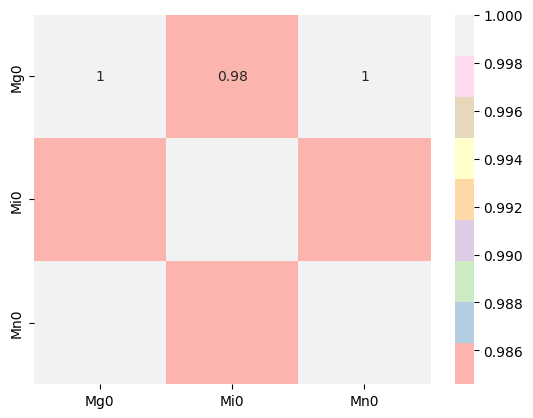

In [581]:
import seaborn as sns
corr_matrix = df_mag[['Mg0', 'Mi0', 'Mn0']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='Pastel1')
plt.show()

In [582]:
print("FEH at 568th element:", df_mag.iloc[568]['FEH'])

FEH at 568th element: -1.12


# RFR modeling

In [583]:
%%time

# Do one-hot incoding using pd.get_dummies
df_mag['DSPH_original'] = df_mag['DSPH']
df_mag = pd.get_dummies(df_mag, columns=['DSPH'])
df_mag['galaxy_id'] = (
    0 * df_mag['DSPH_for'] +
    1 * df_mag['DSPH_scl'] +
    2 * df_mag['DSPH_umi'] +
    3 * df_mag['DSPH_dra']
)
df_mag.rename(columns = {'DSPH_original':'DSPH'}, inplace=True)
df_mag['Mg0_Mi0'] = df_mag['Mg0'] - df_mag['Mi0']
df_mag['Mg0_Mn0'] = df_mag['Mg0'] - df_mag['Mn0']

indices = df_mag.index

kf = KFold(n_splits=5, shuffle=True, random_state=42)

def build_model(n_estimators, min_samples_leaf, max_features):
    model = RandomForestRegressor(
        n_estimators = n_estimators, 
        min_samples_leaf = min_samples_leaf, 
        max_features = max_features, 
        oob_score = True,
        random_state = 42
    )
    return model

model_FEH = build_model(500, 3, 0.5) #3 was supposed to be 1 / 11, 3, 0.5 are also possible

train_FEH_err_list = []
train_FEH_rmse_list = []
train_FEH_rsq_list = []
train_FEH_chisq_list = []

test_FEH_err_list = []
test_FEH_rmse_list = []
test_FEH_rsq_list = []
test_FEH_chisq_list = []

df_mag['FEH_phot_rfr_oob'] = np.nan        # Initialize storage for OOB predictions

# Iterate over each fold
for fold_idx, (train_index, test_index) in enumerate(kf.split(df_mag)):
    # Split into training and testing set for this fold
    train_FEH = df_mag.iloc[train_index]
    test_FEH = df_mag.iloc[test_index]

    # Train the model
    model_FEH.fit(train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values,
                  train_FEH['FEH'].values)

    # Predict on train and test sample
    train_FEH_pred_values = np.array([tree.predict(train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values) for tree in model_FEH.estimators_])
    train_FEH['FEH_phot_rfr'] = train_FEH_pred_values.mean(axis=0)
    train_FEH['FEH_phot_rfr_uncertainty'] = train_FEH_pred_values.std(axis=0)
    
    test_FEH_pred_values = np.array([tree.predict(test_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values) for tree in model_FEH.estimators_])
    test_FEH['FEH_phot_rfr'] = test_FEH_pred_values.mean(axis=0)
    test_FEH['FEH_phot_rfr_uncertainty'] = test_FEH_pred_values.std(axis=0)

    # Get OOB predictions
    train_FEH_oob_pred = model_FEH.oob_prediction_
    for idx, oob_value in zip(train_index, train_FEH_oob_pred):
        df_mag.loc[idx, 'FEH_phot_rfr_oob'] = oob_value      # This OOB prediction values are added to df_mag corresponding to the respective indices of each sample.
    
    # Error
    train_FEH_err = train_FEH['FEHERR'].values               # Or, you can do 'train_FEH_err = df_mag.loc[train_FEH.index, 'FEHERR']'
    test_FEH_err = test_FEH['FEHERR'].values
    train_FEH_err_list.append(np.mean(train_FEH_err))
    test_FEH_err_list.append(np.mean(test_FEH_err))

    # RMSE
    train_FEH_rmse = math.sqrt(mean_squared_error(train_FEH['FEH'].values, train_FEH['FEH_phot_rfr'].values))
    test_FEH_rmse = math.sqrt(mean_squared_error(test_FEH['FEH'].values, test_FEH['FEH_phot_rfr'].values))
    train_FEH_rmse_list.append(np.mean(train_FEH_rmse))
    test_FEH_rmse_list.append(np.mean(test_FEH_rmse))

    # R^2 score
    train_FEH_rsq = r2_score(train_FEH['FEH'].values, train_FEH['FEH_phot_rfr'].values)
    test_FEH_rsq = r2_score(test_FEH['FEH'].values, test_FEH['FEH_phot_rfr'].values)
    train_FEH_rsq_list.append(train_FEH_rsq)
    test_FEH_rsq_list.append(test_FEH_rsq)

    # Chi^2
    train_FEH_chisq = np.sum(((train_FEH['FEH'].values - train_FEH['FEH_phot_rfr'].values) ** 2) / (train_FEH['FEHERR'].values ** 2 + train_FEH['FEH_phot_rfr_uncertainty'].values ** 2)) / len(train_FEH)
    train_FEH_chisq_list.append(train_FEH_chisq)
    test_FEH_chisq = np.sum(((test_FEH['FEH'].values - test_FEH['FEH_phot_rfr'].values) ** 2) / (test_FEH['FEHERR'].values ** 2 + test_FEH['FEH_phot_rfr_uncertainty'].values ** 2)) / len(test_FEH)
    test_FEH_chisq_list.append(test_FEH_chisq)

# Calculate average values
FEH_oob_rmse = math.sqrt(mean_squared_error(df_mag['FEH'].values, df_mag['FEH_phot_rfr_oob'].values))
train_FEH_err_avg = np.mean(train_FEH_err_list)
train_FEH_rmse_avg = np.mean(train_FEH_rmse_list)
train_FEH_rsq_avg = np.mean(train_FEH_rsq_list)
train_FEH_chisq_avg = np.mean(train_FEH_chisq_list)
test_FEH_err_avg = np.mean(test_FEH_err_list)
test_FEH_rmse_avg = np.mean(test_FEH_rmse_list)
test_FEH_rsq_avg = np.mean(test_FEH_rsq_list)
test_FEH_chisq_avg = np.mean(test_FEH_chisq_list)
print('FEH_oob_rmse : {0:.3f}'.format(FEH_oob_rmse)) #0.247
print('train_FEH_err_avg : {0:.3f}'.format(train_FEH_err_avg)) #0.105
print('train_FEH_rmse_avg : {0:.3f}'.format(train_FEH_rmse_avg)) #0.165
print('train_FEH_rsq_avg : {0:.3f}'.format(train_FEH_rsq_avg)) #0.898
print('train_FEH_chisq_avg : {0:.3f}'.format(train_FEH_chisq_avg)) #0.448
print('test_FEH_err_avg : {0:.3f}'.format(test_FEH_err_avg)) #0.105
print('test_FEH_rmse_avg : {0:.3f}'.format(test_FEH_rmse_avg)) #0.241
print('test_FEH_rsq_avg : {0:.3f}'.format(test_FEH_rsq_avg)) #0.780
print('test_FEH_chisq_avg : {0:.3f}'.format(test_FEH_chisq_avg)) #0.948

## Finally, get the prediction from the HSC data
hsc_df_mag['name_original'] = hsc_df_mag['name']
hsc_df_mag = pd.get_dummies(hsc_df_mag, columns=['name'])
hsc_df_mag['galaxy_id'] = (
    0 * hsc_df_mag['name_for'] +
    1 * hsc_df_mag['name_scl'] +
    2 * hsc_df_mag['name_umi'] +
    3 * hsc_df_mag['name_dra']
)
hsc_df_mag.rename(columns = {'name_original':'name'}, inplace=True)
hsc_df_mag['Mg0_Mi0'] = hsc_df_mag['Mg0'] - hsc_df_mag['Mi0']
hsc_df_mag['Mg0_Mn0'] = hsc_df_mag['Mg0'] - hsc_df_mag['Mn0']

hsc_FEH_pred_values = np.array([
    tree.predict(hsc_df_mag[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values) for tree in model_FEH.estimators_])
hsc_df_mag['FEH_phot_rfr'] = hsc_FEH_pred_values.mean(axis=0)
hsc_df_mag['FEH_phot_rfr_uncertainty'] = hsc_FEH_pred_values.std(axis=0)

# Get the prediction error
X_train_FEH = train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values
y_train_FEH = train_FEH['FEH'].values
X_hsc = hsc_df_mag[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values

# Set a list to save OOB RMSE per leaf node for each tree
leaf_oob_rmse_list = []                                        # Create an empty list to store the OOB RMSE values calculated for each leaf (terminal node) of each tree.
n_train = X_train_FEH.shape[0]                                 # n_train: Store the number of samples in the training data (X_train_FEH).
all_indices = np.arange(n_train)                               # all_indices: Create an array of indices from 0 to n_train-1 (for all training samples).

# Iterate over each tree in the Random Forest model (model_FEH). i is the current tree's index, and tree is the tree object.
for i, tree in enumerate(model_FEH.estimators_):
    bootstrap_indices = model_FEH.estimators_samples_[i]       # Get the indices of the bootstrap samples used by the current tree (i-th tree).
    oob_indices = np.setdiff1d(all_indices, bootstrap_indices) # Calculate the OOB sample indices by excluding bootstrap sample indices from all_indices.
    
    if len(oob_indices) == 0:                                  # If there are no OOB samples in the current tree, append an empty dictionary and skip this iteration.
        leaf_oob_rmse_list.append({})
        continue

    X_oob = X_train_FEH[oob_indices]                                # Get the features (X_oob) and actual values (y_oob) of the OOB samples.
    y_oob = y_train_FEH[oob_indices]
    
    # Using the OOB indices, get the feature values (X_oob) and actual values (y_oob) for the OOB samples.
    y_pred_oob = tree.predict(X_oob)                           # y_pred_oob: Predict the values for OOB samples using the current tree.
    oob_leaf_ids = tree.apply(X_oob)                           # oob_leaf_ids: Get the leaf IDs where the OOB samples belong in the current tree.
    
    # OOB RMSE per each leaf
    leaf_rmse = {}
    for leaf in np.unique(oob_leaf_ids):                       # np.unique(oob_leaf_ids): Get the unique leaf IDs where OOB samples belong in the current tree.
        mask = (oob_leaf_ids == leaf)                          # mask: A Boolean array to select the OOB samples that belong to the current leaf.
        if np.sum(mask) > 0:                                   # If there are samples in the current leaf (np.sum(mask) > 0),
            rmse_leaf = np.sqrt(np.mean((y_oob[mask] - y_pred_oob[mask]) ** 2))   # Calculate the RMSE for this leaf (root mean square error).
            leaf_rmse[leaf] = rmse_leaf                        # Store the RMSE for this leaf in the leaf_rmse dictionary.
    leaf_oob_rmse_list.append(leaf_rmse)                       # Append the dictionary of RMSE values for each leaf of the current tree to the leaf_oob_rmse_list.

# Get the RMSE in one place and average them
n_trees = len(model_FEH.estimators_)                           # n_trees: Store the number of trees in the Random Forest model.
n_hsc = X_hsc.shape[0]                                         # n_hsc: Store the number of HSC samples.
# Make an array to save the RMSE (rows (i): tree, cols (j): HSC sample)
hsc_tree_rmse = np.empty((n_trees, n_hsc))                     # hsc_tree_rmse: Create a 2D array to store RMSE values for each tree (i-th tree) and each HSC sample (j-th sample).
hsc_tree_rmse[:] = np.nan                                      # Initialize the array with NaN values.

for i, tree in enumerate(model_FEH.estimators_):
    hsc_leaf_ids = tree.apply(X_hsc)                           # hsc_leaf_ids: Get the leaf IDs where HSC samples belong in the current tree.
    leaf_rmse = leaf_oob_rmse_list[i]                          # leaf_rmse: Get the RMSE dictionary for the current tree from the previous step.
    # Get the RMSE of the leaf according to the HSC sample
    for j, leaf in enumerate(hsc_leaf_ids):
        if leaf in leaf_rmse:
            hsc_tree_rmse[i, j] = leaf_rmse[leaf]              # For each HSC sample (j-th sample), if the leaf exists in leaf_rmse, store the RMSE value for that leaf in hsc_tree_rmse at the corresponding position.

# Get the averaged RMSE for each HSC sample (ignore nan)
hsc_avg_rmse = np.nanmean(hsc_tree_rmse, axis=0)               # np.nanmean(hsc_tree_rmse, axis=0): Compute the mean of RMSE values for each HSC sample (j-th sample) across all trees (i-th trees), ignoring NaN values.
hsc_df_mag['FEH_phot_rfr_err'] = hsc_avg_rmse                  # Store the average RMSE value for each HSC sample in hsc_df_mag['FEH_phot_rfr_err'].

# ## Monte Carlo Simulation
# n_mc = 1000
# FEH_mc_samples = np.zeros((n_mc, len(hsc_df_mag))) #(1000 rows, len HSC_cols)
# for i in range(n_mc):
#     # Add photometric errors w/ gaussian error
#     Mg_mc = hsc_df_mag['Mg0'] + hsc_df_mag['gpsferr'] * np.random.normal(size=len(hsc_df_mag))
#     Mi_mc = hsc_df_mag['Mi0'] + hsc_df_mag['ipsferr'] * np.random.normal(size=len(hsc_df_mag))
#     Mn_mc = hsc_df_mag['Mn0'] + hsc_df_mag['npsferr'] * np.random.normal(size=len(hsc_df_mag))
#     X_mc = np.column_stack((Mg_mc, Mg_mc-Mi_mc, Mg_mc-Mn_mc, hsc_df_mag['galaxy_id'].values))
#     FEH_mc_samples[i, :] = model_FEH.predict(X_mc)

# hsc_df_mag['FEH_phot_rfr_mc'] = np.mean(FEH_mc_samples, axis=0)
# hsc_df_mag['FEH_phot_rfr_mc_uncertainty'] = np.std(FEH_mc_samples, axis=0)

# hsc_df_mag['FEH_phot_rfr_err'] = np.sqrt(hsc_df_mag['FEH_phot_rfr_mc_uncertainty']**2 + train_FEH_oob_rmse_avg**2)

print('\n')

# ---------------------------------------------------------------------------------------------------------------------------------

model_MGH = build_model(500, 6, 0.8)

train_MGH_err_list = []
train_MGH_rmse_list = []
train_MGH_rsq_list = []
train_MGH_chisq_list = []

test_MGH_err_list = []
test_MGH_rmse_list = []
test_MGH_rsq_list = []
test_MGH_chisq_list = []

df_mag['MGH_phot_rfr_oob'] = np.nan

# Iterate over each fold
for fold_idx, (train_index, test_index) in enumerate(kf.split(df_mag)):
    # Split into training and testing set for this fold
    train_MGH = df_mag.iloc[train_index]
    test_MGH = df_mag.iloc[test_index]

    # Train the model
    model_MGH.fit(train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values,
                  train_MGH['MGH'].values)

    # Predict on train and test sample
    train_MGH_pred_values = np.array([tree.predict(train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values) for tree in model_MGH.estimators_])
    train_MGH['MGH_phot_rfr'] = train_MGH_pred_values.mean(axis=0)
    train_MGH['MGH_phot_rfr_uncertainty'] = train_MGH_pred_values.std(axis=0)
    
    test_MGH_pred_values = np.array([tree.predict(test_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values) for tree in model_MGH.estimators_])
    test_MGH['MGH_phot_rfr'] = test_MGH_pred_values.mean(axis=0)
    test_MGH['MGH_phot_rfr_uncertainty'] = test_MGH_pred_values.std(axis=0)

    # Get OOB predictions
    train_MGH_oob_pred = model_MGH.oob_prediction_
    for idx, oob_value in zip(train_index, train_MGH_oob_pred):
        df_mag.loc[idx, 'MGH_phot_rfr_oob'] = oob_value      # This OOB prediction values are added to df_mag corresponding to the respective indices of each sample.
    
    # Error
    train_MGH_err = train_MGH['MGHERR'].values               # Or, you can do 'train_MGH_err = df_mag.loc[train_MGH.index, 'MGHERR']'
    test_MGH_err = test_MGH['MGHERR'].values
    train_MGH_err_list.append(np.mean(train_MGH_err))
    test_MGH_err_list.append(np.mean(test_MGH_err))

    # RMSE
    train_MGH_rmse = math.sqrt(mean_squared_error(train_MGH['MGH'].values, train_MGH['MGH_phot_rfr'].values))
    test_MGH_rmse = math.sqrt(mean_squared_error(test_MGH['MGH'].values, test_MGH['MGH_phot_rfr'].values))
    train_MGH_rmse_list.append(np.mean(train_MGH_rmse))
    test_MGH_rmse_list.append(np.mean(test_MGH_rmse))

    # R^2 score
    train_MGH_rsq = r2_score(train_MGH['MGH'].values, train_MGH['MGH_phot_rfr'].values)
    test_MGH_rsq = r2_score(test_MGH['MGH'].values, test_MGH['MGH_phot_rfr'].values)
    train_MGH_rsq_list.append(train_MGH_rsq)
    test_MGH_rsq_list.append(test_MGH_rsq)

    # Chi^2
    train_MGH_chisq = np.sum(((train_MGH['MGH'].values - train_MGH['MGH_phot_rfr'].values) ** 2) / (train_MGH['MGHERR'].values ** 2 + train_MGH['MGH_phot_rfr_uncertainty'].values ** 2)) / len(train_MGH)
    train_MGH_chisq_list.append(train_MGH_chisq)
    test_MGH_chisq = np.sum(((test_MGH['MGH'].values - test_MGH['MGH_phot_rfr'].values) ** 2) / (test_MGH['MGHERR'].values ** 2 + test_MGH['MGH_phot_rfr_uncertainty'].values ** 2)) / len(test_MGH)
    test_MGH_chisq_list.append(test_MGH_chisq)

# Calculate average values
MGH_oob_rmse = math.sqrt(mean_squared_error(df_mag['MGH'].values, df_mag['MGH_phot_rfr_oob'].values))
train_MGH_err_avg = np.mean(train_MGH_err_list)
train_MGH_rmse_avg = np.mean(train_MGH_rmse_list)
train_MGH_rsq_avg = np.mean(train_MGH_rsq_list)
train_MGH_chisq_avg = np.mean(train_MGH_chisq_list)
test_MGH_err_avg = np.mean(test_MGH_err_list)
test_MGH_rmse_avg = np.mean(test_MGH_rmse_list)
test_MGH_rsq_avg = np.mean(test_MGH_rsq_list)
test_MGH_chisq_avg = np.mean(test_MGH_chisq_list)
print('MGH_oob_rmse : {0:.3f}'.format(MGH_oob_rmse)) #0.247
print('train_MGH_err_avg : {0:.3f}'.format(train_MGH_err_avg)) #0.105
print('train_MGH_rmse_avg : {0:.3f}'.format(train_MGH_rmse_avg)) #0.165
print('train_MGH_rsq_avg : {0:.3f}'.format(train_MGH_rsq_avg)) #0.898
print('train_MGH_chisq_avg : {0:.3f}'.format(train_MGH_chisq_avg)) #0.448
print('test_MGH_err_avg : {0:.3f}'.format(test_MGH_err_avg)) #0.105
print('test_MGH_rmse_avg : {0:.3f}'.format(test_MGH_rmse_avg)) #0.241
print('test_MGH_rsq_avg : {0:.3f}'.format(test_MGH_rsq_avg)) #0.780
print('test_MGH_chisq_avg : {0:.3f}'.format(test_MGH_chisq_avg)) #0.948

## Finally, get the prediction from the HSC data
hsc_MGH_pred_values = np.array([
    tree.predict(hsc_df_mag[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values) for tree in model_MGH.estimators_])
hsc_df_mag['MGH_phot_rfr'] = hsc_MGH_pred_values.mean(axis=0)
hsc_df_mag['MGH_phot_rfr_uncertainty'] = hsc_MGH_pred_values.std(axis=0)

# Get the prediction error
X_train_MGH = train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values
y_train_MGH = train_MGH['MGH'].values
X_hsc = hsc_df_mag[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values

leaf_oob_rmse_list = []                                        
n_train = X_train_MGH.shape[0]                                     
all_indices = np.arange(n_train)                               

for i, tree in enumerate(model_MGH.estimators_):
    bootstrap_indices = model_MGH.estimators_samples_[i]       
    oob_indices = np.setdiff1d(all_indices, bootstrap_indices) 
    
    if len(oob_indices) == 0:                                  
        leaf_oob_rmse_list.append({})
        continue

    X_oob = X_train_MGH[oob_indices]                                
    y_oob = y_train_MGH[oob_indices]
    
    y_pred_oob = tree.predict(X_oob)                           
    oob_leaf_ids = tree.apply(X_oob)                           
    
    leaf_rmse = {}
    for leaf in np.unique(oob_leaf_ids):                       
        mask = (oob_leaf_ids == leaf)                          
        if np.sum(mask) > 0:                                   
            rmse_leaf = np.sqrt(np.mean((y_oob[mask] - y_pred_oob[mask]) ** 2))   
            leaf_rmse[leaf] = rmse_leaf                        
    leaf_oob_rmse_list.append(leaf_rmse)                       

n_trees = len(model_MGH.estimators_)                           
n_hsc = X_hsc.shape[0]                                         
hsc_tree_rmse = np.empty((n_trees, n_hsc))                     
hsc_tree_rmse[:] = np.nan                                      

for i, tree in enumerate(model_MGH.estimators_):
    hsc_leaf_ids = tree.apply(X_hsc)                           
    leaf_rmse = leaf_oob_rmse_list[i]                          
    for j, leaf in enumerate(hsc_leaf_ids):
        if leaf in leaf_rmse:
            hsc_tree_rmse[i, j] = leaf_rmse[leaf]              

hsc_avg_rmse = np.nanmean(hsc_tree_rmse, axis=0)               
hsc_df_mag['MGH_phot_rfr_err'] = hsc_avg_rmse

# ## Monte Carlo Simulation
# n_mc = 1000
# MGH_mc_samples = np.zeros((n_mc, len(hsc_df_mag))) #(1000 rows, len HSC_cols)
# for i in range(n_mc):
#     # Add photometric errors w/ gaussian error
#     Mg_mc = hsc_df_mag['Mg0'] + hsc_df_mag['gpsferr'] * np.random.normal(size=len(hsc_df_mag))
#     Mi_mc = hsc_df_mag['Mi0'] + hsc_df_mag['ipsferr'] * np.random.normal(size=len(hsc_df_mag))
#     Mn_mc = hsc_df_mag['Mn0'] + hsc_df_mag['npsferr'] * np.random.normal(size=len(hsc_df_mag))
#     X_mc = np.column_stack((Mg_mc, Mg_mc-Mi_mc, Mg_mc-Mn_mc, hsc_df_mag['galaxy_id'].values))
#     MGH_mc_samples[i, :] = model_MGH.predict(X_mc)

# hsc_df_mag['MGH_phot_rfr_mc'] = np.mean(MGH_mc_samples, axis=0)
# hsc_df_mag['MGH_phot_rfr_mc_uncertainty'] = np.std(MGH_mc_samples, axis=0)

# hsc_df_mag['MGH_phot_rfr_err'] = np.sqrt(hsc_df_mag['MGH_phot_rfr_mc_uncertainty']**2 + train_MGH_oob_rmse_avg**2)

print('\n')

# ---------------------------------------------------------------------------------------------------------------------------------

# Predict MGFE of DEIMOS
df_mag['MGFE_phot_rfr_oob'] = df_mag['MGH_phot_rfr_oob'] - df_mag['FEH_phot_rfr_oob']
MGFE_oob_rmse = np.sqrt(mean_squared_error( (df_mag['MGH']-df_mag['FEH']), (df_mag['MGH_phot_rfr_oob']-df_mag['FEH_phot_rfr_oob']) ))
print('df_mag MGFE_oob_rmse : {0:.3f}'.format(MGFE_oob_rmse)) #

train_MGFE = pd.DataFrame(columns=train_MGH.columns)
train_MGFE['DSPH'] = train_MGH['DSPH']
train_MGFE['galaxy_id'] = train_MGH['galaxy_id']
train_MGFE['Mg0'] = train_MGH['Mg0']
train_MGFE['Mi0'] = train_MGH['Mi0']
train_MGFE['Mn0'] = train_MGH['Mn0']
train_MGFE['Mg0_Mi0'] = train_MGH['Mg0_Mi0']
train_MGFE['Mg0_Mn0'] = train_MGH['Mg0_Mn0']
train_MGFE['MGFE'] = train_MGH['MGH'] - train_FEH['FEH']
train_MGFE['MGFEERR'] = np.sqrt(train_MGH['MGHERR']**2 + train_FEH['FEHERR']**2)
train_MGFE['MGFE_phot_rfr'] = train_MGH['MGH_phot_rfr'] - train_FEH['FEH_phot_rfr']
train_MGFE['MGFE_phot_rfr_uncertainty'] = np.sqrt(train_MGH['MGH_phot_rfr_uncertainty']**2 + train_FEH['FEH_phot_rfr_uncertainty']**2)
train_MGFE_rmse_avg = np.sqrt(mean_squared_error( (train_MGH['MGH']-train_FEH['FEH']), (train_MGH['MGH_phot_rfr'] - train_FEH['FEH_phot_rfr']) ))
print('train_MGFE_rmse_avg : {0:.3f}'.format(train_MGFE_rmse_avg)) #

test_MGFE = pd.DataFrame(columns=test_MGH.columns)
test_MGFE['DSPH'] = test_MGH['DSPH']
test_MGFE['galaxy_id'] = test_MGH['galaxy_id']
test_MGFE['Mg0'] = test_MGH['Mg0']
test_MGFE['Mi0'] = test_MGH['Mi0']
test_MGFE['Mn0'] = test_MGH['Mn0']
test_MGFE['Mg0_Mi0'] = test_MGH['Mg0_Mi0']
test_MGFE['Mg0_Mn0'] = test_MGH['Mg0_Mn0']
test_MGFE['MGFE'] = test_MGH['MGH'] - test_FEH['FEH']
test_MGFE['MGFEERR'] = np.sqrt(test_MGH['MGHERR']**2 + test_FEH['FEHERR']**2)
test_MGFE['MGFE_phot_rfr'] = test_MGH['MGH_phot_rfr'] - test_FEH['FEH_phot_rfr']
test_MGFE['MGFE_phot_rfr_uncertainty'] = np.sqrt(test_MGH['MGH_phot_rfr_uncertainty']**2 + test_FEH['FEH_phot_rfr_uncertainty']**2)
test_MGFE_rmse_avg = np.sqrt(mean_squared_error( (test_MGH['MGH']-test_FEH['FEH']), (test_MGH['MGH_phot_rfr'] - test_FEH['FEH_phot_rfr']) ))
print('test_MGFE_rmse_avg : {0:.3f}'.format(test_MGFE_rmse_avg)) #

# Predict MGFE of HSC
hsc_df_mag['MGFE_phot_rfr'] = hsc_df_mag['MGH_phot_rfr'] - hsc_df_mag['FEH_phot_rfr']
hsc_df_mag['MGFE_phot_rfr_uncertainty'] = np.sqrt(np.abs(hsc_df_mag['MGH_phot_rfr_uncertainty']**2 + hsc_df_mag['FEH_phot_rfr_uncertainty']**2))

cov_var = hsc_df_mag['FEH_phot_rfr'].cov(hsc_df_mag['MGH_phot_rfr'])
print('cov var : {0:.3f}'.format(cov_var)) # 0.092
hsc_df_mag['MGFE_phot_rfr_err'] = np.sqrt(np.abs(hsc_df_mag['MGH_phot_rfr_err']**2 + hsc_df_mag['FEH_phot_rfr_err']**2)) # + cov_var)
# hsc_df_mag['MGFE_phot_rfr_mc'] = hsc_df_mag['MGH_phot_rfr_mc'] - hsc_df_mag['FEH_phot_rfr_mc']
# hsc_df_mag['MGFE_phot_rfr_mc_uncertainty'] = np.sqrt(np.abs(hsc_df_mag['MGH_phot_rfr_mc_uncertainty']**2 + hsc_df_mag['FEH_phot_rfr_mc_uncertainty']**2))

#Wall time: 3min 11s


FEH_oob_rmse : 0.261
train_FEH_err_avg : 0.107
train_FEH_rmse_avg : 0.172
train_FEH_rsq_avg : 0.892
train_FEH_chisq_avg : 0.456
test_FEH_err_avg : 0.107
test_FEH_rmse_avg : 0.256
test_FEH_rsq_avg : 0.757
test_FEH_chisq_avg : 1.013


MGH_oob_rmse : 0.273
train_MGH_err_avg : 0.227
train_MGH_rmse_avg : 0.217
train_MGH_rsq_avg : 0.682
train_MGH_chisq_avg : 0.676
test_MGH_err_avg : 0.227
test_MGH_rmse_avg : 0.275
test_MGH_rsq_avg : 0.486
test_MGH_chisq_avg : 1.153


df_mag MGFE_oob_rmse : 0.278
train_MGFE_rmse_avg : 0.202
test_MGFE_rmse_avg : 0.303
cov var : 0.092
CPU times: user 3min 11s, sys: 515 ms, total: 3min 12s
Wall time: 3min 12s


# test - RFR plus modeling

In [571]:
%%time
from imodels.importance import RandomForestPlusRegressor, RandomForestPlusClassifier, RidgeRegressorPPM, LassoRegressorPPM, IdentityTransformer
from imodels.importance.rf_plus import _fast_r2_score

# fit RF+
rfr_plus_model_FEH = RandomForestPlusRegressor(rf_model=model_FEH) #, prediction_model=LassoRegressorPPM())
rfr_plus_model_FEH.fit(train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, 
                       train_FEH['FEH'].values)

# make predictions with RF+
train_FEH['FEH_phot_rfr_plus'] = rfr_plus_model_FEH.predict(train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
# rfr_plus_train_FEH_oob_pred = rfr_plus_model_FEH.oob_prediction_
# df_mag['FEH_phot_rfr_oob_rfr_plus'] = np.nan
# df_mag.loc[train_FEH.index, 'FEH_phot_rfr_oob_rfr_plus'] = rfr_plus_train_FEH_oob_pred
train_FEH_rmse_avg_rfr_plus = math.sqrt(mean_squared_error(train_FEH['FEH'].values, train_FEH['FEH_phot_rfr_plus'].values))

test_FEH['FEH_phot_rfr_plus'] = rfr_plus_model_FEH.predict(test_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
test_FEH_rmse_avg_rfr_plus = math.sqrt(mean_squared_error(test_FEH['FEH'].values, test_FEH['FEH_phot_rfr_plus'].values))

hsc_df_mag['FEH_phot_rfr_plus'] = rfr_plus_model_FEH.predict(hsc_df_mag[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)

# get MDI+ scores (higher r^2 value = greater importance)
mdi_plus_scores = rfr_plus_model_FEH.get_mdi_plus_scores(train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, train_FEH['FEH'].values)
mdi_plus_scores.sort_values("importance", ascending=False)

# ---------------------------------------------------------------------------------------------------------------------------------

# fit RF+
rfr_plus_model_MGH = RandomForestPlusRegressor(rf_model=model_MGH) #, prediction_model=LassoRegressorPPM())
rfr_plus_model_MGH.fit(train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, 
                       train_MGH['MGH'].values)

# make predictions with RF+
train_MGH['MGH_phot_rfr_plus'] = rfr_plus_model_MGH.predict(train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
# rfr_plus_train_MGH_oob_pred = rfr_plus_model_MGH.oob_prediction_
# df_mag['MGH_phot_rfr_oob_rfr_plus'] = np.nan
# df_mag.loc[train_MGH.index, 'MGH_phot_rfr_oob_rfr_plus'] = rfr_plus_train_MGH_oob_pred
train_MGH_rmse_avg_rfr_plus = math.sqrt(mean_squared_error(train_MGH['MGH'].values, train_MGH['MGH_phot_rfr_plus'].values))

test_MGH['MGH_phot_rfr_plus'] = rfr_plus_model_MGH.predict(test_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
test_MGH_rmse_avg_rfr_plus = math.sqrt(mean_squared_error(test_MGH['MGH'].values, test_MGH['MGH_phot_rfr_plus'].values))

hsc_df_mag['MGH_phot_rfr_plus'] = rfr_plus_model_MGH.predict(hsc_df_mag[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)

# get MDI+ scores (higher r^2 value = greater importance)
mdi_plus_scores = rfr_plus_model_MGH.get_mdi_plus_scores(train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, train_MGH['MGH'].values)
mdi_plus_scores.sort_values("importance", ascending=False)

# ---------------------------------------------------------------------------------------------------------------------------------

train_MGFE['MGFE_phot_rfr_plus'] = train_MGH['MGH_phot_rfr_plus'] - train_FEH['FEH_phot_rfr_plus']
train_MGFE_rmse_avg_rfr_plus = np.sqrt(mean_squared_error( (train_MGH['MGH']-train_FEH['FEH']), (train_MGH['MGH_phot_rfr_plus'] - train_FEH['FEH_phot_rfr_plus']) ))

test_MGFE['MGFE_phot_rfr_plus'] = test_MGH['MGH_phot_rfr_plus'] - test_FEH['FEH_phot_rfr_plus']
test_MGFE_rmse_avg_rfr_plus = np.sqrt(mean_squared_error( (test_MGH['MGH']-test_FEH['FEH']), (test_MGH['MGH_phot_rfr_plus'] - test_FEH['FEH_phot_rfr_plus']) ))

hsc_df_mag['MGFE_phot_rfr_plus'] = hsc_df_mag['MGH_phot_rfr_plus'] - hsc_df_mag['FEH_phot_rfr_plus']

CPU times: user 2min 40s, sys: 911 ms, total: 2min 40s
Wall time: 2min 40s


In [584]:
train_FEH_fnx = train_FEH[train_FEH['galaxy_id'] == 0]
train_FEH_scl = train_FEH[train_FEH['galaxy_id'] == 1]
train_FEH_umi = train_FEH[train_FEH['galaxy_id'] == 2]
train_FEH_dra = train_FEH[train_FEH['galaxy_id'] == 3]
train_MGH_fnx = train_MGH[train_MGH['galaxy_id'] == 0]
train_MGH_scl = train_MGH[train_MGH['galaxy_id'] == 1]
train_MGH_umi = train_MGH[train_MGH['galaxy_id'] == 2]
train_MGH_dra = train_MGH[train_MGH['galaxy_id'] == 3]
train_MGFE_fnx = train_MGFE[train_MGFE['galaxy_id'] == 0]
train_MGFE_scl = train_MGFE[train_MGFE['galaxy_id'] == 1]
train_MGFE_umi = train_MGFE[train_MGFE['galaxy_id'] == 2]
train_MGFE_dra = train_MGFE[train_MGFE['galaxy_id'] == 3]

test_FEH_fnx = test_FEH[test_FEH['galaxy_id'] == 0]
test_FEH_scl = test_FEH[test_FEH['galaxy_id'] == 1]
test_FEH_umi = test_FEH[test_FEH['galaxy_id'] == 2]
test_FEH_dra = test_FEH[test_FEH['galaxy_id'] == 3]
test_MGH_fnx = test_MGH[test_MGH['galaxy_id'] == 0]
test_MGH_scl = test_MGH[test_MGH['galaxy_id'] == 1]
test_MGH_umi = test_MGH[test_MGH['galaxy_id'] == 2]
test_MGH_dra = test_MGH[test_MGH['galaxy_id'] == 3]
test_MGFE_fnx = test_MGFE[test_MGFE['galaxy_id'] == 0]
test_MGFE_scl = test_MGFE[test_MGFE['galaxy_id'] == 1]
test_MGFE_umi = test_MGFE[test_MGFE['galaxy_id'] == 2]
test_MGFE_dra = test_MGFE[test_MGFE['galaxy_id'] == 3]

df_fnx_mag = df_mag[df_mag['galaxy_id'] == 0]
df_scl_mag = df_mag[df_mag['galaxy_id'] == 1]
df_umi_mag = df_mag[df_mag['galaxy_id'] == 2]
df_dra_mag = df_mag[df_mag['galaxy_id'] == 3]

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['name'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['name'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['name'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['name'] == 'dra']

<>:31: DeprecationWarning: invalid escape sequence \m
<>:69: DeprecationWarning: invalid escape sequence \D
<>:111: DeprecationWarning: invalid escape sequence \m
<>:149: DeprecationWarning: invalid escape sequence \D
<>:191: DeprecationWarning: invalid escape sequence \m
<>:229: DeprecationWarning: invalid escape sequence \D
<>:31: DeprecationWarning: invalid escape sequence \m
<>:69: DeprecationWarning: invalid escape sequence \D
<>:111: DeprecationWarning: invalid escape sequence \m
<>:149: DeprecationWarning: invalid escape sequence \D
<>:191: DeprecationWarning: invalid escape sequence \m
<>:229: DeprecationWarning: invalid escape sequence \D
/tmp/ipykernel_3451886/2558714331.py:31: DeprecationWarning: invalid escape sequence \m
  ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
/tmp/ipykernel_3451886/2558714331.py:69: DeprecationWarning: invalid escape sequence \D
  ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
/tmp/ipykernel_3451886/2558714331.py:111: DeprecationWarning: invalid e

m_FEH = 0.790625529160209


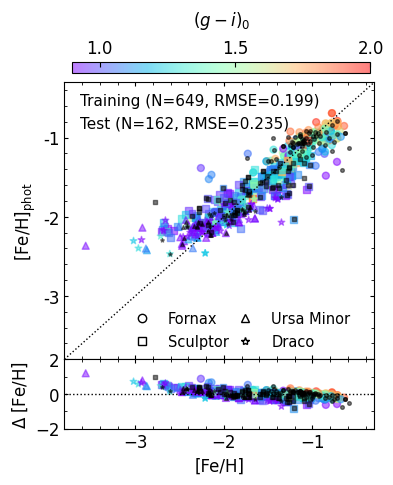

m_MGH = 0.4587040367067683


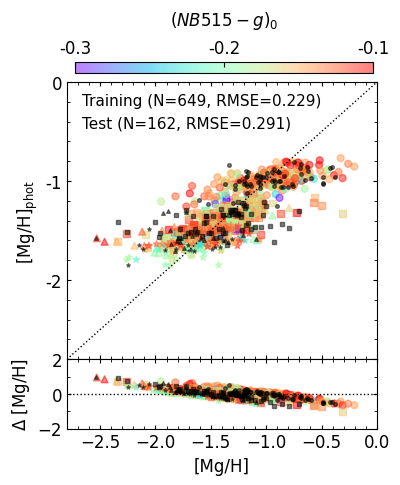

m_MGFE = 0.32028919430017183


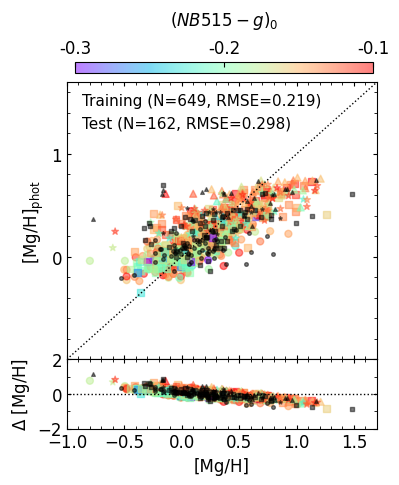

In [573]:
fig, (ax0, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -3.8, -0.3
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_FEH_fnx['FEH'], train_FEH_fnx['FEH_phot_rfr_plus'], s=s, alpha=alpha, c=train_FEH_fnx['Mg0']-train_FEH_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_FEH_scl['FEH'], train_FEH_scl['FEH_phot_rfr_plus'], s=s, alpha=alpha, c=train_FEH_scl['Mg0']-train_FEH_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_FEH_umi['FEH'], train_FEH_umi['FEH_phot_rfr_plus'], s=s, alpha=alpha, c=train_FEH_umi['Mg0']-train_FEH_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_FEH_dra['FEH'], train_FEH_dra['FEH_phot_rfr_plus'], s=s, alpha=alpha, c=train_FEH_dra['Mg0']-train_FEH_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_FEH_fnx['FEH'], test_FEH_fnx['FEH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_FEH_scl['FEH'], test_FEH_scl['FEH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_FEH_umi['FEH'], test_FEH_umi['FEH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_FEH_dra['FEH'], test_FEH_dra['FEH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1])
ax0.set_yticklabels(['-3', '-2', '-1'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_FEH)}, RMSE={train_FEH_rmse_avg_rfr_plus:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_FEH)}, RMSE={test_FEH_rmse_avg_rfr_plus:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_rfr_plus'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
print('m_FEH =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_FEH_fnx['FEH'], train_FEH_fnx['FEH_phot_rfr_plus']-train_FEH_fnx['FEH'], s=s, alpha=alpha, c=train_FEH_fnx['Mg0']-train_FEH_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_FEH_scl['FEH'], train_FEH_scl['FEH_phot_rfr_plus']-train_FEH_scl['FEH'], s=s, alpha=alpha, c=train_FEH_scl['Mg0']-train_FEH_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_FEH_umi['FEH'], train_FEH_umi['FEH_phot_rfr_plus']-train_FEH_umi['FEH'], s=s, alpha=alpha, c=train_FEH_umi['Mg0']-train_FEH_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_FEH_dra['FEH'], train_FEH_dra['FEH_phot_rfr_plus']-train_FEH_dra['FEH'], s=s, alpha=alpha, c=train_FEH_dra['Mg0']-train_FEH_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_FEH_fnx['FEH'], test_FEH_fnx['FEH_phot_rfr_plus']-test_FEH_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_FEH_scl['FEH'], test_FEH_scl['FEH_phot_rfr_plus']-test_FEH_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_FEH_umi['FEH'], test_FEH_umi['FEH_phot_rfr_plus']-test_FEH_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_FEH_dra['FEH'], test_FEH_dra['FEH_phot_rfr_plus']-test_FEH_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-2, 2])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()
#plt.savefig('feh_train_test_pred_compare.png', bbox_inches='tight')






fig, (ax1, ax3) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -3.9, -0.1
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_MGH_fnx['MGH'], train_MGH_fnx['MGH_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGH_fnx['Mn0']-train_MGH_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGH_scl['MGH'], train_MGH_scl['MGH_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGH_scl['Mn0']-train_MGH_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGH_umi['MGH'], train_MGH_umi['MGH_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGH_umi['Mn0']-train_MGH_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGH_dra['MGH'], train_MGH_dra['MGH_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGH_dra['Mn0']-train_MGH_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_MGH_fnx['MGH'], test_MGH_fnx['MGH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_MGH_scl['MGH'], test_MGH_scl['MGH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_MGH_umi['MGH'], test_MGH_umi['MGH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_MGH_dra['MGH'], test_MGH_dra['MGH_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_MGH)}, RMSE={train_MGH_rmse_avg_rfr_plus:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_MGH)}, RMSE={test_MGH_rmse_avg_rfr_plus:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
m_test, b_test = np.polyfit(test_MGH['MGH'], test_MGH['MGH_phot_rfr_plus'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
print('m_MGH =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_MGH_fnx['MGH'], train_MGH_fnx['MGH_phot_rfr_plus']-train_MGH_fnx['MGH'], s=s, alpha=alpha, c=train_MGH_fnx['Mn0']-train_MGH_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGH_scl['MGH'], train_MGH_scl['MGH_phot_rfr_plus']-train_MGH_scl['MGH'], s=s, alpha=alpha, c=train_MGH_scl['Mn0']-train_MGH_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGH_umi['MGH'], train_MGH_umi['MGH_phot_rfr_plus']-train_MGH_umi['MGH'], s=s, alpha=alpha, c=train_MGH_umi['Mn0']-train_MGH_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGH_dra['MGH'], train_MGH_dra['MGH_phot_rfr_plus']-train_MGH_dra['MGH'], s=s, alpha=alpha, c=train_MGH_dra['Mn0']-train_MGH_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_MGH_fnx['MGH'], test_MGH_fnx['MGH_phot_rfr_plus']-test_MGH_fnx['MGH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_MGH_scl['MGH'], test_MGH_scl['MGH_phot_rfr_plus']-test_MGH_scl['MGH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_MGH_umi['MGH'], test_MGH_umi['MGH_phot_rfr_plus']-test_MGH_umi['MGH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_MGH_dra['MGH'], test_MGH_dra['MGH_phot_rfr_plus']-test_MGH_dra['MGH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-2, 2])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()
#plt.savefig('mgh_train_test_pred_compare.png', bbox_inches='tight')






fig, (ax1, ax3) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -1.0, 1.7
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Test
# [Mg/Fe]
xmin, xmax = -1, 1.7
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_MGFE_fnx['MGFE'], train_MGFE_fnx['MGFE_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGFE_fnx['Mn0']-train_MGFE_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGFE_scl['MGFE'], train_MGFE_scl['MGFE_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGFE_scl['Mn0']-train_MGFE_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGFE_umi['MGFE'], train_MGFE_umi['MGFE_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGFE_umi['Mn0']-train_MGFE_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGFE_dra['MGFE'], train_MGFE_dra['MGFE_phot_rfr_plus'], s=s, alpha=alpha, c=train_MGFE_dra['Mn0']-train_MGFE_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_MGFE_fnx['MGFE'], test_MGFE_fnx['MGFE_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_MGFE_scl['MGFE'], test_MGFE_scl['MGFE_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_MGFE_umi['MGFE'], test_MGFE_umi['MGFE_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_MGFE_dra['MGFE'], test_MGFE_dra['MGFE_phot_rfr_plus'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([0, 1])
ax1.set_yticklabels(['0', '1'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_MGFE)}, RMSE={train_MGFE_rmse_avg_rfr_plus:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_MGFE)}, RMSE={test_MGFE_rmse_avg_rfr_plus:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
m_test, b_test = np.polyfit(test_MGFE['MGFE'], test_MGFE['MGFE_phot_rfr_plus'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
print('m_MGFE =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_MGFE_fnx['MGFE'], train_MGFE_fnx['MGFE_phot_rfr_plus']-train_MGFE_fnx['MGFE'], s=s, alpha=alpha, c=train_MGFE_fnx['Mn0']-train_MGFE_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGFE_scl['MGFE'], train_MGFE_scl['MGFE_phot_rfr_plus']-train_MGFE_scl['MGFE'], s=s, alpha=alpha, c=train_MGFE_scl['Mn0']-train_MGFE_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGFE_umi['MGFE'], train_MGFE_umi['MGFE_phot_rfr_plus']-train_MGFE_umi['MGFE'], s=s, alpha=alpha, c=train_MGFE_umi['Mn0']-train_MGFE_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGFE_dra['MGFE'], train_MGFE_dra['MGFE_phot_rfr_plus']-train_MGFE_dra['MGFE'], s=s, alpha=alpha, c=train_MGFE_dra['Mn0']-train_MGFE_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_MGFE_fnx['MGFE'], test_MGFE_fnx['MGFE_phot_rfr_plus']-test_MGFE_fnx['MGFE'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_MGFE_scl['MGFE'], test_MGFE_scl['MGFE_phot_rfr_plus']-test_MGFE_scl['MGFE'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_MGFE_umi['MGFE'], test_MGFE_umi['MGFE_phot_rfr_plus']-test_MGFE_umi['MGFE'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_MGFE_dra['MGFE'], test_MGFE_dra['MGFE_phot_rfr_plus']-test_MGFE_dra['MGFE'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-2, 2])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()
#plt.savefig('mgfe_train_test_pred_compare.png', bbox_inches='tight')

In [585]:
# FEH_datasets = {"train_FEH": train_FEH, "train_FEH_fnx": train_FEH_fnx, "train_FEH_scl": train_FEH_scl, "train_FEH_umi": train_FEH_umi, "train_FEH_dra": train_FEH_dra,
#                 "test_FEH": test_FEH, "test_FEH_fnx": test_FEH_fnx, "test_FEH_scl": test_FEH_scl, "test_FEH_umi": test_FEH_umi, "test_FEH_dra": test_FEH_dra,}
# MGH_datasets = {"train_MGH": train_MGH, "train_MGH_fnx": train_MGH_fnx, "train_MGH_scl": train_MGH_scl, "train_MGH_umi": train_MGH_umi, "train_MGH_dra": train_MGH_dra,
#                 "test_MGH": test_MGH, "test_MGH_fnx": test_MGH_fnx, "test_MGH_scl": test_MGH_scl, "test_MGH_umi": test_MGH_umi, "test_MGH_dra": test_MGH_dra,}
# mag_datasets = {"df_mag": df_mag, "fnx_mag": fnx_mag, "scl_mag": scl_mag, "umi_mag": umi_mag, "dra_mag": dra_mag,}
# hsc_datasets = {"hsc_df_mag": hsc_df_mag, "hsc_fnx_mag": hsc_fnx_mag, "hsc_scl_mag": hsc_scl_mag, "hsc_umi_mag": hsc_umi_mag, "hsc_dra_mag": hsc_dra_mag,}

# for name, df in FEH_datasets.items():
#     print(f"{name}_phot_rfr, {name}_phot_rfr_uncertainty = {np.mean(df.FEH_phot_rfr):.3f}, {np.mean(df.FEH_phot_rfr_uncertainty):.3f}")

# for name, df in mag_datasets.items():
#     print(f"{name} FEH, FEHSTD, FEHERR = {np.mean(df.FEH):.3f}, {np.std(df.FEH):.3f}, {np.mean(df.FEHERR):.3f}")

# for name, df in hsc_datasets.items():
#     print(f"{name} FEH_phot_rfr, FEH_phot_rfr_std, FEH_phot_rfr_uncertainty, FEH_phot_rfr_err = {np.mean(df.FEH_phot_rfr):.3f}, {np.std(df.FEH_phot_rfr):.3f}, {np.mean(df.FEH_phot_rfr_uncertainty):.3f}, {np.mean(df.FEH_phot_rfr_err):.3f}")

# print('\n')

# for name, df in MGH_datasets.items():
#     print(f"{name}_phot_rfr, {name}_phot_rfr_uncertainty = {np.mean(df.MGH_phot_rfr):.3f}, {np.mean(df.MGH_phot_rfr_uncertainty):.3f}")

# for name, df in mag_datasets.items():
#     print(f"{name}, MGH, MGHSTD, MGHERR = {np.mean(df.MGH):.3f}, {np.std(df.MGH):.3f}, {np.mean(df.MGHERR):.3f}")

# for name, df in hsc_datasets.items():
#     print(f"{name} MGH_phot_rfr, MGH_phot_rfr_std, MGH_phot_rfr_uncertainty, MGH_phot_rfr_err = {np.mean(df.MGH_phot_rfr):.3f}, {np.std(df.MGH_phot_rfr):.3f}, {np.mean(df.MGH_phot_rfr_uncertainty):.3f}, {np.mean(df.MGH_phot_rfr_err):.3f}")

# print('\n')

# for name, df in mag_datasets.items():
#     print(f"{name}, MGFE, MGFESTD, MGFEERR = {np.mean(df.MGFE):.3f}, {np.std(df.MGFE):.3f}, {np.mean(df.MGFEERR):.3f}")

# for name, df in hsc_datasets.items():
#     print(f"{name} MGFE_phot_rfr, MGFE_phot_rfr_uncertainty, MGFE_phot_rfr_err = {np.mean(df.MGFE_phot_rfr):.3f}, {np.std(df.MGFE_phot_rfr):.3f}, {np.mean(df.MGFE_phot_rfr_uncertainty):.3f}, {np.mean(df.MGFE_phot_rfr_err):.3f}")



In [15]:
# correlation = np.corrcoef(train_FEH['FEH'], train_FEH['MGH'])[0, 1]
# print(f"Correlation between [Fe/H] and [Mg/H]: {correlation:.3f}")

Correlation between [Fe/H] and [Mg/H]: 0.739


Best n_estimators for FEH: 617 with RMSE: 0.241
Best n_estimators for MGH: 107 with RMSE: 0.265
CPU times: user 2h 5min 47s, sys: 9.42 s, total: 2h 5min 57s
Wall time: 2h 5min 56s


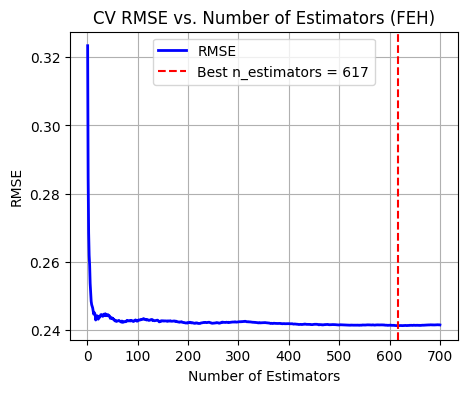

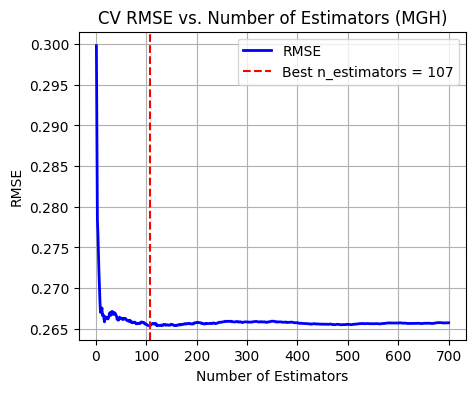

In [80]:
# %%time
# from sklearn.model_selection import KFold

# X = df_mag[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values
# Y_FEH = df_mag['FEH'].values
# Y_MGH = df_mag['MGH'].values

# kf = KFold(n_splits=5, shuffle=True, random_state=42)

# def hyperparameter_search(X, Y, min_samples_leaf, max_features, param_range, model_name):
#     best_rmse = float('inf')
#     best_n_estimators = None
#     avg_rmse_values = []
    
#     for n_estimators in param_range:
#         fold_rmse = []
#         for train_index, test_index in kf.split(X):
#             X_train, X_test = X[train_index], X[test_index]
#             Y_train, Y_test = Y[train_index], Y[test_index]
#             model = RandomForestRegressor(random_state=42, 
#                                           n_estimators=n_estimators,
#                                           min_samples_leaf=min_samples_leaf,
#                                           max_features=max_features,
#                                           oob_score=True)
#             model.fit(X_train, Y_train)
#             Y_pred = model.predict(X_test)
#             rmse = math.sqrt(mean_squared_error(Y_test, Y_pred))
#             fold_rmse.append(rmse)
#         avg_rmse = np.mean(fold_rmse)
#         avg_rmse_values.append(avg_rmse)
#         if avg_rmse < best_rmse:
#             best_rmse = avg_rmse
#             best_n_estimators = n_estimators

#     print(f"Best n_estimators for {model_name}: {best_n_estimators} with RMSE: {best_rmse:.3f}")
    
#     plt.figure(figsize=(5,4))
#     plt.plot(param_range, avg_rmse_values, color='b', label='RMSE', linewidth=2)
#     plt.axvline(x=best_n_estimators, color='r', linestyle='--', 
#                 label=f"Best n_estimators = {best_n_estimators}")
#     plt.xlabel('Number of Estimators')
#     plt.ylabel('RMSE')
#     plt.title(f'CV RMSE vs. Number of Estimators ({model_name})')
#     plt.legend()
#     plt.grid(True)
#     plt.savefig(f'find_the_best_n_estimators_{model_name.lower()}.png', bbox_inches='tight')
#     return best_n_estimators, best_rmse

# param_range = range(1, 701)
# best_n_estimators_FEH, best_rmse_FEH = hyperparameter_search(X, Y_FEH, 
#                                                              min_samples_leaf=3, 
#                                                              max_features=0.5, 
#                                                              param_range=param_range, 
#                                                              model_name='FEH')
# best_n_estimators_MGH, best_rmse_MGH = hyperparameter_search(X, Y_MGH, 
#                                                              min_samples_leaf=9, 
#                                                              max_features=0.8, 
#                                                              param_range=param_range, 
#                                                              model_name='MGH')

# Wall time: 2h 5min 56s

Best min_samples_leaf for FEH: 1 with RMSE: 0.242
Best min_samples_leaf for MGH: 6 with RMSE: 0.275
CPU times: user 31.2 s, sys: 240 ms, total: 31.5 s
Wall time: 31.4 s


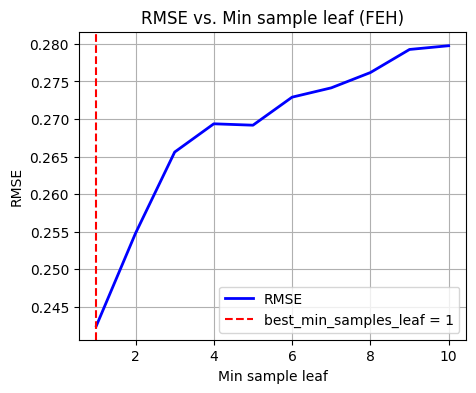

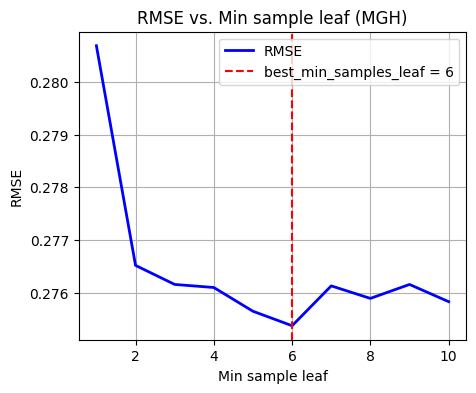

In [82]:
# %%time

# # FEH 모델: max_features=0.5 사용
# best_rmse = float('inf')
# best_min_samples_leaf = None
# rmse_values = []
# for min_samples_leaf in range(1, 11):
#     model_FEH = RandomForestRegressor(
#         random_state=42, 
#         n_estimators=500, 
#         min_samples_leaf=min_samples_leaf, 
#         max_features=0.5, 
#         oob_score=True
#     )
#     model_FEH.fit(
#         train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, 
#         train_FEH['FEH'].values
#     )
#     pred = model_FEH.predict(
#         test_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values
#     )
#     rmse = math.sqrt(mean_squared_error(test_FEH['FEH'], pred))
#     rmse_values.append(rmse)    
#     if rmse < best_rmse:
#         best_rmse = rmse
#         best_min_samples_leaf = min_samples_leaf
# print(f"Best min_samples_leaf for FEH: {best_min_samples_leaf} with RMSE: {best_rmse:.3f}")

# plt.figure(figsize=(5, 4))
# plt.plot(range(1, 11), rmse_values, color='b', label='RMSE', linewidth=2)
# plt.axvline(x=best_min_samples_leaf, color='r', linestyle='--', 
#             label=f"best_min_samples_leaf = {best_min_samples_leaf}")
# plt.xlabel('Min sample leaf')
# plt.ylabel('RMSE')
# plt.title('RMSE vs. Min sample leaf (FEH)')
# plt.legend()
# plt.grid(True)
# plt.savefig('find_the_best_min_sample_leaf_feh.png', bbox_inches='tight')

# # MGH 모델: max_features=0.8 사용
# best_rmse = float('inf')
# best_min_samples_leaf = None
# rmse_values = []
# for min_samples_leaf in range(1, 11):
#     model_MGH = RandomForestRegressor(
#         random_state=42, 
#         n_estimators=500, 
#         min_samples_leaf=min_samples_leaf, 
#         max_features=0.8, 
#         oob_score=True
#     )
#     model_MGH.fit(
#         train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, 
#         train_MGH['MGH'].values
#     )
#     pred = model_MGH.predict(
#         test_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values
#     )
#     rmse = math.sqrt(mean_squared_error(test_MGH['MGH'], pred))
#     rmse_values.append(rmse)    
#     if rmse < best_rmse:
#         best_rmse = rmse
#         best_min_samples_leaf = min_samples_leaf
# print(f"Best min_samples_leaf for MGH: {best_min_samples_leaf} with RMSE: {best_rmse:.3f}")

# plt.figure(figsize=(5, 4))
# plt.plot(range(1, 11), rmse_values, color='b', label='RMSE', linewidth=2)
# plt.axvline(x=best_min_samples_leaf, color='r', linestyle='--', 
#             label=f"best_min_samples_leaf = {best_min_samples_leaf}")
# plt.xlabel('Min sample leaf')
# plt.ylabel('RMSE')
# plt.title('RMSE vs. Min sample leaf (MGH)')
# plt.legend()
# plt.grid(True)
# plt.savefig('find_the_best_min_sample_leaf_mgh.png', bbox_inches='tight')

# Wall time: 31.4 s

Best max_features for FEH: 1.0 with RMSE: 0.265
Best max_features for MGH: 0.8 with RMSE: 0.275
CPU times: user 28.6 s, sys: 268 ms, total: 28.9 s
Wall time: 28.7 s


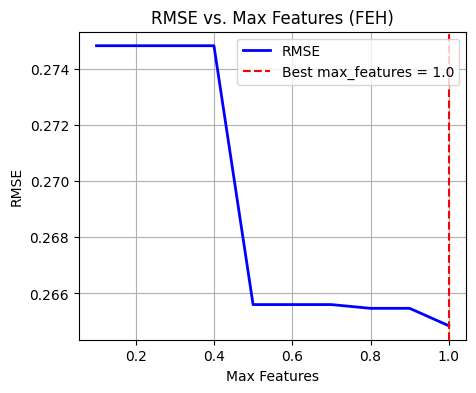

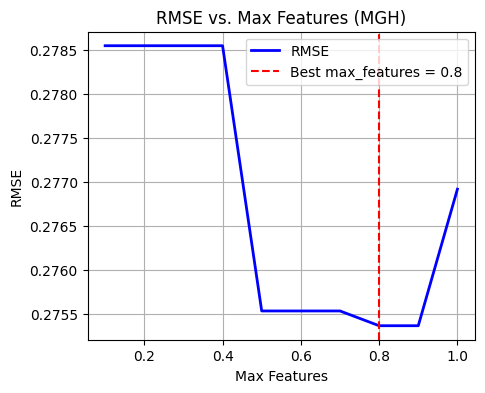

In [83]:
# %%time

# # FEH 모델: min_samples_leaf=3 사용, max_features 튜닝
# best_rmse = float('inf')
# best_max_features = None
# rmse_values = []
# for max_features in [i * 0.1 for i in range(1, 11)]:  # 0.1부터 1.0까지
#     model_FEH = RandomForestRegressor(
#         random_state=42, 
#         n_estimators=500, 
#         min_samples_leaf=3, 
#         max_features=max_features, 
#         oob_score=True
#     )
#     model_FEH.fit(
#         train_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, 
#         train_FEH['FEH'].values
#     )
#     pred = model_FEH.predict(
#         test_FEH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values
#     )
#     rmse = math.sqrt(mean_squared_error(test_FEH['FEH'], pred))
#     rmse_values.append(rmse)
#     if rmse < best_rmse:
#         best_rmse = rmse
#         best_max_features = max_features
# print(f"Best max_features for FEH: {best_max_features} with RMSE: {best_rmse:.3f}")

# plt.figure(figsize=(5, 4))
# plt.plot([i * 0.1 for i in range(1, 11)], rmse_values, color='b', label='RMSE', linewidth=2)
# plt.axvline(x=best_max_features, color='r', linestyle='--', label=f"Best max_features = {best_max_features}")
# plt.xlabel('Max Features')
# plt.ylabel('RMSE')
# plt.title('RMSE vs. Max Features (FEH)')
# plt.legend()
# plt.grid(True)
# plt.savefig('find_the_best_max_features_feh.png', bbox_inches='tight')


# # MGH 모델: min_samples_leaf=6 사용, max_features 튜닝
# best_rmse = float('inf')
# best_max_features = None
# rmse_values = []
# for max_features in [i * 0.1 for i in range(1, 11)]:  # 0.1부터 1.0까지
#     model_MGH = RandomForestRegressor(
#         random_state=42, 
#         n_estimators=500, 
#         min_samples_leaf=6, 
#         max_features=max_features, 
#         oob_score=True
#     )
#     model_MGH.fit(
#         train_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values, 
#         train_MGH['MGH'].values
#     )
#     pred = model_MGH.predict(
#         test_MGH[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values
#     )
#     rmse = math.sqrt(mean_squared_error(test_MGH['MGH'], pred))
#     rmse_values.append(rmse)
#     if rmse < best_rmse:
#         best_rmse = rmse
#         best_max_features = max_features
# print(f"Best max_features for MGH: {best_max_features} with RMSE: {best_rmse:.3f}")

# plt.figure(figsize=(5, 4))
# plt.plot([i * 0.1 for i in range(1, 11)], rmse_values, color='b', label='RMSE', linewidth=2)
# plt.axvline(x=best_max_features, color='r', linestyle='--', label=f"Best max_features = {best_max_features}")
# plt.xlabel('Max Features')
# plt.ylabel('RMSE')
# plt.title('RMSE vs. Max Features (MGH)')
# plt.legend()
# plt.grid(True)
# plt.savefig('find_the_best_max_features_mgh.png', bbox_inches='tight')

# Wall time: 28.7 s

Average RMSE over 300 bootstrap iterations: 0.257
CPU times: user 7min 21s, sys: 784 ms, total: 7min 22s
Wall time: 7min 22s


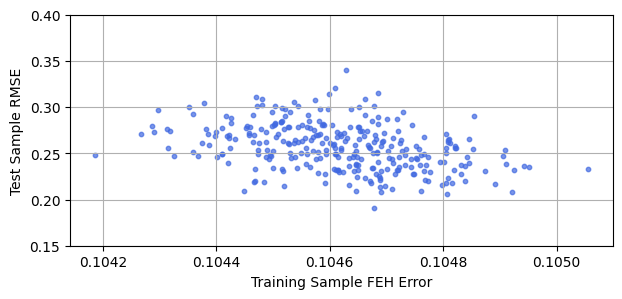

In [84]:
# %%time

# n_bootstrap = 300
# training_err_FEH_list = []
# test_rmse_list = []

# # one-hot encoding for 'DSPH' column
# df_mag_ohe = pd.get_dummies(df_mag, columns=['DSPH'])
# galaxy_id = (0 * df_mag_ohe['DSPH_for'] +
#              1 * df_mag_ohe['DSPH_scl'] +
#              2 * df_mag_ohe['DSPH_umi'] +
#              3 * df_mag_ohe['DSPH_dra'])

# df_X_FEH = np.column_stack((
#     df_mag['Mg0'], 
#     df_mag['Mg0'] - df_mag['Mi0'], 
#     df_mag['Mg0'] - df_mag['Mn0'], 
#     galaxy_id
# ))
# df_Y_FEH = df_mag['FEH']

# n_estimators = 500
# min_samples_leaf = 3
# max_features = 0.5

# # Bootstrap iterations
# for i in range(n_bootstrap):
#     X_train, X_test, Y_train, Y_test = train_test_split(
#         df_X_FEH, df_Y_FEH, test_size=0.2, random_state=i
#     )
#     model = RandomForestRegressor(
#         random_state=42, 
#         n_estimators=n_estimators, 
#         min_samples_leaf=min_samples_leaf, 
#         max_features=max_features, 
#         oob_score=True
#     )
#     model.fit(X_train, Y_train)
#     Y_pred = model.predict(X_test)
#     test_mse = mean_squared_error(Y_test, Y_pred)
#     test_rmse = math.sqrt(test_mse)
#     test_rmse_list.append(test_rmse)
    
#     mask = df_mag[['Mg0']].isin(X_train[:, 0]).all(axis=1)
#     training_err_FEH = df_mag.loc[mask, 'FEHERR']
#     training_err_FEH_list.append(training_err_FEH.mean())

# mean_rmse = np.mean(test_rmse_list)
# print(f"Average RMSE over {n_bootstrap} bootstrap iterations: {mean_rmse:.3f}")

# fig, ax0 = plt.subplots(figsize=(7, 3))
# ax0.scatter(training_err_FEH_list, test_rmse_list, marker='o', s=10, alpha=0.7, color='royalblue')
# ax0.set_ylim([0.15, 0.4])
# ax0.set_xlabel('Training Sample FEH Error')
# ax0.set_ylabel('Test Sample RMSE')
# ax0.grid(True)
# plt.savefig('compare_training_err_FEH_test_rmse.png', bbox_inches='tight')

# Wall time: 7min 22s

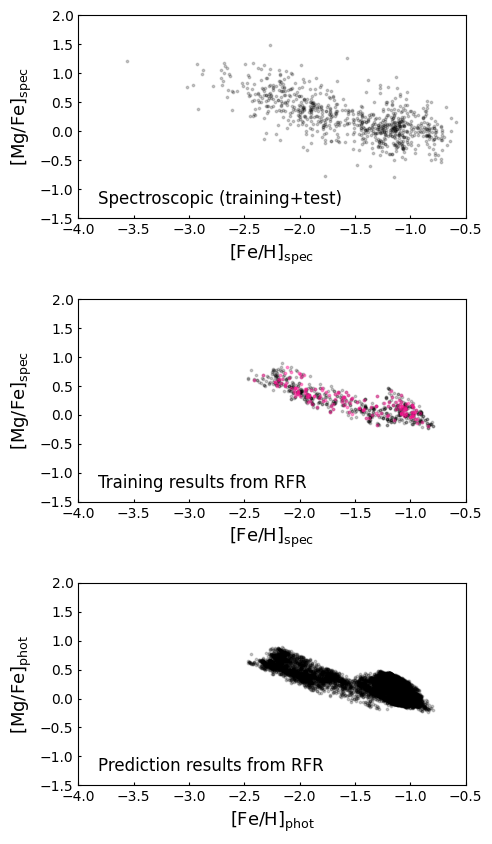

In [586]:
# Spec MGFE - FEH vs. phot MGFE - FEH
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 30 ; alpha = 0.2

# Spectroscopy
#ax0.errorbar(fnx_mag['FEH'], fnx_mag['MGFE'], xerr=fnx_mag['FEHERR'], yerr=fnx_mag['MGFEERR'], markersize=3, fmt='o', alpha=0.3, color='gray')
#ax0.errorbar(scl_mag['FEH'], scl_mag['MGFE'], xerr=scl_mag['FEHERR'], yerr=scl_mag['MGFEERR'], markersize=3, fmt='o', alpha=0.3, color='mediumorchid')
#ax0.errorbar(umi_mag['FEH'], umi_mag['MGFE'], xerr=umi_mag['FEHERR'], yerr=umi_mag['MGFEERR'], markersize=3, fmt='o', alpha=0.3, color='darkorange')
#ax0.errorbar(dra_mag['FEH'], dra_mag['MGFE'], xerr=dra_mag['FEHERR'], yerr=dra_mag['MGFEERR'], markersize=3, fmt='o', alpha=0.3, color='lightseagreen')
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=3, alpha=alpha, color='black')
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=3, alpha=alpha, color='black')
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=3, alpha=alpha, color='black')
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=3, alpha=alpha, color='black')
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, -0.5])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spectroscopic (training+test)', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_FEH['FEH_phot_rfr'], train_MGFE['MGFE_phot_rfr'], s=3, alpha=alpha, color='black')
ax1.scatter(test_FEH['FEH_phot_rfr'], test_MGFE['MGFE_phot_rfr'], s=3, alpha=0.4, color='deeppink')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, -0.5])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from RFR', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], s=3, alpha=alpha, color='black')
ax2.scatter(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], s=3, alpha=alpha, color='black')
ax2.scatter(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], s=3, alpha=alpha, color='black')
ax2.scatter(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], s=3, alpha=alpha, color='black')
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, -0.5])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Prediction results from RFR', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.show()
#plt.savefig('compare_rfr_spec_phot_mgfe_feh_together.png', bbox_inches='tight')

# RFR model evaluation

m_FEH = 0.8168017167742263
m_MGH = 0.7527442241736901
m_MGFE = 0.7527442241736901


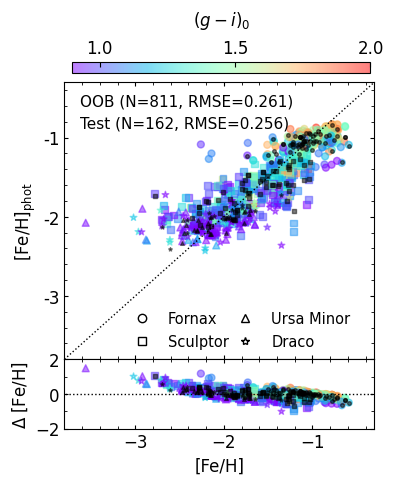

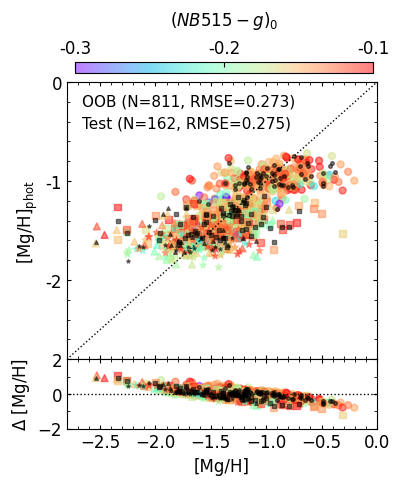

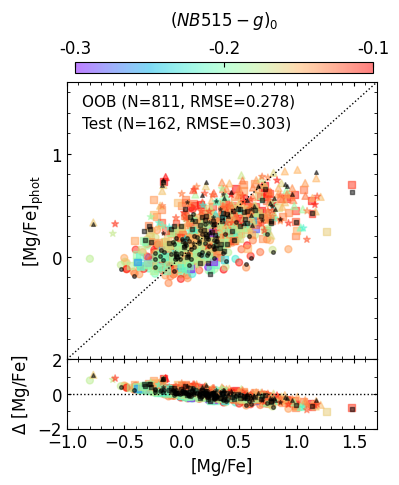

In [637]:
fig, (ax0, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -3.8, -0.3
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(df_fnx_mag['FEH'], df_fnx_mag['FEH_phot_rfr_oob'], s=s, alpha=alpha, c=df_fnx_mag['Mg0']-df_fnx_mag['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(df_scl_mag['FEH'], df_scl_mag['FEH_phot_rfr_oob'], s=s, alpha=alpha, c=df_scl_mag['Mg0']-df_scl_mag['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(df_umi_mag['FEH'], df_umi_mag['FEH_phot_rfr_oob'], s=s, alpha=alpha, c=df_umi_mag['Mg0']-df_umi_mag['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(df_dra_mag['FEH'], df_dra_mag['FEH_phot_rfr_oob'], s=s, alpha=alpha, c=df_dra_mag['Mg0']-df_dra_mag['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_FEH_fnx['FEH'], test_FEH_fnx['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_FEH_scl['FEH'], test_FEH_scl['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_FEH_umi['FEH'], test_FEH_umi['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_FEH_dra['FEH'], test_FEH_dra['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1])
ax0.set_yticklabels(['-3', '-2', '-1'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'OOB (N={len(df_mag.FEH_phot_rfr_oob)}, RMSE={FEH_oob_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_FEH)}, RMSE={test_FEH_rmse_avg:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_rfr'], 1)
# ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
print('m_FEH =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(df_fnx_mag['FEH'], df_fnx_mag['FEH_phot_rfr_oob']-df_fnx_mag['FEH'], s=s, alpha=alpha, c=df_fnx_mag['Mg0']-df_fnx_mag['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(df_scl_mag['FEH'], df_scl_mag['FEH_phot_rfr_oob']-df_scl_mag['FEH'], s=s, alpha=alpha, c=df_scl_mag['Mg0']-df_scl_mag['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(df_umi_mag['FEH'], df_umi_mag['FEH_phot_rfr_oob']-df_umi_mag['FEH'], s=s, alpha=alpha, c=df_umi_mag['Mg0']-df_umi_mag['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(df_dra_mag['FEH'], df_dra_mag['FEH_phot_rfr_oob']-df_dra_mag['FEH'], s=s, alpha=alpha, c=df_dra_mag['Mg0']-df_dra_mag['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_FEH_fnx['FEH'], test_FEH_fnx['FEH_phot_rfr']-test_FEH_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_FEH_scl['FEH'], test_FEH_scl['FEH_phot_rfr']-test_FEH_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_FEH_umi['FEH'], test_FEH_umi['FEH_phot_rfr']-test_FEH_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_FEH_dra['FEH'], test_FEH_dra['FEH_phot_rfr']-test_FEH_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-2, 2])
# ax2.set_yticks([-1, 0, 1])
# ax2.set_yticklabels(['-1', '0', '1'])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.savefig('feh_oob_test_pred_compare.png', bbox_inches='tight')






fig, (ax1, ax3) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -3.9, -0.1
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(df_fnx_mag['MGH'], df_fnx_mag['MGH_phot_rfr_oob'], s=s, alpha=alpha, c=df_fnx_mag['Mn0']-df_fnx_mag['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(df_scl_mag['MGH'], df_scl_mag['MGH_phot_rfr_oob'], s=s, alpha=alpha, c=df_scl_mag['Mn0']-df_scl_mag['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(df_umi_mag['MGH'], df_umi_mag['MGH_phot_rfr_oob'], s=s, alpha=alpha, c=df_umi_mag['Mn0']-df_umi_mag['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(df_dra_mag['MGH'], df_dra_mag['MGH_phot_rfr_oob'], s=s, alpha=alpha, c=df_dra_mag['Mn0']-df_dra_mag['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_MGH_fnx['MGH'], test_MGH_fnx['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_MGH_scl['MGH'], test_MGH_scl['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_MGH_umi['MGH'], test_MGH_umi['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_MGH_dra['MGH'], test_MGH_dra['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'OOB (N={len(df_mag.MGH_phot_rfr_oob)}, RMSE={MGH_oob_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_MGH)}, RMSE={test_MGH_rmse_avg:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_rfr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
print('m_MGH =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(df_fnx_mag['MGH'], df_fnx_mag['MGH_phot_rfr_oob']-df_fnx_mag['MGH'], s=s, alpha=alpha, c=df_fnx_mag['Mn0']-df_fnx_mag['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(df_scl_mag['MGH'], df_scl_mag['MGH_phot_rfr_oob']-df_scl_mag['MGH'], s=s, alpha=alpha, c=df_scl_mag['Mn0']-df_scl_mag['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(df_umi_mag['MGH'], df_umi_mag['MGH_phot_rfr_oob']-df_umi_mag['MGH'], s=s, alpha=alpha, c=df_umi_mag['Mn0']-df_umi_mag['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(df_dra_mag['MGH'], df_dra_mag['MGH_phot_rfr_oob']-df_dra_mag['MGH'], s=s, alpha=alpha, c=df_dra_mag['Mn0']-df_dra_mag['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_MGH_fnx['MGH'], test_MGH_fnx['MGH_phot_rfr']-test_FEH_fnx['MGH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_MGH_scl['MGH'], test_MGH_scl['MGH_phot_rfr']-test_FEH_scl['MGH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_MGH_umi['MGH'], test_MGH_umi['MGH_phot_rfr']-test_FEH_umi['MGH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_MGH_dra['MGH'], test_MGH_dra['MGH_phot_rfr']-test_FEH_dra['MGH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-2, 2])
# ax3.set_yticks([-1, 0, 1])
# ax3.set_yticklabels(['-1', '0', '1'])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.savefig('mgh_oob_test_pred_compare.png', bbox_inches='tight')








fig, (ax1, ax3) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# OOB
# [Mg/Fe]
xmin, xmax = -1.0, 1.7
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(df_fnx_mag['MGFE'], df_fnx_mag['MGFE_phot_rfr_oob'], s=s, alpha=alpha, c=df_fnx_mag['Mn0']-df_fnx_mag['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(df_scl_mag['MGFE'], df_scl_mag['MGFE_phot_rfr_oob'], s=s, alpha=alpha, c=df_scl_mag['Mn0']-df_scl_mag['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(df_umi_mag['MGFE'], df_umi_mag['MGFE_phot_rfr_oob'], s=s, alpha=alpha, c=df_umi_mag['Mn0']-df_umi_mag['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(df_dra_mag['MGFE'], df_dra_mag['MGFE_phot_rfr_oob'], s=s, alpha=alpha, c=df_dra_mag['Mn0']-df_dra_mag['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_MGFE_fnx['MGFE'], test_MGFE_fnx['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_MGFE_scl['MGFE'], test_MGFE_scl['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_MGFE_umi['MGFE'], test_MGFE_umi['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_MGFE_dra['MGFE'], test_MGFE_dra['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/Fe]$_\\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([0, 1])
ax1.set_yticklabels(['0', '1'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'OOB (N={len(df_mag.MGFE_phot_rfr_oob)}, RMSE={MGFE_oob_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_MGFE)}, RMSE={test_MGFE_rmse_avg:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_rfr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
print('m_MGFE =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(df_fnx_mag['MGFE'], df_fnx_mag['MGFE_phot_rfr_oob']-df_fnx_mag['MGFE'], s=s, alpha=alpha, c=df_fnx_mag['Mn0']-df_fnx_mag['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(df_scl_mag['MGFE'], df_scl_mag['MGFE_phot_rfr_oob']-df_scl_mag['MGFE'], s=s, alpha=alpha, c=df_scl_mag['Mn0']-df_scl_mag['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(df_umi_mag['MGFE'], df_umi_mag['MGFE_phot_rfr_oob']-df_umi_mag['MGFE'], s=s, alpha=alpha, c=df_umi_mag['Mn0']-df_umi_mag['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(df_dra_mag['MGFE'], df_dra_mag['MGFE_phot_rfr_oob']-df_dra_mag['MGFE'], s=s, alpha=alpha, c=df_dra_mag['Mn0']-df_dra_mag['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_MGFE_fnx['MGFE'], test_MGFE_fnx['MGFE_phot_rfr']-test_FEH_fnx['MGFE'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_MGFE_scl['MGFE'], test_MGFE_scl['MGFE_phot_rfr']-test_FEH_scl['MGFE'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_MGFE_umi['MGFE'], test_MGFE_umi['MGFE_phot_rfr']-test_FEH_umi['MGFE'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_MGFE_dra['MGFE'], test_MGFE_dra['MGFE_phot_rfr']-test_FEH_dra['MGFE'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/Fe]', size=12)
ax3.set_ylabel('$\\Delta$ [Mg/Fe]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-2, 2])
# ax3.set_yticks([-1, 0, 1])
# ax3.set_yticklabels(['-1', '0', '1'])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.savefig('mgfe_oob_test_pred_compare.png', bbox_inches='tight')

m_FEH = 0.8168017167742263
m_MGH = 0.476971419704673
m_MGFE = 0.3113266336334631


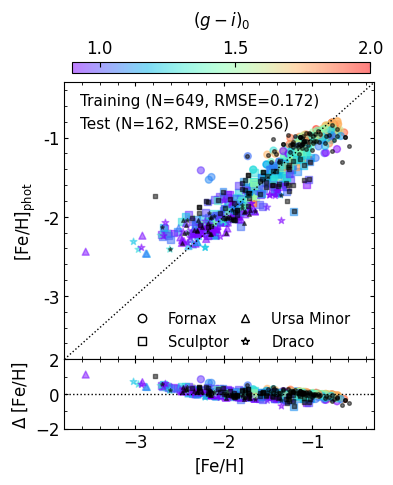

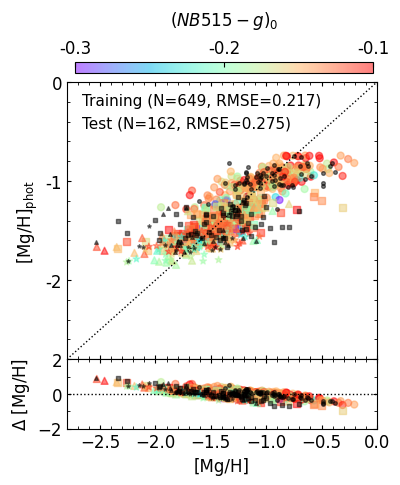

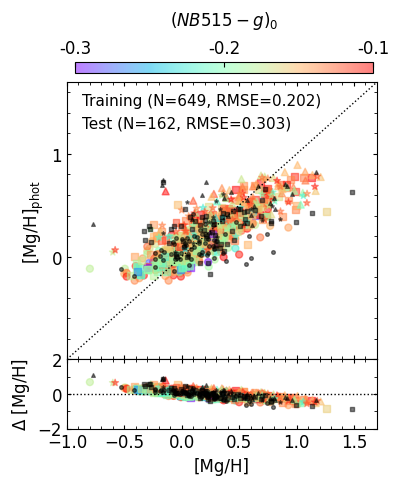

In [638]:
fig, (ax0, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -3.8, -0.3
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_FEH_fnx['FEH'], train_FEH_fnx['FEH_phot_rfr'], s=s, alpha=alpha, c=train_FEH_fnx['Mg0']-train_FEH_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_FEH_scl['FEH'], train_FEH_scl['FEH_phot_rfr'], s=s, alpha=alpha, c=train_FEH_scl['Mg0']-train_FEH_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_FEH_umi['FEH'], train_FEH_umi['FEH_phot_rfr'], s=s, alpha=alpha, c=train_FEH_umi['Mg0']-train_FEH_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_FEH_dra['FEH'], train_FEH_dra['FEH_phot_rfr'], s=s, alpha=alpha, c=train_FEH_dra['Mg0']-train_FEH_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_FEH_fnx['FEH'], test_FEH_fnx['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_FEH_scl['FEH'], test_FEH_scl['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_FEH_umi['FEH'], test_FEH_umi['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_FEH_dra['FEH'], test_FEH_dra['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1])
ax0.set_yticklabels(['-3', '-2', '-1'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_FEH)}, RMSE={train_FEH_rmse_avg:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_FEH)}, RMSE={test_FEH_rmse_avg:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_rfr'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
print('m_FEH =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_FEH_fnx['FEH'], train_FEH_fnx['FEH_phot_rfr']-train_FEH_fnx['FEH'], s=s, alpha=alpha, c=train_FEH_fnx['Mg0']-train_FEH_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_FEH_scl['FEH'], train_FEH_scl['FEH_phot_rfr']-train_FEH_scl['FEH'], s=s, alpha=alpha, c=train_FEH_scl['Mg0']-train_FEH_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_FEH_umi['FEH'], train_FEH_umi['FEH_phot_rfr']-train_FEH_umi['FEH'], s=s, alpha=alpha, c=train_FEH_umi['Mg0']-train_FEH_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_FEH_dra['FEH'], train_FEH_dra['FEH_phot_rfr']-train_FEH_dra['FEH'], s=s, alpha=alpha, c=train_FEH_dra['Mg0']-train_FEH_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_FEH_fnx['FEH'], test_FEH_fnx['FEH_phot_rfr']-test_FEH_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_FEH_scl['FEH'], test_FEH_scl['FEH_phot_rfr']-test_FEH_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_FEH_umi['FEH'], test_FEH_umi['FEH_phot_rfr']-test_FEH_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_FEH_dra['FEH'], test_FEH_dra['FEH_phot_rfr']-test_FEH_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-2, 2])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

#plt.show()
plt.savefig('feh_train_test_pred_compare.png', bbox_inches='tight')






fig, (ax1, ax3) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -3.9, -0.1
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_MGH_fnx['MGH'], train_MGH_fnx['MGH_phot_rfr'], s=s, alpha=alpha, c=train_MGH_fnx['Mn0']-train_MGH_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGH_scl['MGH'], train_MGH_scl['MGH_phot_rfr'], s=s, alpha=alpha, c=train_MGH_scl['Mn0']-train_MGH_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGH_umi['MGH'], train_MGH_umi['MGH_phot_rfr'], s=s, alpha=alpha, c=train_MGH_umi['Mn0']-train_MGH_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGH_dra['MGH'], train_MGH_dra['MGH_phot_rfr'], s=s, alpha=alpha, c=train_MGH_dra['Mn0']-train_MGH_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_MGH_fnx['MGH'], test_MGH_fnx['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_MGH_scl['MGH'], test_MGH_scl['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_MGH_umi['MGH'], test_MGH_umi['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_MGH_dra['MGH'], test_MGH_dra['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_MGH)}, RMSE={train_MGH_rmse_avg:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_MGH)}, RMSE={test_MGH_rmse_avg:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
m_test, b_test = np.polyfit(test_MGH['MGH'], test_MGH['MGH_phot_rfr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
print('m_MGH =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_MGH_fnx['MGH'], train_MGH_fnx['MGH_phot_rfr']-train_MGH_fnx['MGH'], s=s, alpha=alpha, c=train_MGH_fnx['Mn0']-train_MGH_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGH_scl['MGH'], train_MGH_scl['MGH_phot_rfr']-train_MGH_scl['MGH'], s=s, alpha=alpha, c=train_MGH_scl['Mn0']-train_MGH_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGH_umi['MGH'], train_MGH_umi['MGH_phot_rfr']-train_MGH_umi['MGH'], s=s, alpha=alpha, c=train_MGH_umi['Mn0']-train_MGH_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGH_dra['MGH'], train_MGH_dra['MGH_phot_rfr']-train_MGH_dra['MGH'], s=s, alpha=alpha, c=train_MGH_dra['Mn0']-train_MGH_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_MGH_fnx['MGH'], test_MGH_fnx['MGH_phot_rfr']-test_MGH_fnx['MGH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_MGH_scl['MGH'], test_MGH_scl['MGH_phot_rfr']-test_MGH_scl['MGH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_MGH_umi['MGH'], test_MGH_umi['MGH_phot_rfr']-test_MGH_umi['MGH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_MGH_dra['MGH'], test_MGH_dra['MGH_phot_rfr']-test_MGH_dra['MGH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-2, 2])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

#plt.show()
plt.savefig('mgh_train_test_pred_compare.png', bbox_inches='tight')






fig, (ax1, ax3) = plt.subplots(nrows=2, ncols=1, figsize=(4, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25
alpha = 0.5
xmin, xmax = -1.0, 1.7
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Test
# [Mg/Fe]
xmin, xmax = -1, 1.7
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_MGFE_fnx['MGFE'], train_MGFE_fnx['MGFE_phot_rfr'], s=s, alpha=alpha, c=train_MGFE_fnx['Mn0']-train_MGFE_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGFE_scl['MGFE'], train_MGFE_scl['MGFE_phot_rfr'], s=s, alpha=alpha, c=train_MGFE_scl['Mn0']-train_MGFE_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGFE_umi['MGFE'], train_MGFE_umi['MGFE_phot_rfr'], s=s, alpha=alpha, c=train_MGFE_umi['Mn0']-train_MGFE_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_MGFE_dra['MGFE'], train_MGFE_dra['MGFE_phot_rfr'], s=s, alpha=alpha, c=train_MGFE_dra['Mn0']-train_MGFE_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_MGFE_fnx['MGFE'], test_MGFE_fnx['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_MGFE_scl['MGFE'], test_MGFE_scl['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_MGFE_umi['MGFE'], test_MGFE_umi['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_MGFE_dra['MGFE'], test_MGFE_dra['MGFE_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([0, 1])
ax1.set_yticklabels(['0', '1'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_MGFE)}, RMSE={train_MGFE_rmse_avg:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_MGFE)}, RMSE={test_MGFE_rmse_avg:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
m_test, b_test = np.polyfit(test_MGFE['MGFE'], test_MGFE['MGFE_phot_rfr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
print('m_MGFE =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_MGFE_fnx['MGFE'], train_MGFE_fnx['MGFE_phot_rfr']-train_MGFE_fnx['MGFE'], s=s, alpha=alpha, c=train_MGFE_fnx['Mn0']-train_MGFE_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGFE_scl['MGFE'], train_MGFE_scl['MGFE_phot_rfr']-train_MGFE_scl['MGFE'], s=s, alpha=alpha, c=train_MGFE_scl['Mn0']-train_MGFE_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGFE_umi['MGFE'], train_MGFE_umi['MGFE_phot_rfr']-train_MGFE_umi['MGFE'], s=s, alpha=alpha, c=train_MGFE_umi['Mn0']-train_MGFE_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_MGFE_dra['MGFE'], train_MGFE_dra['MGFE_phot_rfr']-train_MGFE_dra['MGFE'], s=s, alpha=alpha, c=train_MGFE_dra['Mn0']-train_MGFE_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_MGFE_fnx['MGFE'], test_MGFE_fnx['MGFE_phot_rfr']-test_MGFE_fnx['MGFE'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_MGFE_scl['MGFE'], test_MGFE_scl['MGFE_phot_rfr']-test_MGFE_scl['MGFE'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_MGFE_umi['MGFE'], test_MGFE_umi['MGFE_phot_rfr']-test_MGFE_umi['MGFE'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_MGFE_dra['MGFE'], test_MGFE_dra['MGFE_phot_rfr']-test_MGFE_dra['MGFE'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-2, 2])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

#plt.show()
plt.savefig('mgfe_train_test_pred_compare.png', bbox_inches='tight')

len(train_FEH_filtered) = 23
mean Delta [Fe/H] = 0.48574756017486187
median Delta [Fe/H] = 0.43949646349897353
Counter({'scl': 11, 'dra': 7, 'umi': 5})
len(train_FEH_filtered_else) = 626
mean Delta [Fe/H]_else = -0.016966971134842548
median Delta [Fe/H]_else = -0.01917556216936278
Counter({'scl': 241, 'for': 237, 'dra': 83, 'umi': 65})
len(train_MGH_filtered) = 60
mean Delta [Mg/H] 0.2988296941951172
median Delta [Mg/Fe] 0.27191297196848296
Counter({'dra': 24, 'umi': 20, 'scl': 14, 'for': 2})
len(train_MGH_filtered_mr) = 62
mean Delta [Mg/H] for Mg-rich -0.2870703568752279
median Delta [Mg/H] for Mg-rich -0.2398708938725233
Counter({'for': 56, 'scl': 5, 'umi': 1})
len(train_MGH_filtered_else) = 527
mean Delta [Mg/H]_else -0.0011570782750502514
median Delta [Mg/H]_else -0.003283587082239414
Counter({'scl': 233, 'for': 179, 'dra': 66, 'umi': 49})


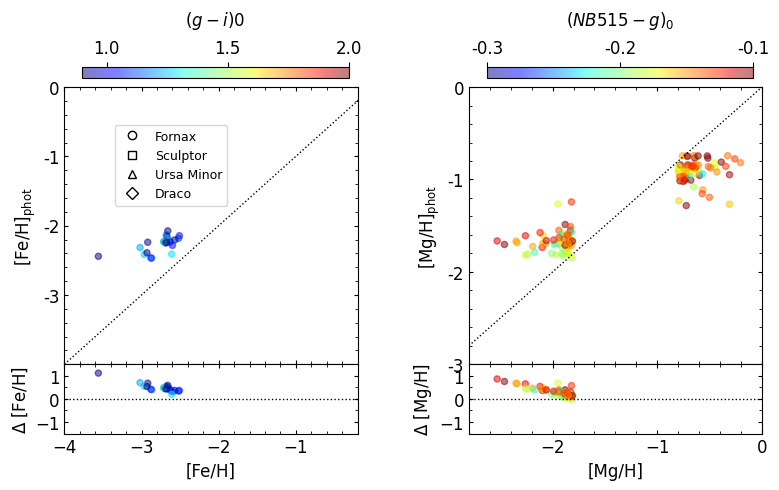

In [639]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 20
alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', 'D']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')

mask_train = train_FEH['FEH'] <= -2.5
train_FEH_filtered = train_FEH[mask_train]
train_FEH_filtered['FEH_phot_rfr'] = model_FEH.predict(train_FEH_filtered[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
print('len(train_FEH_filtered) =', len(train_FEH_filtered['FEH_phot_rfr']))
print('mean Delta [Fe/H] =', np.mean(train_FEH_filtered['FEH_phot_rfr']-train_FEH_filtered['FEH']))
print('median Delta [Fe/H] =', np.median(train_FEH_filtered['FEH_phot_rfr']-train_FEH_filtered['FEH']))
print(Counter(train_FEH_filtered['DSPH']))
mask_train_else = train_FEH['FEH'] > -2.5
train_FEH_filtered_else = train_FEH[mask_train_else]
train_FEH_filtered_else['FEH_phot_rfr'] = model_FEH.predict(train_FEH_filtered_else[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
print('len(train_FEH_filtered_else) =', len(train_FEH_filtered_else['FEH_phot_rfr']))
print('mean Delta [Fe/H]_else =', np.mean(train_FEH_filtered_else['FEH_phot_rfr']-train_FEH_filtered_else['FEH']))
print('median Delta [Fe/H]_else =', np.median(train_FEH_filtered_else['FEH_phot_rfr']-train_FEH_filtered_else['FEH']))
print(Counter(train_FEH_filtered_else['DSPH']))

im = ax0.scatter(train_FEH_filtered['FEH'], train_FEH_filtered['FEH_phot_rfr'], s=s, alpha=alpha, c=train_FEH_filtered['Mg0']-train_FEH_filtered['Mi0'], cmap='jet', marker=markers[0], vmin=vmin, vmax=vmax)
custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=9, framealpha=0.8)#, ncol=2, columnspacing=0.5)
legend.set_bbox_to_anchor((0.15, 0.55, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
#ax0.text(0.07, 0.95, 'Training (N = {0:,.0f})'.format(len(train_FEH)), ha='left', va='top', transform=ax0.transAxes, size=12)
#ax0.text(0.95, 0.13, f'RMSE = {train_FEH_rmse:.3f}', fontsize=12, ha='right', va='bottom', transform=ax0.transAxes, color='black')
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
m_train, b_train = np.polyfit(train_FEH_filtered['FEH'], train_FEH_filtered['FEH_phot_rfr'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_FEH_filtered['FEH'], train_FEH_filtered['FEH_phot_rfr']-train_FEH_filtered['FEH'], s=s, alpha=alpha, c=train_FEH_filtered['Mg0']-train_FEH_filtered['Mi0'], cmap='jet', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')

mask_test = train_MGH['MGH'] <= -1.8
train_MGH_filtered = train_MGH[mask_test]
train_MGH_filtered['MGH_phot_rfr'] = model_MGH.predict(train_MGH_filtered[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
print('len(train_MGH_filtered) =', len(train_MGH_filtered['MGH_phot_rfr']))
print('mean Delta [Mg/H]', np.mean(train_MGH_filtered['MGH_phot_rfr']-train_MGH_filtered['MGH']))
print('median Delta [Mg/Fe]', np.median(train_MGH_filtered['MGH_phot_rfr']-train_MGH_filtered['MGH']))
print(Counter(train_MGH_filtered['DSPH']))

mask_test_mr = -0.8 < train_MGH['MGH']
train_MGH_filtered_mr = train_MGH[mask_test_mr]
train_MGH_filtered_mr['MGH_phot_rfr'] = model_MGH.predict(train_MGH_filtered_mr[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
print('len(train_MGH_filtered_mr) =', len(train_MGH_filtered_mr['MGH_phot_rfr']))
print('mean Delta [Mg/H] for Mg-rich', np.mean(train_MGH_filtered_mr['MGH_phot_rfr']-train_MGH_filtered_mr['MGH']))
print('median Delta [Mg/H] for Mg-rich', np.median(train_MGH_filtered_mr['MGH_phot_rfr']-train_MGH_filtered_mr['MGH']))
print(Counter(train_MGH_filtered_mr['DSPH']))

mask_test_else = (-1.8 < train_MGH['MGH'])& (train_MGH['MGH'] <= -0.8)
train_MGH_filtered_else = train_MGH[mask_test_else]
train_MGH_filtered_else['MGH_phot_rfr'] = model_MGH.predict(train_MGH_filtered_else[['Mg0', 'Mg0_Mi0', 'Mg0_Mn0', 'galaxy_id']].values)
print('len(train_MGH_filtered_else) =', len(train_MGH_filtered_else['MGH_phot_rfr']))
print('mean Delta [Mg/H]_else', np.mean(train_MGH_filtered_else['MGH_phot_rfr']-train_MGH_filtered_else['MGH']))
print('median Delta [Mg/H]_else', np.median(train_MGH_filtered_else['MGH_phot_rfr']-train_MGH_filtered_else['MGH']))
print(Counter(train_MGH_filtered_else['DSPH']))

im = ax1.scatter(train_MGH_filtered['MGH'], train_MGH_filtered['MGH_phot_rfr'], s=s, alpha=alpha, c=train_MGH_filtered['Mn0']-train_MGH_filtered['Mg0'], cmap='jet', marker=markers[0], vmin=vmin, vmax=vmax)
im = ax1.scatter(train_MGH_filtered_mr['MGH'], train_MGH_filtered_mr['MGH_phot_rfr'], s=s, alpha=alpha, c=train_MGH_filtered_mr['Mn0']-train_MGH_filtered_mr['Mg0'], cmap='jet', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-3, -2, -1, 0])
ax1.set_yticklabels(['-3', '-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
#ax1.text(0.95, 0.13, f'RMSE = {train_MGH_rmse:.3f}', fontsize=12, ha='right', va='bottom', transform=ax1.transAxes, color='black')
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
m_test, b_test = np.polyfit(train_MGH_filtered['MGH'], train_MGH_filtered['MGH_phot_rfr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_MGH_filtered['MGH'], train_MGH_filtered['MGH_phot_rfr']-train_MGH_filtered['MGH'], s=s, alpha=alpha, c=train_MGH_filtered['Mn0']-train_MGH_filtered['Mg0'], cmap='jet', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()
#plt.savefig('feh_mgh_mgfe_train_pred_test_pred_compare.png', bbox_inches='tight')

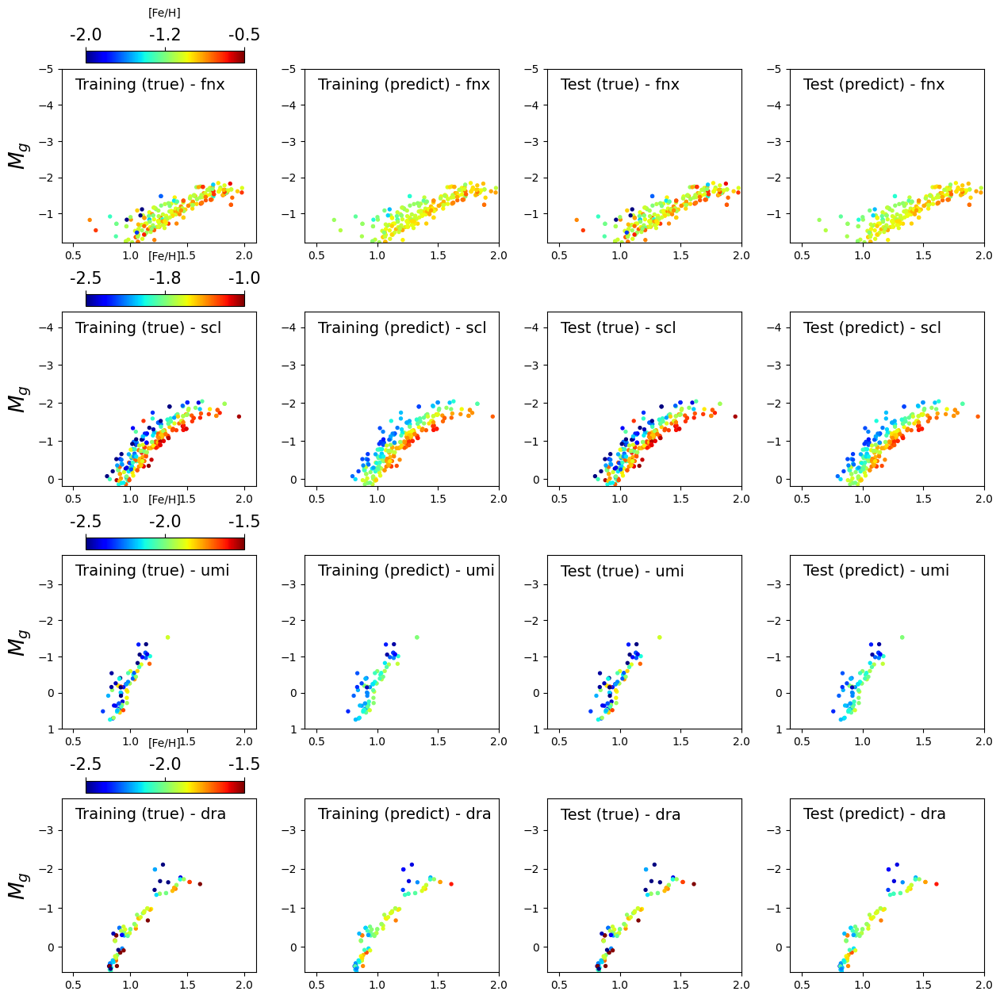

In [590]:
datasets = {
    "fnx": {"data": train_FEH_fnx, "ymin": -5, "ymax": -0.2, "vmin": -2, "vmax": -0.5},
    "scl": {"data": train_FEH_scl, "ymin": -4.4, "ymax": 0.18, "vmin": -2.5, "vmax": -1.0},
    "umi": {"data": train_FEH_umi, "ymin": -3.8, "ymax": 1, "vmin": -2.5, "vmax": -1.5},
    "dra": {"data": train_FEH_dra, "ymin": -3.8, "ymax": 0.65, "vmin": -2.5, "vmax": -1.5},
}

s = 8
alpha = 1

fig, axes = plt.subplots(nrows=len(datasets), ncols=4, figsize=(15, 3.7 * len(datasets)), gridspec_kw={'hspace':0.4, 'wspace': 0.25})

for i, (name, info) in enumerate(datasets.items()):
    df = info["data"]
    ymin, ymax = info["ymin"], info["ymax"]
    vmin, vmax = info["vmin"], info["vmax"]
    
    ax0, ax1, ax2, ax3 = axes[i]
    
    # Training (True)
    im = ax0.scatter(df['Mg0_Mi0'], df['Mg0'], marker='o', s=s, c=df['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
    ax0.set_xlim([0.4, 2.1])
    ax0.set_ylim([ymax, ymin])
    ax0.set_xlabel('')
    ax0.set_ylabel('$M_{g}$', size=19)
    ax0.text(0.07, 0.95, f'Training (true) - {name}', ha='left', va='top', transform=ax0.transAxes, size=14)

    # Training (Predict)
    im = ax1.scatter(df['Mg0_Mi0'], df['Mg0'], marker='o', s=s, c=df['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
    ax1.set_xlim([0.4, 2])
    ax1.set_ylim([ymax, ymin])
    ax1.set_xlabel('')
    ax1.text(0.07, 0.95, f'Training (predict) - {name}', ha='left', va='top', transform=ax1.transAxes, size=14)

    # Test (True)
    im = ax2.scatter(df['Mg0_Mi0'], df['Mg0'], marker='o', s=s, c=df['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
    ax2.set_xlim([0.4, 2])
    ax2.set_ylim([ymax, ymin])
    ax2.set_xlabel('')
    ax2.text(0.07, 0.95, f'Test (true) - {name}', ha='left', va='top', transform=ax2.transAxes, size=14)

    # Test (Predict)
    im = ax3.scatter(df['Mg0_Mi0'], df['Mg0'], marker='o', s=s, c=df['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
    ax3.set_xlim([0.4, 2])
    ax3.set_ylim([ymax, ymin])
    ax3.set_xlabel('')
    ax3.text(0.07, 0.95, f'Test (predict) - {name}', ha='left', va='top', transform=ax3.transAxes, size=14)

    # color bar only for the left panels
    cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.005, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.01])
    cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.xaxis.set_ticks_position('top')
    cbar.ax.xaxis.set_label_position('top')
    cbar.set_label('[Fe/H]', size=10, labelpad=10, loc='center')
    cbar.ax.set_xticks([vmin, (vmin + vmax) / 2, vmax])
    cbar.ax.set_xticklabels([f'{vmin:.1f}', f'{(vmin + vmax) / 2:.1f}', f'{vmax:.1f}'])

#plt.show()
plt.savefig('cmd_train_test_pred_in_detail.png', bbox_inches='tight')

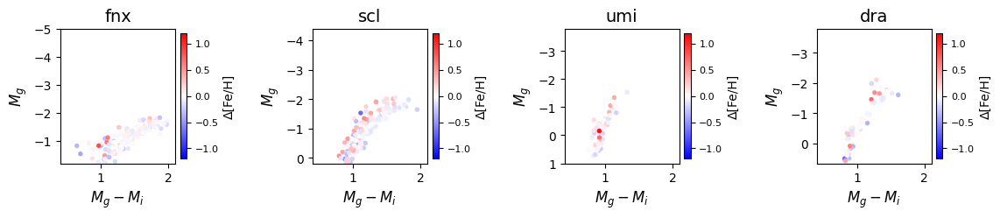

In [591]:
datasets = {
    "fnx": {"data": train_FEH_fnx, "ymin": -5, "ymax": -0.2},
    "scl": {"data": train_FEH_scl, "ymin": -4.4, "ymax": 0.18},
    "umi": {"data": train_FEH_umi, "ymin": -3.8, "ymax": 1},
    "dra": {"data": train_FEH_dra, "ymin": -3.8, "ymax": 0.65},
}

s = 8
alpha = 1
vmin, vmax = -1.2, 1.2

fig, axes = plt.subplots(nrows=1, ncols=len(datasets), figsize=(13, 2), gridspec_kw={'wspace': 1.0})

for ax, (name, info) in zip(axes, datasets.items()):
    df = info["data"]
    ymin, ymax = info["ymin"], info["ymax"]
    
    df["FEH_diff"] = df["FEH_phot_rfr"] - df["FEH"]

    im = ax.scatter(df["Mg0_Mi0"], df["Mg0"], marker='o', s=s, c=df["FEH_diff"], cmap='bwr', vmin=vmin, vmax=vmax, alpha=alpha)
    ax.set_xlim([0.4, 2.1])
    ax.set_ylim([ymax, ymin])
    ax.set_xlabel("$M_g - M_i$", size=12)
    ax.set_ylabel("$M_g$", size=12)
    ax.set_title(f"{name}", size=14)

    cbar = fig.colorbar(im, ax=ax, orientation="vertical", fraction=0.05, pad=0.04)
    cbar.set_label("Δ[Fe/H]", size=10)
    cbar.ax.tick_params(labelsize=8)

#plt.show()
plt.savefig('cmd_train_test_pred_diff_in_detail.png', bbox_inches='tight')

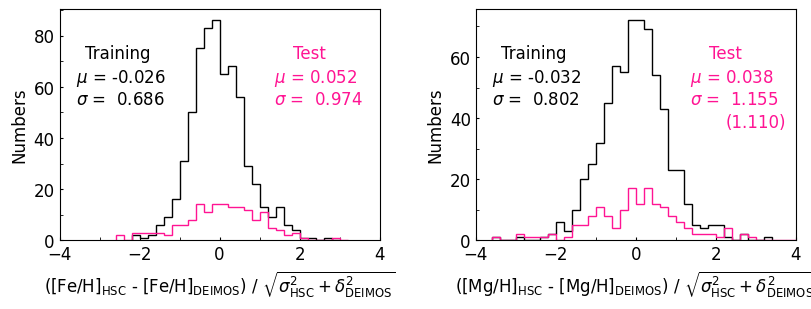

In [645]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(9.5, 3), gridspec_kw={'wspace':0.3})
bins_width = 0.2

# Training and Test for [Fe/H]
x1 = (train_FEH['FEH_phot_rfr'] - train_FEH['FEH']) / np.sqrt(train_FEH_err**2 + train_FEH['FEH_phot_rfr_uncertainty']**2)
x2 = (test_FEH['FEH_phot_rfr'] - test_FEH['FEH']) / np.sqrt(test_FEH_err**2 + test_FEH['FEH_phot_rfr_uncertainty']**2)
#x1 = (train_FEH['FEH_phot_rfr'] - train_FEH['FEH']) / np.sqrt(train_FEH_err**2 + train_FEH_oob_rmse**2)
#x2 = (test_FEH['FEH_phot_rfr'] - test_FEH['FEH']) / np.sqrt(test_FEH_err**2 + train_FEH_oob_rmse**2)

# Set bins for [Fe/H]
bins_x1 = np.arange(np.floor(np.min(x1) / bins_width) * bins_width,
                    np.ceil(np.max(x1) / bins_width) * bins_width + bins_width,
                    bins_width)
bins_x2 = np.arange(np.floor(np.min(x2) / bins_width) * bins_width,
                    np.ceil(np.max(x2) / bins_width) * bins_width + bins_width,
                    bins_width)

ax0.hist(x1, bins=bins_x1, color='k', histtype='step')
ax0.hist(x2, bins=bins_x2, color='deeppink', histtype='step')
ax0.set_xlabel(r'([Fe/H]$_\mathrm{HSC}$ - [Fe/H]$_\mathrm{DEIMOS}$) / $\sqrt{\sigma_\mathrm{HSC}^2 + \delta_\mathrm{DEIMOS}^2}$', size=12)
ax0.set_ylabel('Numbers', size=12)
ax0.set_xlim([-4, 4])
ax0.xaxis.set_minor_locator(AutoMinorLocator(2))
ax0.yaxis.set_minor_locator(AutoMinorLocator(2))
ax0.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)
ax0.text(0.08, 0.85, 'Training', ha='left', va='top', transform=ax0.transAxes, size=12)
ax0.text(0.05, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x1)), ha='left', va='top', transform=ax0.transAxes, size=12)
ax0.text(0.05, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x1)), ha='left', va='top', transform=ax0.transAxes, size=12)
ax0.text(0.73, 0.85, 'Test', ha='left', va='top', transform=ax0.transAxes, size=12, color='deeppink')
ax0.text(0.67, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x2)), ha='left', va='top', transform=ax0.transAxes, size=12, color='deeppink')
ax0.text(0.67, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x2)), ha='left', va='top', transform=ax0.transAxes, size=12, color='deeppink')

# Training and Test for [Mg/H]
x1 = (train_MGH['MGH_phot_rfr'] - train_MGH['MGH']) / np.sqrt(train_MGH['MGH_phot_rfr_uncertainty']**2 + train_MGH_err**2)
x2 = (test_MGH['MGH_phot_rfr'] - test_MGH['MGH']) / np.sqrt(test_MGH['MGH_phot_rfr_uncertainty']**2 + test_MGH_err**2)
#x1 = (train_MGH['MGH_phot_rfr'] - train_MGH['MGH']) / np.sqrt(train_MGH_err**2 + train_MGH_oob_rmse**2)
#x2 = (test_MGH['MGH_phot_rfr'] - test_MGH['MGH']) / np.sqrt(test_MGH_err**2 + train_MGH_oob_rmse**2)

# Set bins for [Mg/H]
bins_x1 = np.arange(np.floor(np.min(x1) / bins_width) * bins_width,
                    np.ceil(np.max(x1) / bins_width) * bins_width + bins_width,
                    bins_width)
bins_x2 = np.arange(np.floor(np.min(x2) / bins_width) * bins_width,
                    np.ceil(np.max(x2) / bins_width) * bins_width + bins_width,
                    bins_width)

ax1.hist(x1, bins=bins_x1, color='k', histtype='step')
ax1.hist(x2, bins=bins_x2, color='deeppink', histtype='step')
ax1.set_xlabel(r'([Mg/H]$_\mathrm{HSC}$ - [Mg/H]$_\mathrm{DEIMOS}$) / $\sqrt{\sigma_\mathrm{HSC}^2 + \delta_\mathrm{DEIMOS}^2}$', size=12)
ax1.set_ylabel('Numbers', size=12)
ax1.set_xlim([-4, 4])
ax1.xaxis.set_minor_locator(AutoMinorLocator(2))
ax1.yaxis.set_minor_locator(AutoMinorLocator(2))
ax1.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)
ax1.text(0.08, 0.85, 'Training', ha='left', va='top', transform=ax1.transAxes, size=12)
ax1.text(0.05, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x1)), ha='left', va='top', transform=ax1.transAxes, size=12)
ax1.text(0.05, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x1)), ha='left', va='top', transform=ax1.transAxes, size=12)
ax1.text(0.73, 0.85, 'Test', ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')
ax1.text(0.67, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x2)), ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')
ax1.text(0.67, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x2)), ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')

# Get the std of x2 without outlier beyond 3sigma
x2_without_max = x2[x2 != np.max(x2)]
std_x2_without_max = np.std(x2_without_max)
ax1.text(0.78, 0.55, '({0:,.3f})'.format(std_x2_without_max), ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')

plt.savefig('feh_mgh_training_test_chi_distribution.png', bbox_inches='tight')

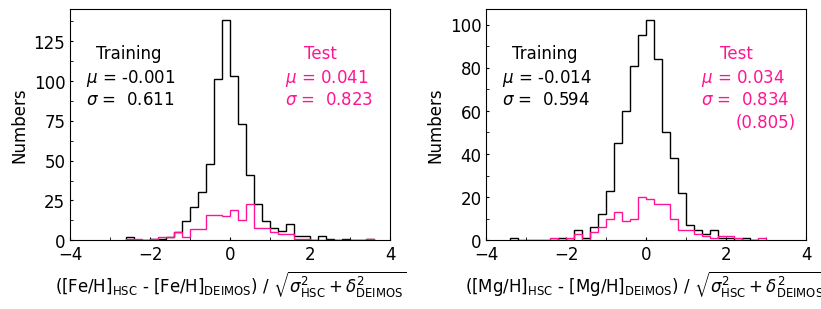

In [646]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(9.5, 3), gridspec_kw={'wspace':0.3})
bins_width = 0.2

# Training and Test for [Fe/H]
#x1 = (train_FEH['FEH_phot_rfr'] - train_FEH['FEH']) / np.sqrt(train_FEH_err**2 + train_FEH['FEH_phot_rfr_uncertainty']**2)
#x2 = (test_FEH['FEH_phot_rfr'] - test_FEH['FEH']) / np.sqrt(test_FEH_err**2 + test_FEH['FEH_phot_rfr_uncertainty']**2)
x1 = (train_FEH['FEH_phot_rfr'] - train_FEH['FEH']) / np.sqrt(train_FEH_err**2 + train_FEH_oob_rmse**2)
x2 = (test_FEH['FEH_phot_rfr'] - test_FEH['FEH']) / np.sqrt(test_FEH_err**2 + train_FEH_oob_rmse**2)

# Set bins for [Fe/H]
bins_x1 = np.arange(np.floor(np.min(x1) / bins_width) * bins_width,
                    np.ceil(np.max(x1) / bins_width) * bins_width + bins_width,
                    bins_width)
bins_x2 = np.arange(np.floor(np.min(x2) / bins_width) * bins_width,
                    np.ceil(np.max(x2) / bins_width) * bins_width + bins_width,
                    bins_width)

ax0.hist(x1, bins=bins_x1, color='k', histtype='step')
ax0.hist(x2, bins=bins_x2, color='deeppink', histtype='step')
ax0.set_xlabel(r'([Fe/H]$_\mathrm{HSC}$ - [Fe/H]$_\mathrm{DEIMOS}$) / $\sqrt{\sigma_\mathrm{HSC}^2 + \delta_\mathrm{DEIMOS}^2}$', size=12)
ax0.set_ylabel('Numbers', size=12)
ax0.set_xlim([-4, 4])
ax0.xaxis.set_minor_locator(AutoMinorLocator(2))
ax0.yaxis.set_minor_locator(AutoMinorLocator(2))
ax0.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)
ax0.text(0.08, 0.85, 'Training', ha='left', va='top', transform=ax0.transAxes, size=12)
ax0.text(0.05, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x1)), ha='left', va='top', transform=ax0.transAxes, size=12)
ax0.text(0.05, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x1)), ha='left', va='top', transform=ax0.transAxes, size=12)
ax0.text(0.73, 0.85, 'Test', ha='left', va='top', transform=ax0.transAxes, size=12, color='deeppink')
ax0.text(0.67, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x2)), ha='left', va='top', transform=ax0.transAxes, size=12, color='deeppink')
ax0.text(0.67, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x2)), ha='left', va='top', transform=ax0.transAxes, size=12, color='deeppink')

# Training and Test for [Mg/H]
#x1 = (train_MGH['MGH_phot_rfr'] - train_MGH['MGH']) / np.sqrt(train_MGH['MGH_phot_rfr_uncertainty']**2 + train_MGH_err**2)
#x2 = (test_MGH['MGH_phot_rfr'] - test_MGH['MGH']) / np.sqrt(test_MGH['MGH_phot_rfr_uncertainty']**2 + test_MGH_err**2)
x1 = (train_MGH['MGH_phot_rfr'] - train_MGH['MGH']) / np.sqrt(train_MGH_err**2 + train_MGH_oob_rmse**2)
x2 = (test_MGH['MGH_phot_rfr'] - test_MGH['MGH']) / np.sqrt(test_MGH_err**2 + train_MGH_oob_rmse**2)

# Set bins for [Mg/H]
bins_x1 = np.arange(np.floor(np.min(x1) / bins_width) * bins_width,
                    np.ceil(np.max(x1) / bins_width) * bins_width + bins_width,
                    bins_width)
bins_x2 = np.arange(np.floor(np.min(x2) / bins_width) * bins_width,
                    np.ceil(np.max(x2) / bins_width) * bins_width + bins_width,
                    bins_width)

ax1.hist(x1, bins=bins_x1, color='k', histtype='step')
ax1.hist(x2, bins=bins_x2, color='deeppink', histtype='step')
ax1.set_xlabel(r'([Mg/H]$_\mathrm{HSC}$ - [Mg/H]$_\mathrm{DEIMOS}$) / $\sqrt{\sigma_\mathrm{HSC}^2 + \delta_\mathrm{DEIMOS}^2}$', size=12)
ax1.set_ylabel('Numbers', size=12)
ax1.set_xlim([-4, 4])
ax1.xaxis.set_minor_locator(AutoMinorLocator(2))
ax1.yaxis.set_minor_locator(AutoMinorLocator(2))
ax1.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)
ax1.text(0.08, 0.85, 'Training', ha='left', va='top', transform=ax1.transAxes, size=12)
ax1.text(0.05, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x1)), ha='left', va='top', transform=ax1.transAxes, size=12)
ax1.text(0.05, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x1)), ha='left', va='top', transform=ax1.transAxes, size=12)
ax1.text(0.73, 0.85, 'Test', ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')
ax1.text(0.67, 0.75, '$\\mu$ = {0:,.3f}'.format(np.mean(x2)), ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')
ax1.text(0.67, 0.65, '$\\sigma$ =  {0:,.3f}'.format(np.std(x2)), ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')

# Get the std of x2 without outlier beyond 3sigma
x2_without_max = x2[x2 != np.max(x2)]
std_x2_without_max = np.std(x2_without_max)
ax1.text(0.78, 0.55, '({0:,.3f})'.format(std_x2_without_max), ha='left', va='top', transform=ax1.transAxes, size=12, color='deeppink')

#plt.savefig('feh_mgh_training_test_chi_distribution.png', bbox_inches='tight')
plt.show()

In [594]:
# # Total Error of DEIMOS // error of HSC for [Fe/H], [Mg/H], and [Mg/Fe]
# print(f'DEIMOS_FEH_err  = {(np.mean(fnx_mag.FEHERR) + np.mean(scl_mag.FEHERR) + np.mean(umi_mag.FEHERR) + np.mean(dra_mag.FEHERR))/4:.3f}')
# print(f'DEIMOS_MGH_err  = {(np.mean(fnx_mag.MGHERR) + np.mean(scl_mag.MGHERR) + np.mean(umi_mag.MGHERR) + np.mean(dra_mag.MGHERR))/4:.3f}')
# print(f'DEIMOS_MGFE_err = {(np.mean(fnx_mag.MGFEERR) + np.mean(scl_mag.MGFEERR) + np.mean(umi_mag.MGFEERR) + np.mean(dra_mag.MGFEERR))/4:.3f}')
# print(f'HSC_FEH_err  = {(np.mean(hsc_fnx_mag.FEH_phot_rfr_err) + np.mean(hsc_scl_mag.FEH_phot_rfr_err) + np.mean(hsc_umi_mag.FEH_phot_rfr_err) + np.mean(hsc_dra_mag.FEH_phot_rfr_err))/4:.3f}')
# print(f'HSC_MGH_err  = {(np.mean(hsc_fnx_mag.MGH_phot_rfr_err) + np.mean(hsc_scl_mag.MGH_phot_rfr_err) + np.mean(hsc_umi_mag.MGH_phot_rfr_err) + np.mean(hsc_dra_mag.MGH_phot_rfr_err))/4:.3f}')
# print(f'HSC_MGFE_err = {(np.mean(hsc_fnx_mag.MGFE_phot_rfr_err) + np.mean(hsc_scl_mag.MGFE_phot_rfr_err) + np.mean(hsc_umi_mag.MGFE_phot_rfr_err) + np.mean(hsc_dra_mag.MGFE_phot_rfr_err))/4:.3f}')
# print('\n')
# print(f'hsc_fnx_FEH_err  = {np.mean(hsc_fnx_mag.FEH_phot_rfr_err):.3f}')
# print(f'hsc_fnx_MGH_err  = {np.mean(hsc_fnx_mag.MGH_phot_rfr_err):.3f}')
# print(f'hsc_fnx_MGFE_err = {np.mean(hsc_fnx_mag.MGFE_phot_rfr_err):.3f}', '\n')
# print(f'hsc_scl_FEH_err  = {np.mean(hsc_scl_mag.FEH_phot_rfr_err):.3f}')
# print(f'hsc_scl_MGH_err  = {np.mean(hsc_scl_mag.MGH_phot_rfr_err):.3f}')
# print(f'hsc_scl_MGFE_err = {np.mean(hsc_scl_mag.MGFE_phot_rfr_err):.3f}', '\n')
# print(f'hsc_umi_FEH_err  = {np.mean(hsc_umi_mag.FEH_phot_rfr_err):.3f}')
# print(f'hsc_umi_MGH_err  = {np.mean(hsc_umi_mag.MGH_phot_rfr_err):.3f}')
# print(f'hsc_umi_MGFE_err = {np.mean(hsc_umi_mag.MGFE_phot_rfr_err):.3f}', '\n')
# print(f'hsc_dra_FEH_err  = {np.mean(hsc_dra_mag.FEH_phot_rfr_err):.3f}')
# print(f'hsc_dra_MGH_err  = {np.mean(hsc_dra_mag.MGH_phot_rfr_err):.3f}')
# print(f'hsc_dra_MGFE_err = {np.mean(hsc_dra_mag.MGFE_phot_rfr_err):.3f}', '\n')

In [595]:
# counts = Counter(hsc_df_mag['galaxy_id'])

# means = {
#     i: hsc_df_mag[hsc_df_mag['galaxy_id'] == i]['FEH_phot_rfr_err'].mean()
#     for i in range(4)
# }

# print('means =', means)

# weighted_mean = sum(means[i] * counts[i] for i in range(4)) / sum(counts.values())
# print("Weighted Mean:", weighted_mean)

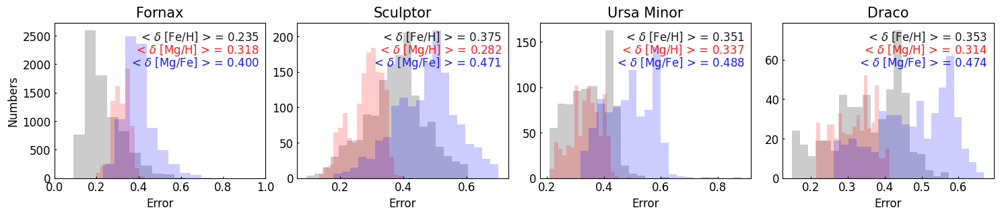

In [647]:
fig, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=4, figsize=(18,3), gridspec_kw={'wspace':0.15})

ax0.hist(hsc_fnx_mag['FEH_phot_rfr_err'], bins=10, color='k', alpha=0.2)
ax0.hist(hsc_fnx_mag['MGH_phot_rfr_err'], bins=10, color='r', alpha=0.2)
ax0.hist(hsc_fnx_mag['MGFE_phot_rfr_err'], bins=10, color='b', alpha=0.2)
ax0.set_title('Fornax', size=15)
ax0.set_xlabel('Error', size=12)
ax0.set_ylabel('Numbers', size=12)
ax0.text(0.97, 0.95, f'< $\\delta$ [Fe/H] > = {np.mean(hsc_fnx_mag.FEH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax0.transAxes, color='black', alpha=0.9)
ax0.text(0.97, 0.87, f'< $\\delta$ [Mg/H] > = {np.mean(hsc_fnx_mag.MGH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax0.transAxes, color='red', alpha=0.9)
ax0.text(0.97, 0.79, f'< $\\delta$ [Mg/Fe] > = {np.mean(hsc_fnx_mag.MGFE_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax0.transAxes, color='blue', alpha=0.9)
ax0.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)
ax0.set_xlim([0, 1])

ax1.hist(hsc_scl_mag['FEH_phot_rfr_err'], bins=20, color='k', alpha=0.2)
ax1.hist(hsc_scl_mag['MGH_phot_rfr_err'], bins=20, color='r', alpha=0.2)
ax1.hist(hsc_scl_mag['MGFE_phot_rfr_err'], bins=20, color='b', alpha=0.2)
ax1.set_title('Sculptor', size=15)
ax1.set_xlabel('Error', size=12)
ax1.set_ylabel('Numbers', size=12)
ax1.text(0.97, 0.95, f'< $\\delta$ [Fe/H] > = {np.mean(hsc_scl_mag.FEH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax1.transAxes, color='black', alpha=0.9)
ax1.text(0.97, 0.87, f'< $\\delta$ [Mg/H] > = {np.mean(hsc_scl_mag.MGH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax1.transAxes, color='red', alpha=0.9)
ax1.text(0.97, 0.79, f'< $\\delta$ [Mg/Fe] > = {np.mean(hsc_scl_mag.MGFE_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax1.transAxes, color='blue', alpha=0.9)
ax1.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)

ax2.hist(hsc_umi_mag['FEH_phot_rfr_err'], bins=20, color='k', alpha=0.2)
ax2.hist(hsc_umi_mag['MGH_phot_rfr_err'], bins=20, color='r', alpha=0.2)
ax2.hist(hsc_umi_mag['MGFE_phot_rfr_err'], bins=20, color='b', alpha=0.2)
ax2.set_title('Ursa Minor', size=15)
ax2.set_xlabel('Error', size=12)
ax2.set_ylabel('Numbers', size=12)
ax2.text(0.97, 0.95, f'< $\\delta$ [Fe/H] > = {np.mean(hsc_umi_mag.FEH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax2.transAxes, color='black', alpha=0.9)
ax2.text(0.97, 0.87, f'< $\\delta$ [Mg/H] > = {np.mean(hsc_umi_mag.MGH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax2.transAxes, color='red', alpha=0.9)
ax2.text(0.97, 0.79, f'< $\\delta$ [Mg/Fe] > = {np.mean(hsc_umi_mag.MGFE_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax2.transAxes, color='blue', alpha=0.9)
ax2.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)

ax3.hist(hsc_dra_mag['FEH_phot_rfr_err'], bins=20, color='k', alpha=0.2)
ax3.hist(hsc_dra_mag['MGH_phot_rfr_err'], bins=20, color='r', alpha=0.2)
ax3.hist(hsc_dra_mag['MGFE_phot_rfr_err'], bins=20, color='b', alpha=0.2)
ax3.set_title('Draco', size=15)
ax3.set_xlabel('Error', size=12)
ax3.set_ylabel('Numbers', size=12)
ax3.text(0.97, 0.95, f'< $\\delta$ [Fe/H] > = {np.mean(hsc_dra_mag.FEH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax3.transAxes, color='black', alpha=0.9)
ax3.text(0.97, 0.87, f'< $\\delta$ [Mg/H] > = {np.mean(hsc_dra_mag.MGH_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax3.transAxes, color='red', alpha=0.9)
ax3.text(0.97, 0.79, f'< $\\delta$ [Mg/Fe] > = {np.mean(hsc_dra_mag.MGFE_phot_rfr_err):.3f}', fontsize=12, ha='right', va='top', transform=ax3.transAxes, color='blue', alpha=0.9)
ax3.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)

for ax in [ax1, ax2, ax3]:
    ax.set_ylabel('')

plt.savefig('feh_mgh_mgfe_error_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

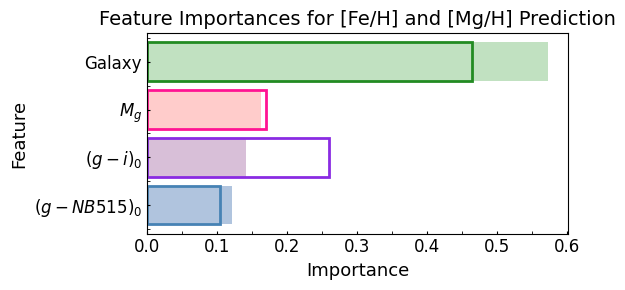

Feature importance for [Fe/H]
Galaxy: 0.464
$(g - i)_0$: 0.261
$M_g$: 0.171
$(g - NB515)_0$: 0.105
Feature importance for [Mg/H]
Galaxy: 0.573
$M_g$: 0.163
$(g - i)_0$: 0.141
$(g - NB515)_0$: 0.122


In [597]:
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator

# Create figure with one subplot
fig, ax = plt.subplots(figsize=(6, 3))
feature_names = ['$M_g$', '$(g - i)_0$', '$(g - NB515)_0$', 'Galaxy']

# Plot Feature Importance for [Mg/H] (filled bar chart)
importances_mgh = model_MGH.feature_importances_
sorted_indices_mgh = importances_mgh.argsort()
sorted_feature_names_mgh = [feature_names[i] for i in sorted_indices_mgh]
sorted_importances_mgh = importances_mgh[sorted_indices_mgh]
ax.barh(sorted_feature_names_mgh, sorted_importances_mgh, color=['#B0C4DE', '#D8BFD8', '#FFCCCB', '#C1E1C1'], alpha=1.0)

# Plot Feature Importance for [Fe/H] (unfilled histogram with custom edgecolor)
importances_feh = model_FEH.feature_importances_
sorted_indices_feh = importances_feh.argsort()
sorted_feature_names_feh = [feature_names[i] for i in sorted_indices_feh]
sorted_importances_feh = importances_feh[sorted_indices_feh]
ax.barh(sorted_feature_names_feh, sorted_importances_feh, color='none', edgecolor=['#4682B4', '#FF1493', '#8A2BE2', '#228B22'], linewidth=2)

# Add Labels and Titles
ax.set_xlabel('Importance', size=13)
ax.set_ylabel('Feature', size=13)
ax.set_title('Feature Importances for [Fe/H] and [Mg/H] Prediction', size=14)

# Customize ticks and labels
ax.xaxis.set_minor_locator(AutoMinorLocator(2))
ax.yaxis.set_minor_locator(AutoMinorLocator(2))
ax.tick_params(axis='x', which='major', direction='in', length=2.5, labelsize=12)
ax.tick_params(axis='x', which='minor', direction='in', length=2, labelsize=12)
ax.tick_params(axis='y', which='major', direction='in', length=2.5, labelsize=12)
ax.tick_params(axis='y', which='minor', direction='in', length=2, labelsize=12)

# Tight layout to prevent overlapping
plt.tight_layout()

# Save the figure
plt.savefig('RFR_feature_importances.png', bbox_inches='tight')

# Show the plot
plt.show()

# Print importances    
print("Feature importance for [Fe/H]")
for name, importance_feh in zip(sorted_feature_names_feh[::-1], sorted_importances_feh[::-1]):
    print(f'{name}: {importance_feh:.3f}')

print("Feature importance for [Mg/H]")
for name, importance_mgh in zip(sorted_feature_names_mgh[::-1], sorted_importances_mgh[::-1]):
    print(f'{name}: {importance_mgh:.3f}')


In [598]:
# print(f'mean fnx_mag FEH = {np.mean(fnx_mag.FEH):.3f}')
# print(f'mean scl_mag FEH = {np.mean(scl_mag.FEH):.3f}')
# print(f'mean umi_mag FEH = {np.mean(umi_mag.FEH):.3f}')
# print(f'mean dra_mag FEH = {np.mean(dra_mag.FEH):.3f}')

# print(f'mean hsc_fnx_mag FEH = {np.mean(hsc_fnx_mag.FEH_phot_rfr):.3f}')
# print(f'mean hsc_scl_mag FEH = {np.mean(hsc_scl_mag.FEH_phot_rfr):.3f}')
# print(f'mean hsc_umi_mag FEH = {np.mean(hsc_umi_mag.FEH_phot_rfr):.3f}')
# print(f'mean hsc_dra_mag FEH = {np.mean(hsc_dra_mag.FEH_phot_rfr):.3f}')

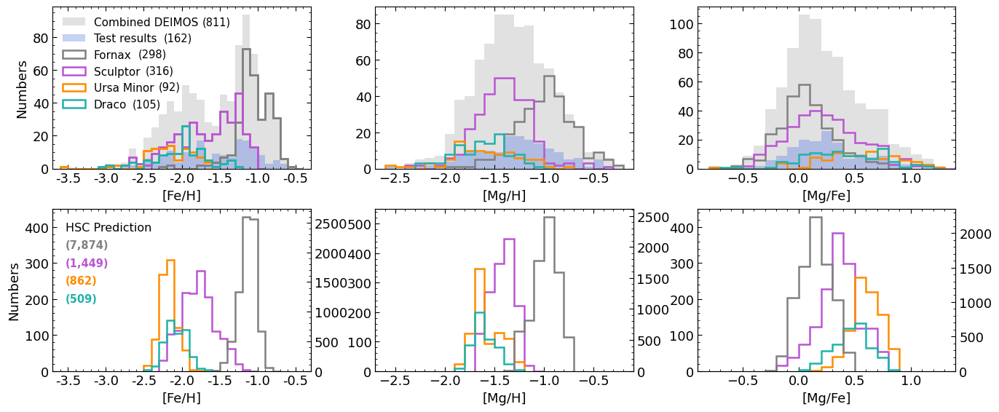

In [599]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=13)
    ax.set_ylabel(ylabel, size=13)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=13)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=13)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=13)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
ax0.hist(test_FEH['FEH'], bins=np.arange(np.floor(np.min(test_FEH['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_FEH['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers')
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xticklabels(['-3.5', '-3.0', '-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])
ax0.set_xlim([-3.7, -0.3])
ax0.text(0.58, 0.94, '({0:,.0f})'.format(len(df_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.43, 0.84, '({0:,.0f})'.format(len(test_FEH['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.33, 0.74, '({0:,.0f})'.format(len(fnx_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.36, 0.64, '({0:,.0f})'.format(len(scl_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.41, 0.54, '({0:,.0f})'.format(len(umi_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.31, 0.43, '({0:,.0f})'.format(len(dra_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_MGH['MGH'], bins=np.arange(np.floor(np.min(test_MGH['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_MGH['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_MGFE['MGFE'], bins=np.arange(np.floor(np.min(test_MGFE['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_MGFE['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_rfr'], [hsc_scl_mag['FEH_phot_rfr'], hsc_umi_mag['FEH_phot_rfr'], hsc_dra_mag['FEH_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax3.set_xticklabels(['-3.5', '-3.0', '-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 450])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_rfr'], [hsc_scl_mag['MGH_phot_rfr'], hsc_umi_mag['MGH_phot_rfr'], hsc_dra_mag['MGH_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 550])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_rfr'], [hsc_scl_mag['MGFE_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')


# Save the plot
plt.savefig('compare_rfr_feh_mgh_mgfe.png', bbox_inches='tight')

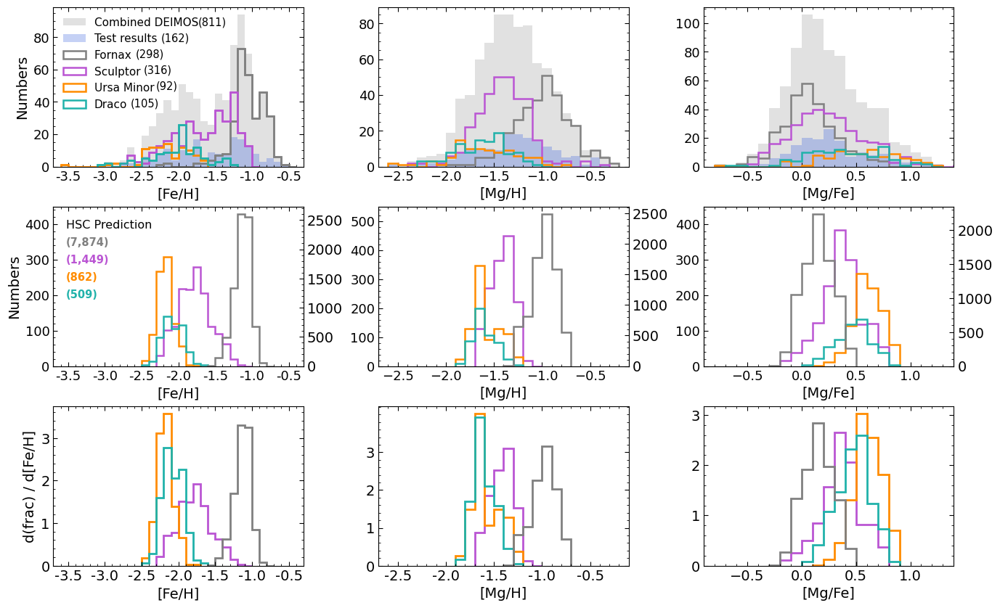

In [648]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=14)
    ax.set_ylabel(ylabel, size=14)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=13)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=13)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=14)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5), (ax6, ax7, ax8)) = plt.subplots(nrows=3, ncols=3, figsize=(16, 10), gridspec_kw={'wspace': 0.3, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
ax0.hist(test_FEH['FEH'], bins=np.arange(np.floor(np.min(test_FEH['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_FEH['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers')
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xticklabels(['-3.5', '-3.0', '-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])
ax0.set_xlim([-3.7, -0.3])
ax0.text(0.58, 0.94, '({0:,.0f})'.format(len(df_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.43, 0.84, '({0:,.0f})'.format(len(test_FEH['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.33, 0.74, '({0:,.0f})'.format(len(fnx_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.36, 0.64, '({0:,.0f})'.format(len(scl_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.41, 0.54, '({0:,.0f})'.format(len(umi_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.31, 0.43, '({0:,.0f})'.format(len(dra_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_MGH['MGH'], bins=np.arange(np.floor(np.min(test_MGH['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_MGH['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_MGFE['MGFE'], bins=np.arange(np.floor(np.min(test_MGFE['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_MGFE['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_rfr'], [hsc_scl_mag['FEH_phot_rfr'], hsc_umi_mag['FEH_phot_rfr'], hsc_dra_mag['FEH_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 450])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_rfr'], [hsc_scl_mag['MGH_phot_rfr'], hsc_umi_mag['MGH_phot_rfr'], hsc_dra_mag['MGH_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 550])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_rfr'], [hsc_scl_mag['MGFE_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

# 3rd row
labels = ['Sculptor', 'Ursa Minor', 'Draco', 'Fornax']
colors = ['mediumorchid', 'darkorange', 'lightseagreen', 'gray']

def create_data_sets(data_dict, labels, colors):
    return [(data_dict[label], label, color) for label, color in zip(labels, colors)]

data_sets = [
    ('FEH_phot_rfr', hsc_scl_mag, hsc_umi_mag, hsc_dra_mag, hsc_fnx_mag),
    ('MGH_phot_rfr', hsc_scl_mag, hsc_umi_mag, hsc_dra_mag, hsc_fnx_mag),
    ('MGFE_phot_rfr', hsc_scl_mag, hsc_umi_mag, hsc_dra_mag, hsc_fnx_mag)
]

data_sets_list = []
for feature in data_sets:
    feature_name, *datasets = feature
    data_sets_list.append(create_data_sets({label: data[feature_name] for label, data in zip(labels, datasets)}, labels, colors))

def plot_histogram(ax, data, bins_width, label, color, alpha=0.8):
    color_dict = {
        'Fornax': 'gray',
        'Sculptor': 'mediumorchid',
        'Ursa Minor': 'darkorange',
        'Draco': 'lightseagreen',
        'Training sample': 'dimgray',
        'Test results': 'royalblue'
    }
    color = color_dict.get(label, 'gray')
    
    bins = np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                     bins_width)
    counts, bin_edges = np.histogram(data, bins=bins)
    frac_dfeh = counts / (len(data) * bins_width)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    ax.stairs(frac_dfeh, bin_edges, label=label, color=color, linewidth=2)
    
    return ax

def plot_data_on_ax(ax, data_sets, xlabel, ylabel, xticks=None):
    for data, label, color in data_sets:
        plot_histogram(ax, data, bins_width, label, color, alpha=alpha)
    ax.set_ylim(bottom=0)
    ax.set_xlabel(xlabel, size=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=14)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=14)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
    
    if xticks:
        ax.set_xticks(xticks)

data_sets_0 = data_sets_list[0]
data_sets_1 = data_sets_list[1]
data_sets_2 = data_sets_list[2]
plot_data_on_ax(ax6, data_sets_0, '[Fe/H]', 'd(frac) / d[Fe/H]')
plot_data_on_ax(ax7, data_sets_1, '[Mg/H]', '')
plot_data_on_ax(ax8, data_sets_2, '[Mg/Fe]', '', xticks=[-0.5, 0.0, 0.5, 1.0])

ax3.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax3.set_xticklabels(['-3.5', '-3.0', '-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])
ax6.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax6.set_xticklabels(['-3.5', '-3.0', '-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])

ax7.set_xticks([-2.5, -2.0, -1.5, -1.0, -0.5])
ax7.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])

ax6.set_xlim([-3.7, -0.3])
ax7.set_xlim([-2.7, -0.1])
ax8.set_xlim([-0.9, 1.4])

ax7.set_yticks([0, 1, 2, 3])
ax7.set_yticklabels(['0', '1', '2', '3'])


# Save the plot
plt.savefig('compare_rfr_feh_mgh_mgfe_numbers_dfrac_dfeh.png', bbox_inches='tight')

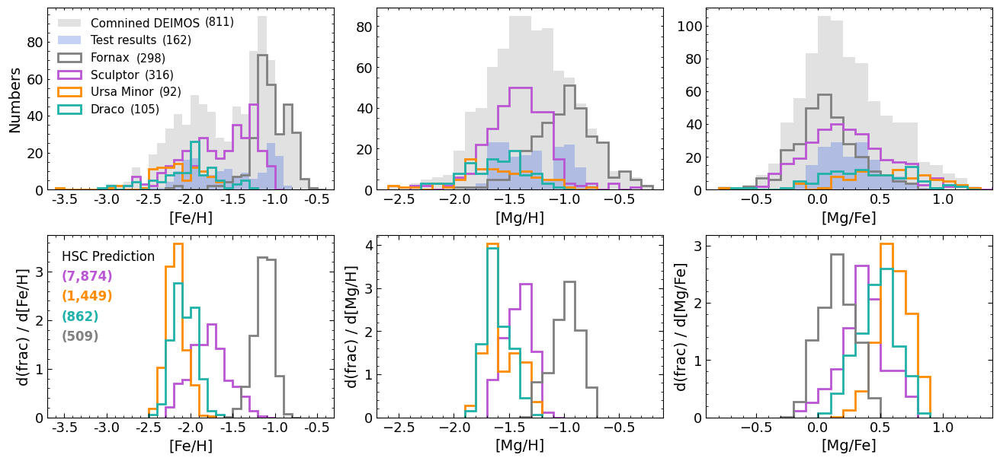

In [601]:
import matplotlib.colors as mcolors

bins_width = 0.1
alpha = 1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 7), gridspec_kw={'wspace': 0.15, 'hspace': 0.25})

data_dict_feh = {
    'Comnined DEIMOS': (df_mag['FEH'], 'dimgray', 0.2),
    'Test results': (test_FEH['FEH_phot_rfr'], 'royalblue', 0.3),
    'Fornax': (fnx_mag['FEH'], colors[0], alpha),
    'Sculptor': (scl_mag['FEH'], colors[1], alpha),
    'Ursa Minor': (umi_mag['FEH'], colors[2], alpha),
    'Draco': (dra_mag['FEH'], colors[3], alpha)
}

data_dict_mgh = {
    'Comnined DEIMOS': (df_mag['MGH'], 'dimgray', 0.2),
    'Test results': (test_MGH['MGH_phot_rfr'], 'royalblue', 0.3),
    'Fornax': (fnx_mag['MGH'], colors[0], alpha),
    'Sculptor': (scl_mag['MGH'], colors[1], alpha),
    'Ursa Minor': (umi_mag['MGH'], colors[2], alpha),
    'Draco': (dra_mag['MGH'], colors[3], alpha)
}

data_dict_mgfe = {
    'Comnined DEIMOS': (df_mag['MGFE'], 'dimgray', 0.2),
    'Test results': (test_MGFE['MGFE_phot_rfr'], 'royalblue', 0.3),
    'Fornax': (fnx_mag['MGFE'], colors[0], alpha),
    'Sculptor': (scl_mag['MGFE'], colors[1], alpha),
    'Ursa Minor': (umi_mag['MGFE'], colors[2], alpha),
    'Draco': (dra_mag['MGFE'], colors[3], alpha)
}

for data_dict, ax, xlabel in zip(
        [data_dict_feh, data_dict_mgh, data_dict_mgfe],  
        [ax0, ax1, ax2],  
        ['[Fe/H]', '[Mg/H]', '[Mg/Fe]']
):
    for label, (data, color, alpha_value) in data_dict.items():
        bins = np.arange(np.floor(np.min(data) / bins_width) * bins_width, 
                         np.ceil(np.max(data) / bins_width) * bins_width + bins_width, 
                         bins_width)
        ax.hist(data, bins=bins, histtype='step' if label not in ['Comnined DEIMOS', 'Test results'] else 'stepfilled', color=color, alpha=alpha_value, label=label, linewidth=2)
    ax.set_xlabel(xlabel, size=14)
    ax.set_ylabel('')
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=13)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=13)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)

ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xticklabels(['-3.5', '-3.0', '-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])
ax0.set_ylabel('Numbers', size=14)
ax0.legend(loc='upper left', frameon=False, fontsize=11)
ax1.legend().set_visible(False)
ax2.legend().set_visible(False)


labels = ['Sculptor', 'Ursa Minor', 'Draco', 'Fornax']
colors = ['mediumorchid', 'darkorange', 'lightseagreen', 'gray']

def create_data_sets(data_dict, labels, colors):
    return [(data_dict[label], label, color) for label, color in zip(labels, colors)]

data_sets = [
    ('FEH_phot_rfr', hsc_scl_mag, hsc_umi_mag, hsc_dra_mag, hsc_fnx_mag),
    ('MGH_phot_rfr', hsc_scl_mag, hsc_umi_mag, hsc_dra_mag, hsc_fnx_mag),
    ('MGFE_phot_rfr', hsc_scl_mag, hsc_umi_mag, hsc_dra_mag, hsc_fnx_mag)
]

data_sets_list = []
for feature in data_sets:
    feature_name, *datasets = feature
    data_sets_list.append(create_data_sets({label: data[feature_name] for label, data in zip(labels, datasets)}, labels, colors))

def plot_histogram(ax, data, bins_width, label, color, alpha=0.8):
    color_dict = {
        'Fornax': 'gray',
        'Sculptor': 'mediumorchid',
        'Ursa Minor': 'darkorange',
        'Draco': 'lightseagreen',
        'Training sample': 'dimgray',
        'Test results': 'royalblue'
    }
    color = color_dict.get(label, 'gray')
    
    bins = np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                     bins_width)
    counts, bin_edges = np.histogram(data, bins=bins)
    frac_dfeh = counts / (len(data) * bins_width)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    ax.stairs(frac_dfeh, bin_edges, label=label, color=color, linewidth=2)

#    facecolor = mcolors.to_rgba(color, alpha=0.1)
#    edgecolor = mcolors.to_rgba(color, alpha=1.0)
#    ax.stairs(frac_dfeh, bin_edges, label=label, facecolor=facecolor, fill=True, edgecolor=edgecolor, linewidth=2)
    
    return ax

def plot_data_on_ax(ax, data_sets, xlabel, ylabel, xticks=None):
    for data, label, color in data_sets:
        plot_histogram(ax, data, bins_width, label, color, alpha=0.3)
    ax.set_ylim(bottom=0)
    ax.set_xlabel(xlabel, size=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=13)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=13)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=13)
    
    if xticks:
        ax.set_xticks(xticks)

data_sets_0 = data_sets_list[0]
data_sets_1 = data_sets_list[1]
data_sets_2 = data_sets_list[2]
plot_data_on_ax(ax3, data_sets_0, '[Fe/H]', 'd(frac) / d[Fe/H]')
plot_data_on_ax(ax4, data_sets_1, '[Mg/H]', 'd(frac) / d[Mg/H]')
plot_data_on_ax(ax5, data_sets_2, '[Mg/Fe]', 'd(frac) / d[Mg/Fe]', xticks=[-0.5, 0.0, 0.5, 1.0])

ax0.text(0.55, 0.95, '({0:,.0f})'.format(len(df_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.40, 0.85, '({0:,.0f})'.format(len(test_FEH['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.31, 0.75, '({0:,.0f})'.format(len(fnx_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.34, 0.66, '({0:,.0f})'.format(len(scl_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.39, 0.57, '({0:,.0f})'.format(len(umi_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.text(0.29, 0.47, '({0:,.0f})'.format(len(dra_mag['FEH'])), ha='left', va='top', color='black', size=10.5, transform=ax0.transAxes)
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])

ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=12)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[0], size=12, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[1], size=12, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[2], size=12, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[3], size=12, transform=ax3.transAxes, fontweight='bold')

ax0.set_xlim([-3.7, -0.3])
ax1.set_xlim([-2.7, -0.1])
ax2.set_xlim([-0.9, 1.4])
ax3.set_xlim([-3.7, -0.3])
ax4.set_xlim([-2.7, -0.1])
ax5.set_xlim([-0.9, 1.4])

ax3.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax3.set_xticklabels(['-3.5', '-3.0', '-2.5', '-2.0', '-1.5', '-1.0', '-0.5'])

plt.savefig('compare_rfr_feh_mgh_mgfe_dfrac_dfeh.png', bbox_inches='tight')

In [602]:
data = {
    'FEH': [
        f"{np.median(fnx_mag['FEH']):.3f} ± {np.std(fnx_mag['FEH']):.3f}",
        f"{np.median(scl_mag['FEH']):.3f} ± {np.std(scl_mag['FEH']):.3f}",
        f"{np.median(umi_mag['FEH']):.3f} ± {np.std(umi_mag['FEH']):.3f}",
        f"{np.median(dra_mag['FEH']):.3f} ± {np.std(dra_mag['FEH']):.3f}",
        f"{np.median(hsc_fnx_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_fnx_mag['FEH_phot_rfr']):.3f}",
        f"{np.median(hsc_scl_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_scl_mag['FEH_phot_rfr']):.3f}",
        f"{np.median(hsc_umi_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_umi_mag['FEH_phot_rfr']):.3f}",
        f"{np.median(hsc_dra_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_dra_mag['FEH_phot_rfr']):.3f}"
    ],
    'MGH': [
        f"{np.median(fnx_mag['MGH']):.3f} ± {np.std(fnx_mag['MGH']):.3f}",
        f"{np.median(scl_mag['MGH']):.3f} ± {np.std(scl_mag['MGH']):.3f}",
        f"{np.median(umi_mag['MGH']):.3f} ± {np.std(umi_mag['MGH']):.3f}",
        f"{np.median(dra_mag['MGH']):.3f} ± {np.std(dra_mag['MGH']):.3f}",
        f"{np.median(hsc_fnx_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_fnx_mag['MGH_phot_rfr']):.3f}",
        f"{np.median(hsc_scl_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_scl_mag['MGH_phot_rfr']):.3f}",
        f"{np.median(hsc_umi_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_umi_mag['MGH_phot_rfr']):.3f}",
        f"{np.median(hsc_dra_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_dra_mag['MGH_phot_rfr']):.3f}"
    ],
    'MGFE': [
        f"{np.median(fnx_mag['MGFE']):.3f} ± {np.std(fnx_mag['MGFE']):.3f}",
        f"{np.median(scl_mag['MGFE']):.3f} ± {np.std(scl_mag['MGFE']):.3f}",
        f"{np.median(umi_mag['MGFE']):.3f} ± {np.std(umi_mag['MGFE']):.3f}",
        f"{np.median(dra_mag['MGFE']):.3f} ± {np.std(dra_mag['MGFE']):.3f}",
        f"{np.median(hsc_fnx_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_fnx_mag['MGFE_phot_rfr']):.3f}",
        f"{np.median(hsc_scl_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_scl_mag['MGFE_phot_rfr']):.3f}",
        f"{np.median(hsc_umi_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_umi_mag['MGFE_phot_rfr']):.3f}",
        f"{np.median(hsc_dra_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_dra_mag['MGFE_phot_rfr']):.3f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

print('Median')
df

Median


,FEH,MGH,MGFE
fnx_mag,-1.072 ± 0.231,-0.969 ± 0.288,0.057 ± 0.255
scl_mag,-1.571 ± 0.411,-1.400 ± 0.278,0.210 ± 0.336
umi_mag,-2.153 ± 0.309,-1.632 ± 0.345,0.547 ± 0.351
dra_mag,-1.962 ± 0.347,-1.600 ± 0.267,0.380 ± 0.354
hsc_fnx_mag,-1.118 ± 0.110,-0.967 ± 0.129,0.150 ± 0.139
hsc_scl_mag,-1.787 ± 0.224,-1.409 ± 0.117,0.366 ± 0.185
hsc_umi_mag,-2.186 ± 0.107,-1.617 ± 0.143,0.603 ± 0.129
hsc_dra_mag,-2.086 ± 0.138,-1.629 ± 0.112,0.490 ± 0.156


In [603]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.3f} ± {np.std(fnx_mag['FEH']):.3f}",
        f"{np.mean(scl_mag['FEH']):.3f} ± {np.std(scl_mag['FEH']):.3f}",
        f"{np.mean(umi_mag['FEH']):.3f} ± {np.std(umi_mag['FEH']):.3f}",
        f"{np.mean(dra_mag['FEH']):.3f} ± {np.std(dra_mag['FEH']):.3f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_fnx_mag['FEH_phot_rfr']):.3f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_scl_mag['FEH_phot_rfr']):.3f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_umi_mag['FEH_phot_rfr']):.3f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_rfr']):.3f} ± {np.std(hsc_dra_mag['FEH_phot_rfr']):.3f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.3f} ± {np.std(fnx_mag['MGH']):.3f}",
        f"{np.mean(scl_mag['MGH']):.3f} ± {np.std(scl_mag['MGH']):.3f}",
        f"{np.mean(umi_mag['MGH']):.3f} ± {np.std(umi_mag['MGH']):.3f}",
        f"{np.mean(dra_mag['MGH']):.3f} ± {np.std(dra_mag['MGH']):.3f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_fnx_mag['MGH_phot_rfr']):.3f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_scl_mag['MGH_phot_rfr']):.3f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_umi_mag['MGH_phot_rfr']):.3f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_rfr']):.3f} ± {np.std(hsc_dra_mag['MGH_phot_rfr']):.3f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.3f} ± {np.std(fnx_mag['MGFE']):.3f}",
        f"{np.mean(scl_mag['MGFE']):.3f} ± {np.std(scl_mag['MGFE']):.3f}",
        f"{np.mean(umi_mag['MGFE']):.3f} ± {np.std(umi_mag['MGFE']):.3f}",
        f"{np.mean(dra_mag['MGFE']):.3f} ± {np.std(dra_mag['MGFE']):.3f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_fnx_mag['MGFE_phot_rfr']):.3f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_scl_mag['MGFE_phot_rfr']):.3f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_umi_mag['MGFE_phot_rfr']):.3f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_rfr']):.3f} ± {np.std(hsc_dra_mag['MGFE_phot_rfr']):.3f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

print('Mean')
df

Mean


,FEH,MGH,MGFE
fnx_mag,-1.055 ± 0.231,-0.987 ± 0.288,0.068 ± 0.255
scl_mag,-1.653 ± 0.411,-1.413 ± 0.278,0.241 ± 0.336
umi_mag,-2.154 ± 0.309,-1.607 ± 0.345,0.548 ± 0.351
dra_mag,-2.008 ± 0.347,-1.625 ± 0.267,0.384 ± 0.354
hsc_fnx_mag,-1.135 ± 0.110,-0.984 ± 0.129,0.151 ± 0.139
hsc_scl_mag,-1.783 ± 0.224,-1.420 ± 0.117,0.363 ± 0.185
hsc_umi_mag,-2.179 ± 0.107,-1.572 ± 0.143,0.606 ± 0.129
hsc_dra_mag,-2.075 ± 0.138,-1.601 ± 0.112,0.474 ± 0.156


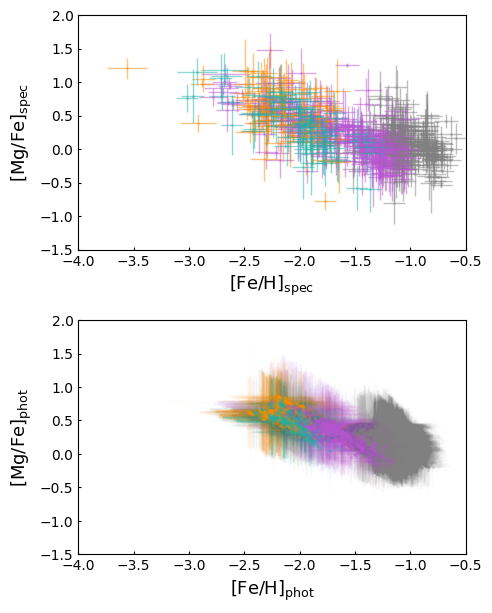

In [604]:
# Spec MGFE - FEH vs. phot MGFE - FEH
fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1, figsize=(5,7), gridspec_kw={'wspace':0.4, 'hspace':0.3})

# Spectroscopy
ax0.errorbar(fnx_mag['FEH'], fnx_mag['MGFE'], xerr=fnx_mag['FEHERR'], yerr=fnx_mag['MGFEERR'], markersize=0, fmt='o', alpha=0.5, linewidth=1, color='gray')
ax0.errorbar(scl_mag['FEH'], scl_mag['MGFE'], xerr=scl_mag['FEHERR'], yerr=scl_mag['MGFEERR'], markersize=0, fmt='o', alpha=0.5, linewidth=1, color='mediumorchid')
ax0.errorbar(umi_mag['FEH'], umi_mag['MGFE'], xerr=umi_mag['FEHERR'], yerr=umi_mag['MGFEERR'], markersize=0, fmt='o', alpha=0.5, linewidth=1, color='darkorange')
ax0.errorbar(dra_mag['FEH'], dra_mag['MGFE'], xerr=dra_mag['FEHERR'], yerr=dra_mag['MGFEERR'], markersize=0, fmt='o', alpha=0.5, linewidth=1, color='lightseagreen')
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=3, alpha=0.2, marker='*', color='gray', zorder=2)
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=3, alpha=0.2, marker='*', color='mediumorchid', zorder=2)
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=3, alpha=0.2, marker='*', color='darkorange', zorder=2)
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=3, alpha=0.2, marker='*', color='lightseagreen', zorder=2)
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, -0.5])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)

# Photometry
ax1.errorbar(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], xerr=hsc_fnx_mag['FEH_phot_rfr_err'], yerr=hsc_fnx_mag['MGFE_phot_rfr_err'], markersize=0, fmt='o', alpha=0.3, linewidth=0.1, color='gray')
ax1.errorbar(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], xerr=hsc_scl_mag['FEH_phot_rfr_err'], yerr=hsc_scl_mag['MGFE_phot_rfr_err'], markersize=0, fmt='o', alpha=0.3, linewidth=0.1, color='mediumorchid')
ax1.errorbar(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], xerr=hsc_umi_mag['FEH_phot_rfr_err'], yerr=hsc_umi_mag['MGFE_phot_rfr_err'], markersize=0, fmt='o', alpha=0.3, linewidth=0.1, color='darkorange')
ax1.errorbar(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], xerr=hsc_dra_mag['FEH_phot_rfr_err'], yerr=hsc_dra_mag['MGFE_phot_rfr_err'], markersize=0, fmt='o', alpha=0.3, linewidth=0.1, color='lightseagreen')
ax1.scatter(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], s=3, alpha=0.2, marker='*', color='gray', zorder=2)
ax1.scatter(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], s=3, alpha=0.2, marker='*', color='mediumorchid', zorder=2)
ax1.scatter(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], s=3, alpha=0.2, marker='*', color='darkorange', zorder=2)
ax1.scatter(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], s=3, alpha=0.2, marker='*', color='lightseagreen', zorder=2)
ax1.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax1.set_xlim([-4, -0.5])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)

#plt.show()
plt.savefig('compare_rfr_spec_phot_mgfe_feh_together.png', bbox_inches='tight')

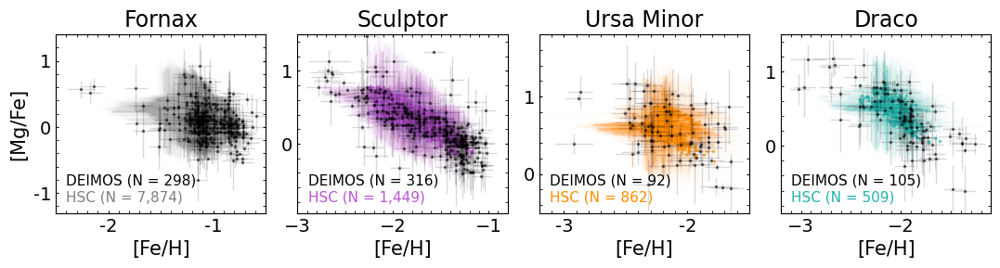

In [605]:
# Spec MGFE - FEH vs. phot MGFE - FEH
fig, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=4, figsize=(13, 2.5), gridspec_kw={'wspace':0.15})

# Fnx
ax0.errorbar(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], xerr=hsc_fnx_mag['FEH_phot_rfr_err'], yerr=hsc_fnx_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='darkgray', linewidth=0.1, capsize=0)
ax0.scatter(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='darkgray', zorder=2)
ax0.errorbar(fnx_mag['FEH'], fnx_mag['MGFE'], xerr=fnx_mag['FEHERR'], yerr=fnx_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax0.set_xlabel('[Fe/H]', size=15)
ax0.set_ylabel('[Mg/Fe]', size=15)
ax0.set_xlim([-2.5, -0.5])
ax0.set_ylim([-1.3, 1.4])
ax0.set_xticks([-2, -1])
ax0.set_xticklabels(['-2', '-1'])
ax0.set_yticks([-1, 0, 1])
ax0.set_yticklabels(['-1', '0', '1'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(10))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax0.set_title('Fornax', size=17)
ax0.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(fnx_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax0.transAxes)
ax0.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='gray', size=11, transform=ax0.transAxes)

# Scl
ax1.errorbar(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], xerr=hsc_scl_mag['FEH_phot_rfr_err'], yerr=hsc_scl_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='mediumorchid', linewidth=0.1, capsize=0)
ax1.scatter(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='mediumorchid', zorder=2)
ax1.errorbar(scl_mag['FEH'], scl_mag['MGFE'], xerr=scl_mag['FEHERR'], yerr=scl_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax1.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax1.set_xlabel('[Fe/H]', size=15)
ax1.set_ylabel('')
ax1.set_xlim([-3.0, -0.8])
ax1.set_ylim([-0.95, 1.5])
ax1.xaxis.set_minor_locator(AutoMinorLocator(10))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax1.set_title('Sculptor', size=17)
ax1.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(scl_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax1.transAxes)
ax1.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='mediumorchid', size=11, transform=ax1.transAxes)

# UMi
ax2.errorbar(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], xerr=hsc_umi_mag['FEH_phot_rfr_err'], yerr=hsc_umi_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='darkorange', linewidth=0.1, capsize=0)
ax2.scatter(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='darkorange', zorder=2)
ax2.errorbar(umi_mag['FEH'], umi_mag['MGFE'], xerr=umi_mag['FEHERR'], yerr=umi_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax2.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax2.set_xlabel('[Fe/H]', size=15)
ax2.set_ylabel('')
ax2.set_xlim([-3.2, -1.5])
ax2.set_ylim([-0.5, 1.8])
ax2.set_xticks([-3, -2])
ax2.set_xticklabels(['-3', '-2'])
ax2.xaxis.set_minor_locator(AutoMinorLocator(10))
ax2.yaxis.set_minor_locator(AutoMinorLocator(5))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax2.set_title('Ursa Minor', size=17)
ax2.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(umi_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax2.transAxes)
ax2.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='darkorange', size=11, transform=ax2.transAxes)

# Dra
ax3.errorbar(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], xerr=hsc_dra_mag['FEH_phot_rfr_err'], yerr=hsc_dra_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='lightseagreen', linewidth=0.1, capsize=0)
ax3.scatter(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='lightseagreen', zorder=2)
ax3.errorbar(dra_mag['FEH'], dra_mag['MGFE'], xerr=dra_mag['FEHERR'], yerr=dra_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax3.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax3.set_xlabel('[Fe/H]', size=15)
ax3.set_ylabel('')
ax3.set_xlim([-3.2, -1.1])
ax3.set_ylim([-0.9, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(10))
ax3.yaxis.set_minor_locator(AutoMinorLocator(5))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax3.set_title('Draco', size=17)
ax3.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(dra_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax3.transAxes)
ax3.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='lightseagreen', size=11, transform=ax3.transAxes)


plt.savefig('compare_rfr_spec_phot_mgfe_feh.png', bbox_inches='tight')

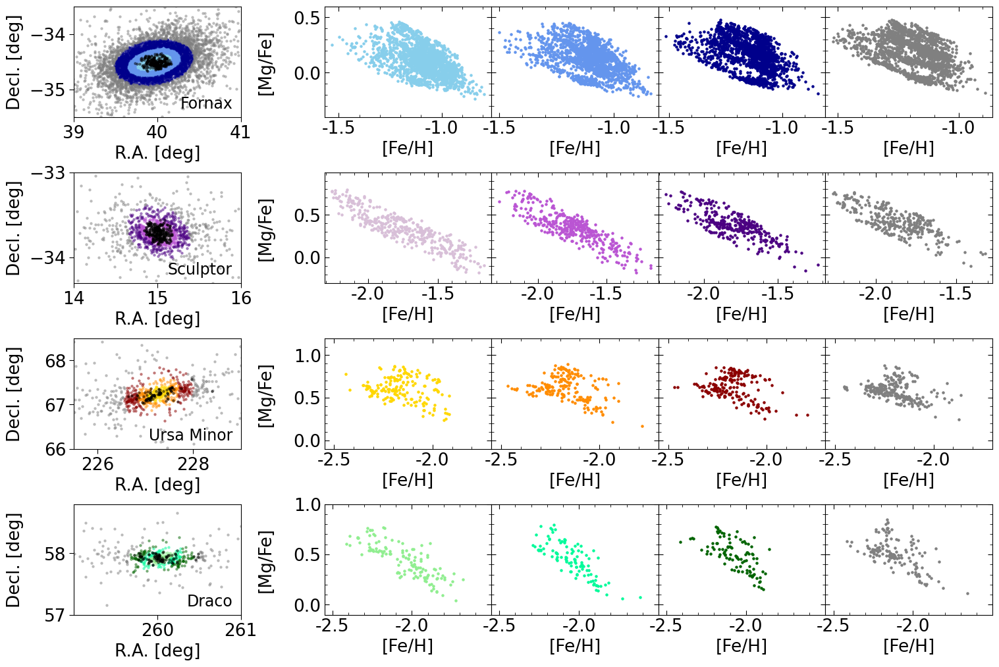

In [649]:
import matplotlib.gridspec as gridspec
from matplotlib.patches import Ellipse

def get_ellipse_mask(df, ra_col, dec_col, ra0, dec0, r_a, r_b, angle_deg):
    theta = np.radians(360 - angle_deg)
    x = df[ra_col].values
    y = df[dec_col].values
    x_rot = x * np.cos(theta) - y * np.sin(theta)
    y_rot = x * np.sin(theta) + y * np.cos(theta)
    x0_rot = ra0 * np.cos(theta) - dec0 * np.sin(theta)
    y0_rot = ra0 * np.sin(theta) + dec0 * np.cos(theta)
    mask = ((r_b * (x_rot - x0_rot))**2 + (r_a * (y_rot - y0_rot))**2) <= (r_a * r_b)**2
    return mask

# Main figure
fig = plt.figure(figsize=(18, 12))
gs_main = gridspec.GridSpec(nrows=4, ncols=2, width_ratios=[1.0, 4], wspace=0.2, hspace=0.5)

for row, (data_ra, data_chem, xticks_ra, yticks_ra) in enumerate([
    ( {'hsc': hsc_fnx_mag, 'dei': fnx_mag},
      {'hsc': 'FEH_phot_rfr', 'hsc_y': 'MGFE_phot_rfr'}, 
      [39, 40, 41], None ),
    ( {'hsc': hsc_scl_mag, 'dei': scl_mag},
      {'hsc': 'FEH_phot_rfr', 'hsc_y': 'MGFE_phot_rfr'}, 
      [14, 15, 16], [-34, -33] ),
    ( {'hsc': hsc_umi_mag, 'dei': umi_mag},
      {'hsc': 'FEH_phot_rfr', 'hsc_y': 'MGFE_phot_rfr'}, 
      None, None ),
    ( {'hsc': hsc_dra_mag, 'dei': dra_mag},
      {'hsc': 'FEH_phot_rfr', 'hsc_y': 'MGFE_phot_rfr'}, 
      [260, 261], None ),
]):
    if row == 0:
        angle = 30
        colors = ['skyblue', 'cornflowerblue', 'darkblue', 'gray']
        ellipses = [
            {'r_a': 0.245, 'r_b': 0.141},
            {'r_a': 0.352, 'r_b': 0.248},
            {'r_a': 0.500, 'r_b': 0.396},
        ]
        xlim, ylim = [39, 41], [-35.5, -33.5]
    elif row == 1:
        angle = 150
        colors = ['thistle', 'mediumorchid', 'indigo', 'gray']
        ellipses = [
            {'r_a': 0.177, 'r_b': 0.075},
            {'r_a': 0.254, 'r_b': 0.152},
            {'r_a': 0.398, 'r_b': 0.296},
        ]
        xlim, ylim = [14, 16], [-34.3, -33]
    elif row == 2:
        angle = 30
        colors = ['gold', 'darkorange', 'darkred', 'gray']
        ellipses = [
            {'r_a': 0.275, 'r_b': 0.170},
            {'r_a': 0.466, 'r_b': 0.361},
            {'r_a': 0.753, 'r_b': 0.648},
        ]
        xlim, ylim = [225.5, 229], [66, 68.5]
    elif row == 3:
        angle = 30
        colors = ['lightgreen', 'mediumspringgreen', 'darkgreen', 'gray']
        ellipses = [
            {'r_a': 0.189, 'r_b': 0.084},
            {'r_a': 0.278, 'r_b': 0.173},
            {'r_a': 0.429, 'r_b': 0.324},
        ]
        xlim, ylim = [259, 261], [57, 58.8]
        
    ra0 = data_ra['hsc']['ra'].mean()
    dec0 = data_ra['hsc']['dec'].mean()
    mask0_hsc = get_ellipse_mask(data_ra['hsc'], 'ra', 'dec', ra0, dec0,
                                 ellipses[0]['r_a'], ellipses[0]['r_b'], angle)
    mask1_hsc = get_ellipse_mask(data_ra['hsc'], 'ra', 'dec', ra0, dec0,
                                 ellipses[1]['r_a'], ellipses[1]['r_b'], angle)
    mask2_hsc = get_ellipse_mask(data_ra['hsc'], 'ra', 'dec', ra0, dec0,
                                 ellipses[2]['r_a'], ellipses[2]['r_b'], angle)
    hsc_area_0 = data_ra['hsc'][mask0_hsc]
    hsc_area_1 = data_ra['hsc'][mask1_hsc & ~mask0_hsc]
    hsc_area_2 = data_ra['hsc'][mask2_hsc & ~mask1_hsc]
    hsc_area_3 = data_ra['hsc'][~mask0_hsc & ~mask1_hsc & ~mask2_hsc]

    ax_ra_dec = fig.add_subplot(gs_main[row, 0])
    for area, color in zip([hsc_area_0, hsc_area_1, hsc_area_2, hsc_area_3], colors):
        ax_ra_dec.scatter(area['ra'], area['dec'], s=5, alpha=0.4, color=color)
    ax_ra_dec.scatter(data_ra['dei']['ra'], data_ra['dei']['dec'], s=5, alpha=0.4, color='black')
    ax_ra_dec.set_xlim(xlim)
    ax_ra_dec.set_ylim(ylim)

    if xticks_ra is not None:
        ax_ra_dec.set_xticks(xticks_ra)
    if yticks_ra is not None:
        ax_ra_dec.set_yticks(yticks_ra)

    ax_ra_dec.set_xlabel('R.A. [deg]', fontsize=19)
    ax_ra_dec.set_ylabel('Decl. [deg]', fontsize=19)

    ax_ra_dec.yaxis.set_label_coords(-0.3, 0.5)
    ax_ra_dec.tick_params(axis='both', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
    ax_ra_dec.tick_params(axis='both', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)

    if row == 0:
        ax_ra_dec.text(0.95, 0.05, 'Fornax', ha='right', va='bottom', transform=ax_ra_dec.transAxes, size=17)
    if row == 1:
        ax_ra_dec.text(0.95, 0.05, 'Sculptor', ha='right', va='bottom', transform=ax_ra_dec.transAxes, size=17)
    if row == 2:
        ax_ra_dec.text(0.95, 0.05, 'Ursa Minor', ha='right', va='bottom', transform=ax_ra_dec.transAxes, size=17)
    if row == 3:
        ax_ra_dec.text(0.95, 0.05, 'Draco', ha='right', va='bottom', transform=ax_ra_dec.transAxes, size=17)

    # axs[0, (1,2,3,4)]
    gs_chem = gridspec.GridSpecFromSubplotSpec(1, 4, subplot_spec=gs_main[row, 1], wspace=0.0)
    chem_axes = []
    for i in range(4):
        ax_chem = fig.add_subplot(gs_chem[0, i], sharey=None)
        chem_axes.append(ax_chem)

        if i > 0:
            ax_chem.tick_params(labelleft=False)
        ax_chem.xaxis.set_minor_locator(AutoMinorLocator(5))
        ax_chem.yaxis.set_minor_locator(AutoMinorLocator(5))
        ax_chem.tick_params(axis='both', which='major', direction='in', right=True, top=True, length=5, labelsize=19)
        ax_chem.tick_params(axis='both', which='minor', direction='in', right=True, top=True, length=3, labelsize=19)
        ax_chem.yaxis.set_label_coords(-0.3, 0.5)
        ax_chem.set_xlabel('[Fe/H]', fontsize=19)
        if i == 0:
            FEH = hsc_area_0[data_chem['hsc']]
            MGFE = hsc_area_0[data_chem['hsc_y']]
        elif i == 1:
            FEH = hsc_area_1[data_chem['hsc']]
            MGFE = hsc_area_1[data_chem['hsc_y']]
        elif i == 2:
            FEH = hsc_area_2[data_chem['hsc']]
            MGFE = hsc_area_2[data_chem['hsc_y']]
        else:
            FEH = hsc_area_3[data_chem['hsc']]
            MGFE = hsc_area_3[data_chem['hsc_y']]
        ax_chem.scatter(FEH, MGFE, s=5, alpha=1, color=colors[i])
        
        if i == 0:
            ax_chem.set_ylabel('[Mg/Fe]', fontsize=19)
        else:
            ax_chem.set_ylabel('')

        
        if row == 0:
            ax_chem.set_ylim([-0.4, 0.6])
            ax_chem.set_xticks([-1.5, -1.0])
            ax_chem.set_xticklabels(['-1.5', '-1.0'])
            ax_chem.set_yticks([0.0, 0.5])
            ax_chem.set_yticklabels(['0.0', '0.5'])
        if row == 1:
            ax_chem.set_ylim([-0.3, 1.0])
            ax_chem.set_xticks([-2.0, -1.5])
            ax_chem.set_xticklabels(['-2.0', '-1.5'])
            ax_chem.set_yticks([0.0, 0.5])
            ax_chem.set_yticklabels(['0.0', '0.5'])
        if row == 2:
            ax_chem.set_xlim([-2.55, -1.7])
            ax_chem.set_ylim([-0.1, 1.2])
            ax_chem.set_xticks([-2.5, -2.0])
            ax_chem.set_xticklabels(['-2.5', '-2.0'])
            ax_chem.set_yticks([0.0, 0.5, 1.0])
            ax_chem.set_yticklabels(['0.0', '0.5', '1.0'])
        if row == 3:
            ax_chem.set_xlim([-2.55, -1.5])
            ax_chem.set_ylim([-0.1, 1.0])
            ax_chem.set_xticks([-2.5, -2.0])
            ax_chem.set_xticklabels(['-2.5', '-2.0'])
            ax_chem.set_yticks([0.0, 0.5, 1.0])
            ax_chem.set_yticklabels(['0.0', '0.5', '1.0'])

plt.savefig('compare_rfr_spec_phot_mgfe_feh_radec_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

In [607]:
# from mpl_toolkits.mplot3d import Axes3D

# fig = plt.figure(figsize=(13, 6))
# ax0 = fig.add_subplot(111, projection='3d')
# fig.patch.set_alpha(0)  # Figure background transparency
# ax0.set_facecolor('none')  # Axis background transparency

# ramin, ramax = 39, 41
# #decmin, decmax = -35.5, -33.5
# s = 10
# alpha = 0.5

# x = hsc_fnx_mag['FEH_phot_rfr']
# y = hsc_fnx_mag['MGFE_phot_rfr']
# z = hsc_fnx_mag['ra']
# ax0.scatter(x, y, z, s=s, alpha=alpha, marker='o', color='darkgray', zorder=2)

# x_fnx = fnx_mag['FEH']
# y_fnx = fnx_mag['MGFE']
# z_fnx = fnx_mag['ra']
# ax0.scatter(x_fnx, y_fnx, z_fnx, s=s, alpha=alpha, marker='o', color='black', zorder=2)

# ax0.set_xticks([-2.0, -1.5, -1.0, -0.5])
# ax0.set_xticklabels(['-2', '-1.5', '-1', '-0.5'], fontsize=14)

# ax0.set_yticks([-1.0, 0.0, 1.0])
# ax0.set_yticklabels(['-1', '0', '1'], fontsize=14)

# ax0.set_zticks([39, 40, 41])
# ax0.set_zticklabels(['39', '40', '41'], fontsize=14)

# ax0.set_xlabel('[Fe/H]', size=13)
# ax0.set_ylabel('[Mg/Fe]', size=13)
# ax0.set_zlabel('R.A.', size=13)
# ax0.set_xlim([-2.5, -0.5])
# ax0.set_ylim([-1.3, 1.4])
# ax0.set_zlim(min(z), max(z))
# #ax0.set_title('Fornax (3D)', size=17)
# #ax0.text(0.05, 0.95, 'DEIMOS (N = {0:,.0f})'.format(len(fnx_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax0.transAxes)
# #ax0.text(0.05, 0.85, 'HSC (N = {0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='gray', size=11, transform=ax0.transAxes)

# ax0.view_init(elev=170, azim=270)  # Adjust as needed

# #plt.savefig('feh_mgfe_ra_3d_Fornax.png', bbox_inches='tight')
# plt.show()

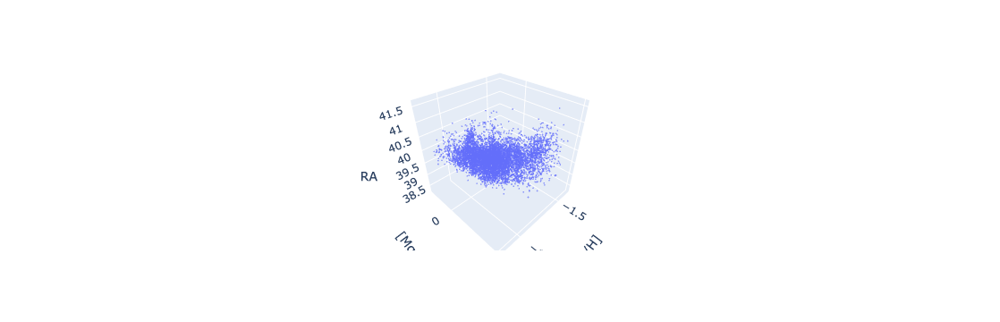

In [43]:
import plotly.express as px

fig = px.scatter_3d(
    hsc_fnx_mag, 
    x='FEH_phot_rfr', 
    y='MGFE_phot_rfr', 
    z='ra',
    opacity=0.7,
#    color='FEH_phot_rfr',
#    title="3D Scatter Plot of Fornax",
    labels={'FEH_phot_rfr': '[Fe/H]', 'MGFE_phot_rfr': '[Mg/Fe]', 'ra': 'RA'}
)

fig.update_traces(marker=dict(size=1))

fig.show()

In [44]:
slope_fnx, intercept_fnx = np.polyfit(fnx_mag['FEH'], fnx_mag['MGFE'], 1)
predicted_fnx_FEH = slope_fnx * fnx_mag['FEH'] + intercept_fnx
slope_hsc_fnx, intercept_hsc_fnx = np.polyfit(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], 1)
predicted_hsc_fnx_FEH = slope_hsc_fnx * hsc_fnx_mag['FEH_phot_rfr'] + intercept_hsc_fnx
slope_scl, intercept_scl = np.polyfit(scl_mag['FEH'], scl_mag['MGFE'], 1)
predicted_scl_FEH = slope_scl * scl_mag['FEH'] + intercept_scl
slope_hsc_scl, intercept_hsc_scl = np.polyfit(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], 1)
predicted_hsc_scl_FEH = slope_hsc_scl * hsc_scl_mag['FEH_phot_rfr'] + intercept_hsc_scl
slope_umi, intercept_umi = np.polyfit(umi_mag['FEH'], umi_mag['MGFE'], 1)
predicted_umi_FEH = slope_umi * umi_mag['FEH'] + intercept_umi
slope_hsc_umi, intercept_hsc_umi = np.polyfit(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], 1)
predicted_hsc_umi_FEH = slope_hsc_umi * hsc_umi_mag['FEH_phot_rfr'] + intercept_hsc_umi
slope_dra, intercept_dra = np.polyfit(dra_mag['FEH'], dra_mag['MGFE'], 1)
predicted_dra_FEH = slope_dra * dra_mag['FEH'] + intercept_dra
slope_hsc_dra, intercept_hsc_dra = np.polyfit(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], 1)
predicted_hsc_dra_FEH = slope_hsc_dra * hsc_dra_mag['FEH_phot_rfr'] + intercept_hsc_dra

predicted_fnx_MGFE = slope_fnx * fnx_mag['MGFE'] + intercept_fnx
predicted_hsc_fnx_MGFE = slope_hsc_fnx * hsc_fnx_mag['MGFE_phot_rfr'] + intercept_hsc_fnx
predicted_scl_MGFE = slope_scl * scl_mag['MGFE'] + intercept_scl
predicted_hsc_scl_MGFE = slope_hsc_scl * hsc_scl_mag['MGFE_phot_rfr'] + intercept_hsc_scl
predicted_umi_MGFE = slope_umi * umi_mag['MGFE'] + intercept_umi
predicted_hsc_umi_MGFE = slope_hsc_umi * hsc_umi_mag['MGFE_phot_rfr'] + intercept_hsc_umi
predicted_dra_MGFE = slope_dra * dra_mag['MGFE'] + intercept_dra
predicted_hsc_dra_MGFE = slope_hsc_dra * hsc_dra_mag['MGFE_phot_rfr'] + intercept_hsc_dra

In [45]:
# def plot_2d_histogram(ax, x, y, xlabel, ylabel, xlim, ylim, vmin=None, vmax=None, ticks=None):
#     bins_width = 0.1
#     xbins = np.arange(np.floor(np.min(x) / bins_width) * bins_width, 
#                       np.ceil(np.max(x) / bins_width) * bins_width + bins_width, bins_width)
#     ybins = np.arange(np.floor(np.min(y) / bins_width) * bins_width, 
#                       np.ceil(np.max(y) / bins_width) * bins_width + bins_width, bins_width)

#     counts, xedges, yedges = np.histogram2d(x, y, bins=(xbins, ybins))

#     median_values = []
#     for i in range(len(xedges) - 1):
#         mask = (xedges[i] <= x) & (x < xedges[i+1])
#         y_in_bin = y[mask]
#         if len(y_in_bin) >= 5:
#             median_values.append(np.median(y_in_bin))
#         else:
#             median_values.append(np.nan)

#     xedges_centered = (xedges[:-1] + xedges[1:]) / 2
#     median_values = median_values[:len(xedges_centered)]

#     extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
#     im = ax.imshow(counts.T, cmap='plasma', alpha=0.5, origin='lower', extent=extent, aspect='auto', norm=LogNorm(vmin=vmin, vmax=vmax))
#     ax.set_xlim(xlim)
#     ax.set_ylim(ylim)
#     ax.set_xlabel(xlabel, size=16)
#     ax.set_ylabel(ylabel, size=16)
#     ax.xaxis.set_minor_locator(AutoMinorLocator(5))
#     ax.yaxis.set_minor_locator(AutoMinorLocator(5))
#     ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=16)
#     ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=16)
#     ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=16)
#     ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=16)

#     # Plot median line
#     ax.plot(xedges_centered, median_values, color='k', label='Median', lw=3)

#     # Add color bar
#     cax = ax.inset_axes([0.63, 0.82, 0.3, 0.05])
#     fig.add_axes(cax)
#     cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
#     cbar.ax.tick_params(labelsize=12, direction='in')
#     cbar.ax.xaxis.set_ticks_position('top')
#     cbar.ax.xaxis.set_label_position('top')
#     cbar.set_label('', size=15, labelpad=4, loc='center')
#     if ax in [ax4, ax6]:
#         cbar.locator = LogLocator(base=10.0, subs=np.arange(1, 10) * 0.1, numticks=10)
#         cbar.formatter = LogFormatter(base=10.0, labelOnlyBase=False)
#     else:
#         cbar.locator = LogLocator(base=10.0, subs=np.arange(1, 10) * 0.1, numticks=5)
#         cbar.formatter = LogFormatter(base=10.0, labelOnlyBase=True)     
#     cbar.update_ticks()

# # Create subplots
# fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), gridspec_kw={'wspace': 0.25, 'hspace': 0.3})
# (ax0, ax1), (ax2, ax3), (ax4, ax5), (ax6, ax7) = axes
# ymin, ymax = -1.2, 1.9

# # Fornax
# xmin, xmax = -3.5, 0
# xmin, xmax = -3.9, -0.3
# plot_2d_histogram(ax0, fnx_mag['FEH'], fnx_mag['MGFE'], r'[Fe/H]$_\mathrm{spec}$', r'[Mg/Fe]$_\mathrm{spec}$', [xmin, xmax], [ymin, ymax], vmin=1, vmax=10)
# ax0.text(0.05, 0.94, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=16)
# ax0.text(0.05, 0.15, 'DEIMOS', ha='left', va='bottom', transform=ax0.transAxes, size=16)
# ax0.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(fnx_mag['FEH'])), ha='left', va='bottom', transform=ax0.transAxes, size=16)
# plot_2d_histogram(ax1, hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], r'[Fe/H]$_\mathrm{phot}$', r'[Mg/Fe]$_\mathrm{phot}$', [xmin, xmax], [ymin, ymax])
# ax1.text(0.05, 0.94, 'Fornax', ha='left', va='top', transform=ax1.transAxes, size=16)
# ax1.text(0.05, 0.15, 'HSC', ha='left', va='bottom', transform=ax1.transAxes, size=16)
# ax1.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='bottom', transform=ax1.transAxes, size=16)

# # Sculptor
# xmin, xmax = -3.2, -0.5
# xmin, xmax = -3.9, -0.3
# plot_2d_histogram(ax2, scl_mag['FEH'], scl_mag['MGFE'], r'[Fe/H]$_\mathrm{spec}$', r'[Mg/Fe]$_\mathrm{spec}$', [xmin, xmax], [ymin, ymax], vmin=1, vmax=10)
# ax2.text(0.05, 0.94, 'Sculptor', ha='left', va='top', transform=ax2.transAxes, size=16)
# ax2.text(0.05, 0.15, 'DEIMOS', ha='left', va='bottom', transform=ax2.transAxes, size=16)
# ax2.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(scl_mag['FEH'])), ha='left', va='bottom', transform=ax2.transAxes, size=16)
# plot_2d_histogram(ax3, hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], r'[Fe/H]$_\mathrm{phot}$', r'[Mg/Fe]$_\mathrm{phot}$', [xmin, xmax], [ymin, ymax], vmin=1, vmax=30)
# ax3.text(0.05, 0.94, 'Sculptor', ha='left', va='top', transform=ax3.transAxes, size=16)
# ax3.text(0.05, 0.15, 'HSC', ha='left', va='bottom', transform=ax3.transAxes, size=16)
# ax3.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(hsc_scl_mag['FEH_phot_rfr'])), ha='left', va='bottom', transform=ax3.transAxes, size=16)

# # Ursa Minor
# xmin, xmax = -4, -0.5
# xmin, xmax = -3.9, -0.3
# plot_2d_histogram(ax4, umi_mag['FEH'], umi_mag['MGFE'], r'[Fe/H]$_\mathrm{spec}$', r'[Mg/Fe]$_\mathrm{spec}$', [xmin, xmax], [ymin, ymax], vmin=1, vmax=3)
# ax4.text(0.05, 0.94, 'Ursa Minor', ha='left', va='top', transform=ax4.transAxes, size=16)
# ax4.text(0.05, 0.15, 'DEIMOS', ha='left', va='bottom', transform=ax4.transAxes, size=16)
# ax4.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(umi_mag['FEH'])), ha='left', va='bottom', transform=ax4.transAxes, size=16)
# plot_2d_histogram(ax5, hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], r'[Fe/H]$_\mathrm{phot}$', r'[Mg/Fe]$_\mathrm{phot}$', [xmin, xmax], [ymin, ymax], vmin=1, vmax=30)
# ax5.text(0.05, 0.94, 'Ursa Minor', ha='left', va='top', transform=ax5.transAxes, size=16)
# ax5.text(0.05, 0.15, 'HSC', ha='left', va='bottom', transform=ax5.transAxes, size=16)
# ax5.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(hsc_umi_mag['FEH_phot_rfr'])), ha='left', va='bottom', transform=ax5.transAxes, size=16)

# # Draco
# xmin, xmax = -4, -0.5
# xmin, xmax = -3.9, -0.3
# plot_2d_histogram(ax6, dra_mag['FEH'], dra_mag['MGFE'], r'[Fe/H]$_\mathrm{spec}$', r'[Mg/Fe]$_\mathrm{spec}$', [xmin, xmax], [ymin, ymax], vmin=1, vmax=3)
# ax6.text(0.05, 0.94, 'Draco', ha='left', va='top', transform=ax6.transAxes, size=16)
# ax6.text(0.05, 0.15, 'DEIMOS', ha='left', va='bottom', transform=ax6.transAxes, size=16)
# ax6.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(dra_mag['FEH'])), ha='left', va='bottom', transform=ax6.transAxes, size=16)
# plot_2d_histogram(ax7, hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], r'[Fe/H]$_\mathrm{phot}$', r'[Mg/Fe]$_\mathrm{phot}$', [xmin, xmax], [ymin, ymax], vmin=1, vmax=30)
# ax7.text(0.05, 0.94, 'Draco', ha='left', va='top', transform=ax7.transAxes, size=16)
# ax7.text(0.05, 0.15, 'HSC', ha='left', va='bottom', transform=ax7.transAxes, size=16)
# ax7.text(0.05, 0.05, 'N = {0:,.0f}'.format(len(hsc_dra_mag['FEH_phot_rfr'])), ha='left', va='bottom', transform=ax7.transAxes, size=16)


# plt.savefig('compare_rfr_spec_phot_mgfe_feh_hist2d_medianline.png', bbox_inches='tight')

In [608]:
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.table import Table, join, join_skycoord

def prepare_table(df):
    table = Table.from_pandas(df)
    table['coord'] = SkyCoord(table['ra'], table['dec'], unit=(u.degree, u.degree))
    return table

fnx_mag_match_table = prepare_table(fnx_mag)
hsc_fnx_mag_match_table = prepare_table(hsc_fnx_mag)
scl_mag_match_table = prepare_table(scl_mag)
hsc_scl_mag_match_table = prepare_table(hsc_scl_mag)
umi_mag_match_table = prepare_table(umi_mag)
hsc_umi_mag_match_table = prepare_table(hsc_umi_mag)
dra_mag_match_table = prepare_table(dra_mag)
hsc_dra_mag_match_table = prepare_table(hsc_dra_mag)

def merge_catalogs(cat1, cat2, cat_names=['1', '2'], match_radius=1, join_type='outer'):
    join_func = join_skycoord(match_radius * u.arcsec)
    data = join(cat1, cat2, keys='coord', join_funcs={'coord': join_func}, table_names=cat_names)
    return data.to_pandas()

fnx_match = merge_catalogs(fnx_mag_match_table, hsc_fnx_mag_match_table)
scl_match = merge_catalogs(scl_mag_match_table, hsc_scl_mag_match_table)
umi_match = merge_catalogs(umi_mag_match_table, hsc_umi_mag_match_table)
dra_match = merge_catalogs(dra_mag_match_table, hsc_dra_mag_match_table)

print(f'len(fnx_mag) = {len(fnx_mag)}, len(fnx_match) = {len(fnx_match)}')
print(f'len(scl_mag) = {len(scl_mag)}, len(scl_match) = {len(scl_match)}')
print(f'len(umi_mag) = {len(umi_mag)}, len(umi_match) = {len(umi_match)}')
print(f'len(dra_mag) = {len(dra_mag)}, len(dra_match) = {len(dra_match)}')

len(fnx_mag) = 298, len(fnx_match) = 298
len(scl_mag) = 316, len(scl_match) = 316
len(umi_mag) = 92, len(umi_match) = 92
len(dra_mag) = 105, len(dra_match) = 105


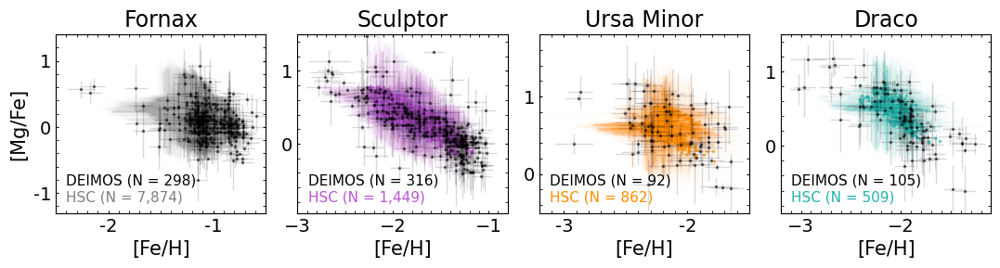

In [609]:
# Spec MGFE - FEH vs. phot MGFE - FEH
fig, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=4, figsize=(13, 2.5), gridspec_kw={'wspace':0.15})

# Fnx
ax0.errorbar(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], xerr=hsc_fnx_mag['FEH_phot_rfr_err'], yerr=hsc_fnx_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='darkgray', linewidth=0.1, capsize=0)
ax0.scatter(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='darkgray', zorder=2)
ax0.errorbar(fnx_mag['FEH'], fnx_mag['MGFE'], xerr=fnx_mag['FEHERR'], yerr=fnx_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax0.set_xlabel('[Fe/H]', size=15)
ax0.set_ylabel('[Mg/Fe]', size=15)
ax0.set_xlim([-2.5, -0.5])
ax0.set_ylim([-1.3, 1.4])
ax0.set_xticks([-2, -1])
ax0.set_xticklabels(['-2', '-1'])
ax0.set_yticks([-1, 0, 1])
ax0.set_yticklabels(['-1', '0', '1'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(10))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax0.set_title('Fornax', size=17)
ax0.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(fnx_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax0.transAxes)
ax0.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='gray', size=11, transform=ax0.transAxes)

# Scl
ax1.errorbar(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], xerr=hsc_scl_mag['FEH_phot_rfr_err'], yerr=hsc_scl_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='mediumorchid', linewidth=0.1, capsize=0)
ax1.scatter(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='mediumorchid', zorder=2)
ax1.errorbar(scl_mag['FEH'], scl_mag['MGFE'], xerr=scl_mag['FEHERR'], yerr=scl_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax1.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax1.set_xlabel('[Fe/H]', size=15)
ax1.set_ylabel('')
ax1.set_xlim([-3.0, -0.8])
ax1.set_ylim([-0.95, 1.5])
ax1.xaxis.set_minor_locator(AutoMinorLocator(10))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax1.set_title('Sculptor', size=17)
ax1.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(scl_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax1.transAxes)
ax1.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='mediumorchid', size=11, transform=ax1.transAxes)

# UMi
ax2.errorbar(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], xerr=hsc_umi_mag['FEH_phot_rfr_err'], yerr=hsc_umi_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='darkorange', linewidth=0.1, capsize=0)
ax2.scatter(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='darkorange', zorder=2)
ax2.errorbar(umi_mag['FEH'], umi_mag['MGFE'], xerr=umi_mag['FEHERR'], yerr=umi_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax2.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax2.set_xlabel('[Fe/H]', size=15)
ax2.set_ylabel('')
ax2.set_xlim([-3.2, -1.5])
ax2.set_ylim([-0.5, 1.8])
ax2.set_xticks([-3, -2])
ax2.set_xticklabels(['-3', '-2'])
ax2.xaxis.set_minor_locator(AutoMinorLocator(10))
ax2.yaxis.set_minor_locator(AutoMinorLocator(5))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax2.set_title('Ursa Minor', size=17)
ax2.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(umi_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax2.transAxes)
ax2.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='darkorange', size=11, transform=ax2.transAxes)

# Dra
ax3.errorbar(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], xerr=hsc_dra_mag['FEH_phot_rfr_err'], yerr=hsc_dra_mag['MGFE_phot_rfr_err'],
             markersize=0, fmt='*', alpha=0.2, color='lightseagreen', linewidth=0.1, capsize=0)
ax3.scatter(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], s=4, alpha=0.5, marker='*', color='lightseagreen', zorder=2)
ax3.errorbar(dra_mag['FEH'], dra_mag['MGFE'], xerr=dra_mag['FEHERR'], yerr=dra_mag['MGFEERR'],
             markersize=0, fmt='o', alpha=0.15, color='black', linewidth=1, capsize=0)
ax3.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=3, alpha=0.5, marker='*', color='black', zorder=2)
ax3.set_xlabel('[Fe/H]', size=15)
ax3.set_ylabel('')
ax3.set_xlim([-3.2, -1.1])
ax3.set_ylim([-0.9, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(10))
ax3.yaxis.set_minor_locator(AutoMinorLocator(5))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=14)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
ax3.set_title('Draco', size=17)
ax3.text(0.05, 0.14, 'DEIMOS (N = {0:,.0f})'.format(len(dra_mag['FEH'])), ha='left', va='bottom', color='black', size=11, transform=ax3.transAxes)
ax3.text(0.05, 0.05, 'HSC (N = {0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_rfr'])), ha='left', va='bottom', color='lightseagreen', size=11, transform=ax3.transAxes)


plt.savefig('compare_rfr_spec_phot_mgfe_feh.png', bbox_inches='tight')

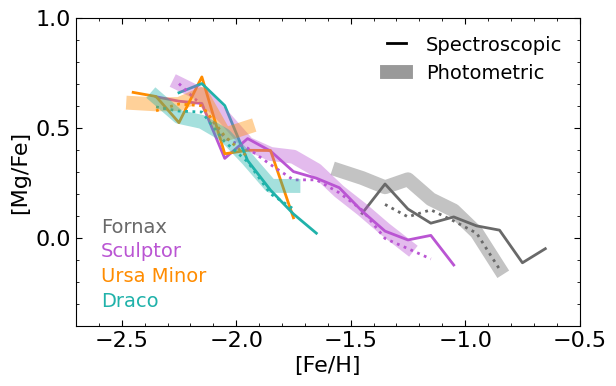

In [610]:
def plot_combined_median(ax, datasets, colors, linestyle, alpha, lw):
    for (x, y), color in zip(datasets, colors):
        bins_width = 0.1
        xbins = np.arange(np.floor(np.min(x) / bins_width) * bins_width, 
                          np.ceil(np.max(x) / bins_width) * bins_width + bins_width, bins_width)
        
        median_values = []
        xedges_centered = (xbins[:-1] + xbins[1:]) / 2
        
        for i in range(len(xbins) - 1):
            mask = (xbins[i] <= x) & (x < xbins[i+1])
            y_in_bin = y[mask]
            if len(y_in_bin) >= 5:
                median_values.append(np.median(y_in_bin))
            else:
                median_values.append(np.nan)
        
        median_values = median_values[:len(xedges_centered)]
        ax.plot(xedges_centered, median_values, color=color, linestyle=linestyle, alpha=alpha, lw=lw)

# Figure
fig, ax = plt.subplots(figsize=(6.5, 4))
ymin, ymax = -0.4, 1.0
xmin, xmax = -2.7, -0.5

deimos_datasets = [
    (fnx_mag['FEH'], fnx_mag['MGFE']),
    (scl_mag['FEH'], scl_mag['MGFE']),
    (umi_mag['FEH'], umi_mag['MGFE']),
    (dra_mag['FEH'], dra_mag['MGFE'])
]
colors = ['dimgray', 'mediumorchid', 'darkorange', 'lightseagreen']
plot_combined_median(ax, deimos_datasets, colors, linestyle='-', alpha=1, lw=2)

hsc_deimosregion_datasets = [
    (fnx_match['FEH_phot_rfr'], fnx_match['MGFE_phot_rfr']),
    (scl_match['FEH_phot_rfr'], scl_match['MGFE_phot_rfr']),
    (umi_match['FEH_phot_rfr'], umi_match['MGFE_phot_rfr']),
    (dra_match['FEH_phot_rfr'], dra_match['MGFE_phot_rfr'])
]
colors = ['dimgray', 'mediumorchid', 'darkorange', 'lightseagreen']
plot_combined_median(ax, hsc_deimosregion_datasets, colors, linestyle=':', alpha=1, lw=2)

hsc_datasets = [
    (hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr']),
    (hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr']),
    (hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr']),
    (hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'])
]
plot_combined_median(ax, hsc_datasets, colors, linestyle='-', alpha=0.4, lw=10)

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_xlabel(r'[Fe/H]', size=16)
ax.set_ylabel(r'[Mg/Fe]', size=16)
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(axis='both', which='major', direction='in', right=True, top=True, length=4, labelsize=16)
ax.tick_params(axis='both', which='minor', direction='in', right=True, top=True, length=2)
ax.set_yticks([-0, 0.5, 1])
ax.set_yticklabels(['0.0', '0.5', '1.0'])

ax.plot([], [], 'k-', label='Spectroscopic', alpha=1, lw=2)
ax.plot([], [], 'k-', label='Photometric', alpha=0.4, lw=10)
ax.legend(fontsize=14, loc='upper right', handlelength=1, alignment='left', handletextpad=1, columnspacing=0.5, framealpha=0)

ax.text(0.05, 0.29, 'Fornax', ha='left', va='bottom', transform=ax.transAxes, size=14, color=colors[0])
ax.text(0.05, 0.21, 'Sculptor', ha='left', va='bottom', transform=ax.transAxes, size=14, color=colors[1])
ax.text(0.05, 0.13, 'Ursa Minor', ha='left', va='bottom', transform=ax.transAxes, size=14, color=colors[2])
ax.text(0.05, 0.05, 'Draco', ha='left', va='bottom', transform=ax.transAxes, size=14, color=colors[3])

plt.show()
#plt.savefig('compare_rfr_spec_phot_mgfe_feh_hist2d_medianline.png', bbox_inches='tight')

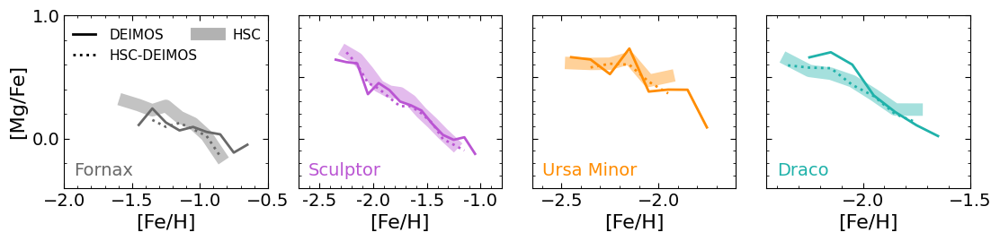

In [611]:
# Figure
fig, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=4, figsize=(13, 2.5), gridspec_kw={'wspace': 0.15})

axes = [ax0, ax1, ax2, ax3]
galaxies = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
deimos_datasets = [
    (fnx_mag['FEH'], fnx_mag['MGFE']),
    (scl_mag['FEH'], scl_mag['MGFE']),
    (umi_mag['FEH'], umi_mag['MGFE']),
    (dra_mag['FEH'], dra_mag['MGFE'])
]
hsc_deimosregion_datasets = [
    (fnx_match['FEH_phot_rfr'], fnx_match['MGFE_phot_rfr']),
    (scl_match['FEH_phot_rfr'], scl_match['MGFE_phot_rfr']),
    (umi_match['FEH_phot_rfr'], umi_match['MGFE_phot_rfr']),
    (dra_match['FEH_phot_rfr'], dra_match['MGFE_phot_rfr'])
]
hsc_datasets = [
    (hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr']),
    (hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr']),
    (hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr']),
    (hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'])
]
colors = ['dimgray', 'mediumorchid', 'darkorange', 'lightseagreen']

for ax, gal_name, deimos, hsc_deimos, hsc, color in zip(axes, galaxies, deimos_datasets, hsc_deimosregion_datasets, hsc_datasets, colors):
    plot_combined_median(ax, [deimos], [color], linestyle='-', alpha=1, lw=2)
    plot_combined_median(ax, [hsc_deimos], [color], linestyle=':', alpha=1, lw=2)
    plot_combined_median(ax, [hsc], [color], linestyle='-', alpha=0.4, lw=10)

    ax.set_xlim(-2.7, -0.5)
    ax.set_ylim(-0.4, 1.0)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax.tick_params(axis='both', which='major', direction='in', right=True, top=True, length=4, labelsize=14)
    ax.tick_params(axis='both', which='minor', direction='in', right=True, top=True, length=2)
    ax.set_yticks([-0, 0.5, 1])
    ax.set_yticklabels(['0.0', '0.5', '1.0'])
    ax.text(0.05, 0.05, gal_name, ha='left', va='bottom', transform=ax.transAxes, size=14, color=color)

ax0.set_ylabel(r'[Mg/Fe]', size=16)
for ax in [ax1, ax2, ax3]:
    ax.set_ylim([-0.4, 1])
    ax.set_ylabel('')
    ax.set_yticklabels([])

for ax in axes:
    ax.set_xlabel(r'[Fe/H]', size=16)

ax0.plot([], [], 'k-', label='DEIMOS', alpha=1, lw=2)
ax0.plot([], [], 'k', label='HSC-DEIMOS', alpha=1, lw=2, linestyle=':')
ax0.plot([], [], 'k-', label='HSC', alpha=0.3, lw=10)
ax0.legend(loc='upper right', handlelength=1.6, alignment='right', handletextpad=1, framealpha=0,
          fontsize=11, bbox_to_anchor=(1.03, 0.995), ncol=2, columnspacing=0)

ax0.set_xlim([-2, -0.5])
ax0.set_ylim([-0.4, 1])
# ax0.set_xticks([-2, -1])
# ax0.set_xticklabels(['-2', '-1'])
ax0.set_yticks([0, 1])
ax0.set_yticklabels(['0.0', '1.0'])

ax1.set_xlim([-2.7, -0.8])
ax1.set_xticks([-2.5, -2, -1.5, -1])
ax1.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])

ax2.set_xlim([-2.65, -1.6])

ax3.set_xlim([-2.45, -1.5])


plt.savefig('compare_rfr_spec_phot_mgfe_feh_hist2d_medianline.png', bbox_inches='tight')

In [612]:
# def get_median_mgfe(feh_values, mgfe_values, bin_width=0.1):
#     bins = np.arange(np.floor(np.min(feh_values) / bin_width) * bin_width, 
#                      np.ceil(np.max(feh_values) / bin_width) * bin_width + bin_width, bin_width)
#     #print(bins) #[-2.2 -2.1 -2. -1.9 -1.8 -1.7 -1.6 -1.5 -1.4 -1.3 -1.2 -1.1 -1. -0.9 -0.8 -0.7 -0.6 -0.5]
    
#     median_mgfe_dict = {}
#     for i in range(len(bins) - 1):
#         mask = (bins[i] <= feh_values) & (feh_values < bins[i + 1])
#         if np.sum(mask) >= 5:  # get median value if there are 5 data at least
#             median_mgfe_dict[(bins[i], bins[i + 1])] = np.median(mgfe_values[mask])
#         else:
#             median_mgfe_dict[(bins[i], bins[i + 1])] = np.nan  # NaN if there are less than 5 stars
    
#     return median_mgfe_dict

# from scipy.optimize import fsolve
# def calculate_err_sys_fsolve(mgfe, fitted_mgfe, err_mgfe, N):
#     def objective(err_sys):
#         numerator = (mgfe - fitted_mgfe)**2
#         denominator = err_mgfe**2 + err_sys**2
#         result = np.sum(numerator / denominator) / N
#         return result - 1
        
#     initial_guess = [0.0001]
    
#     err_sys_solution = fsolve(objective, initial_guess)[0]
#     #print(f"err_sys_solution: {err_sys_solution:.6f}")
    
#     return err_sys_solution

# from scipy.optimize import minimize
# def calculate_err_sys_minimize(mgfe, fitted_mgfe, err_mgfe, N):
#     def objective(err_sys):
#         numerator = (mgfe - fitted_mgfe)**2
#         denominator = err_mgfe**2 + err_sys[0]**2
#         result = np.sum(numerator / denominator) / N
#         #print(f"numerator: {numerator}, denominator: {denominator}, result: {result}")

#         return (result - 1)**2  #minimize

#     initial_guess = [0.1]
#     bounds = [(0, None)]
    
#     result = minimize(objective, x0=initial_guess, bounds=bounds)
    
#     err_sys_solution = result.x[0]
#     #print(f"err_sys_solution: {err_sys_solution:.6f}")

#     return err_sys_solution

In [613]:
# # Get median MGFE value per FEH 0.1 bin
# median_mgfe_bins = get_median_mgfe(fnx_mag['FEH'], fnx_mag['MGFE'])
# # Assign the median MGFE value of the corresponding FEH bin as the predicted value for each data point.
# predicted_fnx_MGFE = np.array([median_mgfe_bins.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins if b1 <= feh < b2), None), np.nan) for feh in fnx_mag['FEH']])
# sys_err_fnx = calculate_err_sys_fsolve(fnx_mag['MGFE'], predicted_fnx_MGFE, fnx_mag['MGFEERR'], len(fnx_mag['MGFE']))
# # print('sys_err_fnx =', sys_err_fnx)
# median_mgfe_bins_hsc = get_median_mgfe(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'])
# predicted_hsc_fnx_MGFE = np.array([median_mgfe_bins_hsc.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins_hsc if b1 <= feh < b2), None), np.nan) for feh in hsc_fnx_mag['FEH_phot_rfr']])
# sys_err_hsc_fnx = calculate_err_sys_minimize(hsc_fnx_mag['MGFE_phot_rfr'], predicted_hsc_fnx_MGFE, hsc_fnx_mag['MGFE_phot_rfr_err'], len(hsc_fnx_mag['MGFE_phot_rfr']))

# median_mgfe_bins = get_median_mgfe(scl_mag['FEH'], scl_mag['MGFE'])
# predicted_scl_MGFE = np.array([median_mgfe_bins.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins if b1 <= feh < b2), None), np.nan) for feh in scl_mag['FEH']])
# sys_err_scl = calculate_err_sys_fsolve(scl_mag['MGFE'], predicted_scl_MGFE, scl_mag['MGFEERR'], len(scl_mag['MGFE']))
# # print('sys_err_scl =', sys_err_scl)
# median_mgfe_bins_hsc = get_median_mgfe(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'])
# predicted_hsc_scl_MGFE = np.array([median_mgfe_bins_hsc.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins_hsc if b1 <= feh < b2), None), np.nan) for feh in hsc_scl_mag['FEH_phot_rfr']])
# sys_err_hsc_scl = calculate_err_sys_minimize(hsc_scl_mag['MGFE_phot_rfr'], predicted_hsc_scl_MGFE, hsc_scl_mag['MGFE_phot_rfr_err'], len(hsc_scl_mag['MGFE_phot_rfr']))

# median_mgfe_bins = get_median_mgfe(umi_mag['FEH'], umi_mag['MGFE'])
# predicted_umi_MGFE = np.array([median_mgfe_bins.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins if b1 <= feh < b2), None), np.nan) for feh in umi_mag['FEH']])
# sys_err_umi = calculate_err_sys_fsolve(umi_mag['MGFE'], predicted_umi_MGFE, umi_mag['MGFEERR'], len(umi_mag['MGFE']))
# # print('sys_err_umi =', sys_err_umi)
# median_mgfe_bins_hsc = get_median_mgfe(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'])
# predicted_hsc_umi_MGFE = np.array([median_mgfe_bins_hsc.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins_hsc if b1 <= feh < b2), None), np.nan) for feh in hsc_umi_mag['FEH_phot_rfr']])
# sys_err_hsc_umi = calculate_err_sys_minimize(hsc_umi_mag['MGFE_phot_rfr'], predicted_hsc_umi_MGFE, hsc_umi_mag['MGFE_phot_rfr_err'], len(hsc_umi_mag['MGFE_phot_rfr']))

# median_mgfe_bins = get_median_mgfe(dra_mag['FEH'], dra_mag['MGFE'])
# predicted_dra_MGFE = np.array([median_mgfe_bins.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins if b1 <= feh < b2), None), np.nan) for feh in dra_mag['FEH']])
# sys_err_dra = calculate_err_sys_fsolve(dra_mag['MGFE'], predicted_dra_MGFE, dra_mag['MGFEERR'], len(dra_mag['MGFE']))
# # print('sys_err_dra =', sys_err_dra)
# median_mgfe_bins_hsc = get_median_mgfe(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'])
# predicted_hsc_dra_MGFE = np.array([median_mgfe_bins_hsc.get(next(((b1, b2) for (b1, b2) in median_mgfe_bins_hsc if b1 <= feh < b2), None), np.nan) for feh in hsc_dra_mag['FEH_phot_rfr']])
# sys_err_hsc_dra = calculate_err_sys_minimize(hsc_dra_mag['MGFE_phot_rfr'], predicted_hsc_dra_MGFE, hsc_dra_mag['MGFE_phot_rfr_err'], len(hsc_dra_mag['MGFE_phot_rfr']))

In [614]:
# train_MGFE_oob_rmse_avg = np.sqrt(train_MGH_oob_rmse_avg**2 + train_FEH_oob_rmse_avg**2)

In [615]:
# fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(9, 3), gridspec_kw={'wspace':0.3})
# bins_width = 0.2

# x = (fnx_mag['MGFE'] - predicted_fnx_MGFE) / np.sqrt(fnx_mag['MGFEERR']**2 + rmse_oob_MGFE**2)
# bins = np.arange(np.floor(np.min(x) / bins_width) * bins_width,
#                  np.ceil(np.max(x) / bins_width) * bins_width + bins_width,
#                  bins_width)
# ax0.hist(x, bins=bins, color='k', histtype='step', density=True)
# ax0.set_xlabel(r'([Mg/Fe] - [Mg/Fe]$_\mathrm{fitted}$) / $\sqrt{\delta_\mathrm{[Mg/Fe]}^2 + \sigma_\mathrm{[Mg/Fe]}^2}$', size=13)
# ax0.set_ylabel('Probability Density', size=13)
# ax0.set_xlim([-4.1, 4.1])
# ax0.text(0.12, 0.84, 'DEIMOS', ha='left', va='top', transform=ax0.transAxes, size=12)
# ax0.text(0.09, 0.74, '$\mu$ = {0:,.3f}'.format(np.mean(x)), ha='left', va='top', transform=ax0.transAxes, size=12)
# ax0.text(0.09, 0.64, '$\sigma$ =  {0:,.3f}'.format(np.std(x)), ha='left', va='top', transform=ax0.transAxes, size=12)

# x = (hsc_fnx_mag['MGFE_phot_rfr'] - predicted_hsc_fnx_MGFE) / np.sqrt(hsc_fnx_mag['MGFE_phot_rfr_err']**2 + rmse_oob_MGFE**2)
# bins = np.arange(np.floor(np.min(x) / bins_width) * bins_width,
#                  np.ceil(np.max(x) / bins_width) * bins_width + bins_width,
#                  bins_width)
# ax0.hist(x, bins=bins, histtype='step', color='darkorchid', density=True)
# ax0.text(0.73, 0.85, 'HSC', ha='left', va='top', transform=ax0.transAxes, size=12, color='darkorchid')
# ax0.text(0.66, 0.75, '$\mu$ = {0:,.3f}'.format(np.mean(x)), ha='left', va='top', transform=ax0.transAxes, size=12, color='darkorchid')
# ax0.text(0.66, 0.65, '$\sigma$ =  {0:,.3f}'.format(np.std(x)), ha='left', va='top', transform=ax0.transAxes, size=12, color='darkorchid')
# ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
# ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
# ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=3.5, labelsize=12)
# ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=3, labelsize=12)
# ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=3.5, labelsize=12)
# ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=3, labelsize=12)

# plt.savefig('mgfe_DEIMOS_HSC_sigma_distribution.png', bbox_inches='tight')

# CCD and CMD comparison - simple version

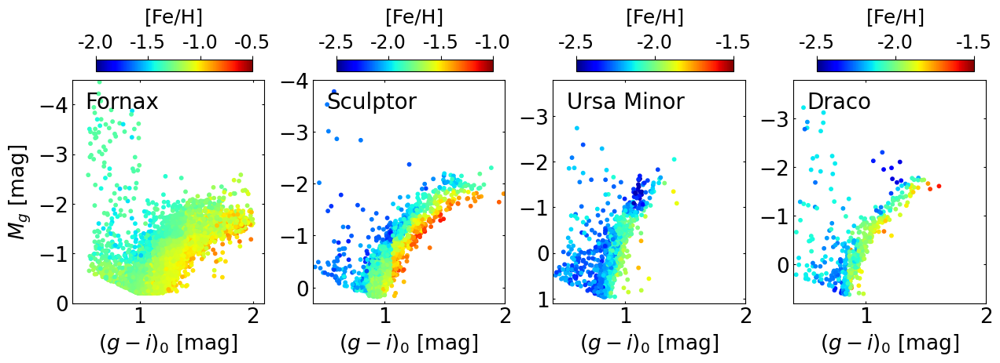

In [616]:
fig, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=4, figsize=(15,3.7), gridspec_kw={'wspace':0.25})
s = 10 ; alpha = 1

# Fornax
ymin, ymax = -4.5, 0
vmin, vmax = -2.0, -0.5
im = ax0.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['i0'], hsc_fnx_mag['Mg0'], marker='o', s=s, c=hsc_fnx_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([0.4, 2.1])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('$(g - i)_{0}$ [mag]', size=19)
ax0.set_ylabel('$M_{g}$ [mag]', size=19)
#g0_max = -0.20
#ax0.axhline(g0_max, 0, 1, color='k')
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.04])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.0, -1.5, -1.0, -0.5])
cbar.ax.set_xticklabels(['-2.0', '-1.5', '-1.0', '-0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

# Sculptor
ymin, ymax = -4, 0.3
vmin, vmax = -2.5, -1.0
im = ax1.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['i0'], hsc_scl_mag['Mg0'], marker='o', s=s, c=hsc_scl_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([0.4, 2])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('$(g - i)_{0}$ [mag]', size=19)
ax1.set_ylabel('')
#g0_max = 0.18
#ax1.axhline(g0_max, 0, 1, color='k')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.04])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

# Ursa Minor
ymin, ymax = -3.8, 1.1
vmin, vmax = -2.5, -1.5
im = ax2.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['i0'], hsc_umi_mag['Mg0'], marker='o', s=s, c=hsc_umi_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([0.4, 2])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('$(g - i)_{0}$ [mag]', size=19)
ax2.set_ylabel('')
#g0_max = 1.00
#ax2.axhline(g0_max, 0, 1, color='k')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.04])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

# Draco
ymin, ymax = -3.8, 0.8
vmin, vmax = -2.5, -1.5
im = ax3.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['i0'], hsc_dra_mag['Mg0'], marker='o', s=s, c=hsc_dra_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([0.4, 2])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('$(g - i)_{0}$ [mag]', size=19)
ax3.set_ylabel('')
#g0_max = 0.65
#ax3.axhline(g0_max, 0, 1, color='k')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.04])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

plt.savefig('cmd_hsc_feh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

# CCD and CMD comparison - all

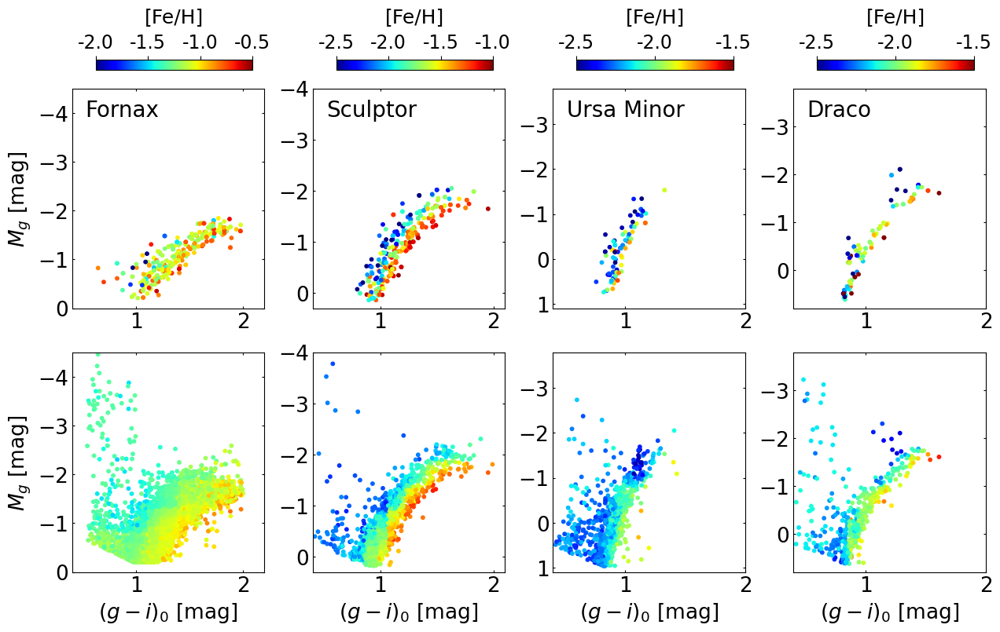

In [617]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(15,8), gridspec_kw={'wspace':0.25, 'hspace':0.2})
s = 10 ; alpha = 1

# Fornax
ymin, ymax = -4.5, 0
vmin, vmax = -2, -0.5
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['i0'], fnx_mag['Mg0'], marker='o', s=s, c=fnx_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([0.4, 2.2])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$M_g$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.0, -1.5, -1.0, -0.5])
cbar.ax.set_xticklabels(['-2.0', '-1.5', '-1.0', '-0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['i0'], hsc_fnx_mag['Mg0'], marker='o', s=s, c=hsc_fnx_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([0.4, 2.2])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax4.set_ylabel('$M_g$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
ymin, ymax = -4, 0.3
vmin, vmax = -2.5, -1.0
im = ax1.scatter(scl_mag['g0'] - scl_mag['i0'], scl_mag['Mg0'], marker='o', s=s, c=scl_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([0.4, 2.1])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['i0'], hsc_scl_mag['Mg0'], marker='o', s=s, c=hsc_scl_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([0.4, 2.1])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
ymin, ymax = -3.8, 1.1
vmin, vmax = -2.5, -1.5
im = ax2.scatter(umi_mag['g0'] - umi_mag['i0'], umi_mag['Mg0'], marker='o', s=s, c=umi_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([0.4, 2])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['i0'], hsc_umi_mag['Mg0'], marker='o', s=s, c=hsc_umi_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([0.4, 2])
ax6.set_ylim([ymax, ymin])
ax6.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
ymin, ymax = -3.8, 0.8
vmin, vmax = -2.5, -1.5
im = ax3.scatter(dra_mag['g0'] - dra_mag['i0'], dra_mag['Mg0'], marker='o', s=s, c=dra_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([0.4, 2])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['i0'], hsc_dra_mag['Mg0'], marker='o', s=s, c=hsc_dra_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([0.4, 2])
ax7.set_ylim([ymax, ymin])
ax7.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('cmd_gi_deimos_hsc_feh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

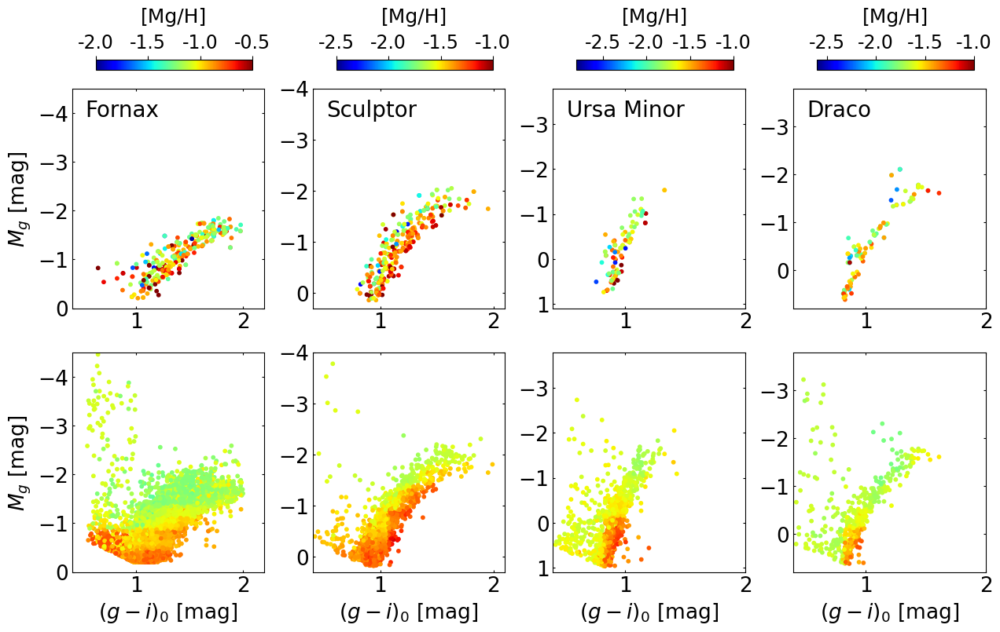

In [618]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(15,8), gridspec_kw={'wspace':0.25, 'hspace':0.2})
s = 10 ; alpha = 1

# Fornax
ymin, ymax = -4.5, 0
vmin, vmax = -2.0, -0.5
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['i0'], fnx_mag['Mg0'], marker='o', s=s, c=fnx_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([0.4, 2.2])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$M_g$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.0, -1.5, -1.0, -0.5])
cbar.ax.set_xticklabels(['-2.0', '-1.5', '-1.0', '-0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['i0'], hsc_fnx_mag['Mg0'], marker='o', s=s, c=hsc_fnx_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([0.4, 2.2])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax4.set_ylabel('$M_g$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
ymin, ymax = -4, 0.3
vmin, vmax = -2.5, -1.0
im = ax1.scatter(scl_mag['g0'] - scl_mag['i0'], scl_mag['Mg0'], marker='o', s=s, c=scl_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([0.4, 2.1])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['i0'], hsc_scl_mag['Mg0'], marker='o', s=s, c=hsc_scl_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([0.4, 2.1])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
ymin, ymax = -3.8, 1.1
vmin, vmax = -2.8, -1.0
im = ax2.scatter(umi_mag['g0'] - umi_mag['i0'], umi_mag['Mg0'], marker='o', s=s, c=umi_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([0.4, 2])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['i0'], hsc_umi_mag['Mg0'], marker='o', s=s, c=hsc_umi_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([0.4, 2])
ax6.set_ylim([ymax, ymin])
ax6.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
ymin, ymax = -3.8, 0.8
vmin, vmax = -2.6, -1.0
im = ax3.scatter(dra_mag['g0'] - dra_mag['i0'], dra_mag['Mg0'], marker='o', s=s, c=dra_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([0.4, 2])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['i0'], hsc_dra_mag['Mg0'], marker='o', s=s, c=hsc_dra_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([0.4, 2])
ax7.set_ylim([ymax, ymin])
ax7.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('cmd_gi_deimos_hsc_mgh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

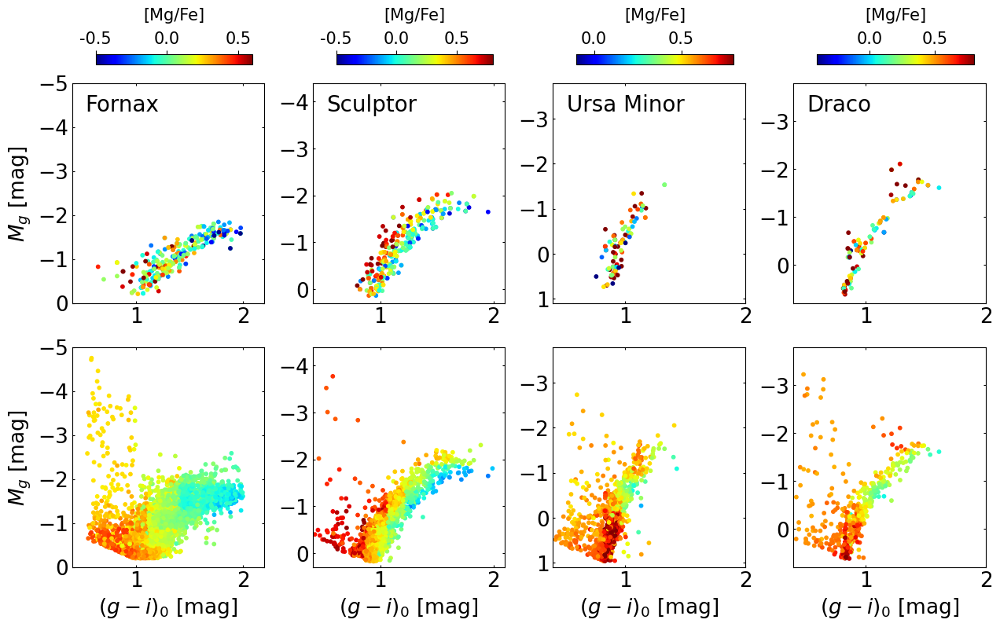

In [619]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(15,8), gridspec_kw={'wspace':0.25, 'hspace':0.2})
s = 10 ; alpha = 1

# Fornax
ymin, ymax = -5, 0
vmin, vmax = -0.5, 0.6
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['i0'], fnx_mag['Mg0'], marker='o', s=s, c=fnx_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([0.4, 2.2])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$M_g$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.5, 0.0, 0.5])
cbar.ax.set_xticklabels(['-0.5', '0.0', '0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['i0'], hsc_fnx_mag['Mg0'], marker='o', s=s, c=hsc_fnx_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([0.4, 2.2])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax4.set_ylabel('$M_g$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
ymin, ymax = -4.4, 0.3
vmin, vmax = -0.5, 0.8
im = ax1.scatter(scl_mag['g0'] - scl_mag['i0'], scl_mag['Mg0'], marker='o', s=s, c=scl_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([0.4, 2.1])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.5, 0.0, 0.5])
cbar.ax.set_xticklabels(['-0.5', '0.0', '0.5'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['i0'], hsc_scl_mag['Mg0'], marker='o', s=s, c=hsc_scl_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([0.4, 2.1])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
ymin, ymax = -3.8, 1.1
vmin, vmax = -0.1, 0.8
im = ax2.scatter(umi_mag['g0'] - umi_mag['i0'], umi_mag['Mg0'], marker='o', s=s, c=umi_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([0.4, 2])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([0.0, 0.5])
cbar.ax.set_xticklabels(['0.0', '0.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['i0'], hsc_umi_mag['Mg0'], marker='o', s=s, c=hsc_umi_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([0.4, 2])
ax6.set_ylim([ymax, ymin])
ax6.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
ymin, ymax = -3.8, 0.8
vmin, vmax = -0.4, 0.8
im = ax3.scatter(dra_mag['g0'] - dra_mag['i0'], dra_mag['Mg0'], marker='o', s=s, c=dra_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([0.4, 2])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([0.0, 0.5])
cbar.ax.set_xticklabels(['0.0', '0.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['i0'], hsc_dra_mag['Mg0'], marker='o', s=s, c=hsc_dra_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([0.4, 2])
ax7.set_ylim([ymax, ymin])
ax7.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('cmd_gi_deimos_hsc_mgfe_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

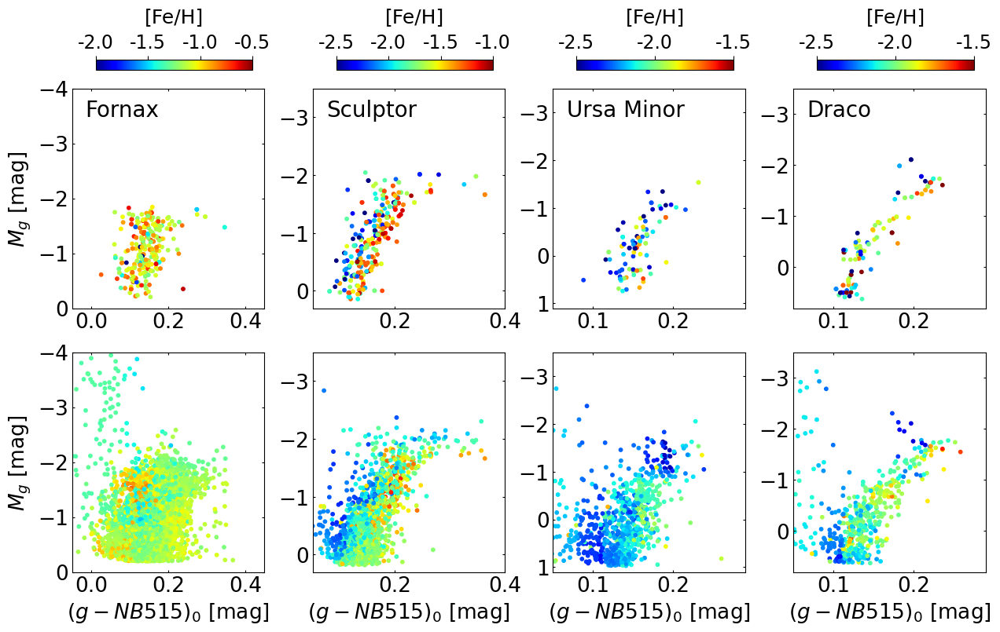

In [620]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(15,8), gridspec_kw={'wspace':0.25, 'hspace':0.2})
s = 10 ; alpha = 1

# Fornax
ymin, ymax = -4, 0
vmin, vmax = -2, -0.5
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['n0'], fnx_mag['Mg0'], marker='o', s=s, c=fnx_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([-0.05, 0.45])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$M_g$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.0, -1.5, -1.0, -0.5])
cbar.ax.set_xticklabels(['-2.0', '-1.5', '-1.0', '-0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['n0'], hsc_fnx_mag['Mg0'], marker='o', s=s, c=hsc_fnx_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([-0.05, 0.45])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax4.set_ylabel('$M_g$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
ymin, ymax = -3.5, 0.3
vmin, vmax = -2.5, -1.0
im = ax1.scatter(scl_mag['g0'] - scl_mag['n0'], scl_mag['Mg0'], marker='o', s=s, c=scl_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([0.05, 0.4])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['n0'], hsc_scl_mag['Mg0'], marker='o', s=s, c=hsc_scl_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([0.05, 0.4])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
ymin, ymax = -3.5, 1.1
vmin, vmax = -2.5, -1.5
im = ax2.scatter(umi_mag['g0'] - umi_mag['n0'], umi_mag['Mg0'], marker='o', s=s, c=umi_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([0.05, 0.29])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['n0'], hsc_umi_mag['Mg0'], marker='o', s=s, c=hsc_umi_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([0.05, 0.29])
ax6.set_ylim([ymax, ymin])
ax6.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
ymin, ymax = -3.5, 0.8
vmin, vmax = -2.5, -1.5
im = ax3.scatter(dra_mag['g0'] - dra_mag['n0'], dra_mag['Mg0'], marker='o', s=s, c=dra_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([0.05, 0.29])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['n0'], hsc_dra_mag['Mg0'], marker='o', s=s, c=hsc_dra_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([0.05, 0.29])
ax7.set_ylim([ymax, ymin])
ax7.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('cmd_gn_deimos_hsc_feh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

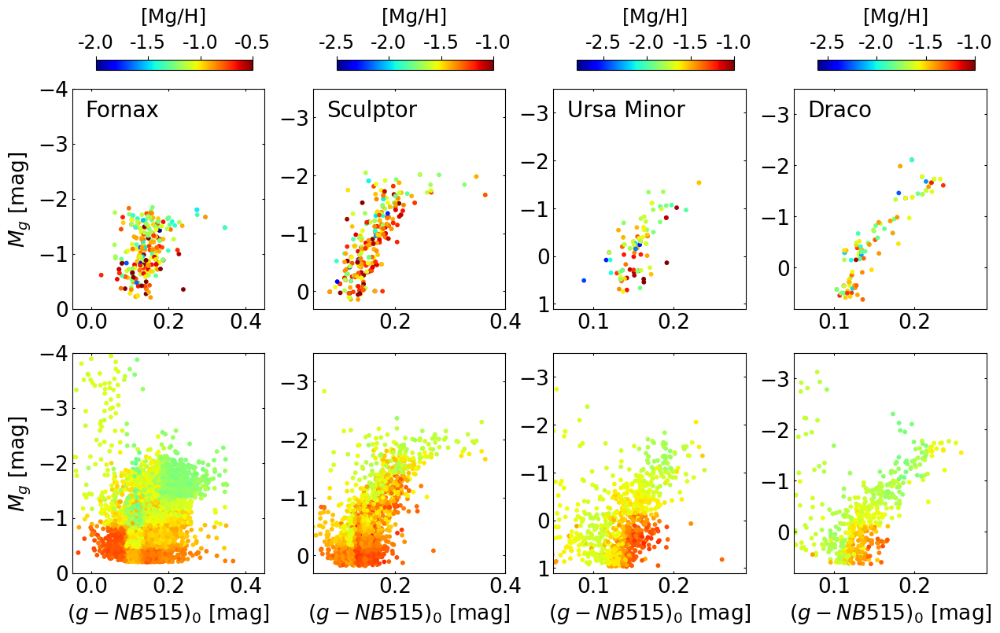

In [621]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(15,8), gridspec_kw={'wspace':0.25, 'hspace':0.2})
s = 10 ; alpha = 1

# Fornax
ymin, ymax = -4, 0
vmin, vmax = -2.0, -0.5
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['n0'], fnx_mag['Mg0'], marker='o', s=s, c=fnx_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([-0.05, 0.45])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$M_g$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.0, -1.5, -1.0, -0.5])
cbar.ax.set_xticklabels(['-2.0', '-1.5', '-1.0', '-0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['n0'], hsc_fnx_mag['Mg0'], marker='o', s=s, c=hsc_fnx_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([-0.05, 0.45])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax4.set_ylabel('$M_g$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
ymin, ymax = -3.5, 0.3
vmin, vmax = -2.5, -1.0
im = ax1.scatter(scl_mag['g0'] - scl_mag['n0'], scl_mag['Mg0'], marker='o', s=s, c=scl_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([0.05, 0.4])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['n0'], hsc_scl_mag['Mg0'], marker='o', s=s, c=hsc_scl_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([0.05, 0.4])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
ymin, ymax = -3.5, 1.1
vmin, vmax = -2.8, -1.0
im = ax2.scatter(umi_mag['g0'] - umi_mag['n0'], umi_mag['Mg0'], marker='o', s=s, c=umi_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([0.05, 0.29])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['n0'], hsc_umi_mag['Mg0'], marker='o', s=s, c=hsc_umi_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([0.05, 0.29])
ax6.set_ylim([ymax, ymin])
ax6.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
ymin, ymax = -3.5, 0.8
vmin, vmax = -2.6, -1.0
im = ax3.scatter(dra_mag['g0'] - dra_mag['n0'], dra_mag['Mg0'], marker='o', s=s, c=dra_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([0.05, 0.29])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['n0'], hsc_dra_mag['Mg0'], marker='o', s=s, c=hsc_dra_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([0.05, 0.29])
ax7.set_ylim([ymax, ymin])
ax7.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('cmd_gn_deimos_hsc_mgh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

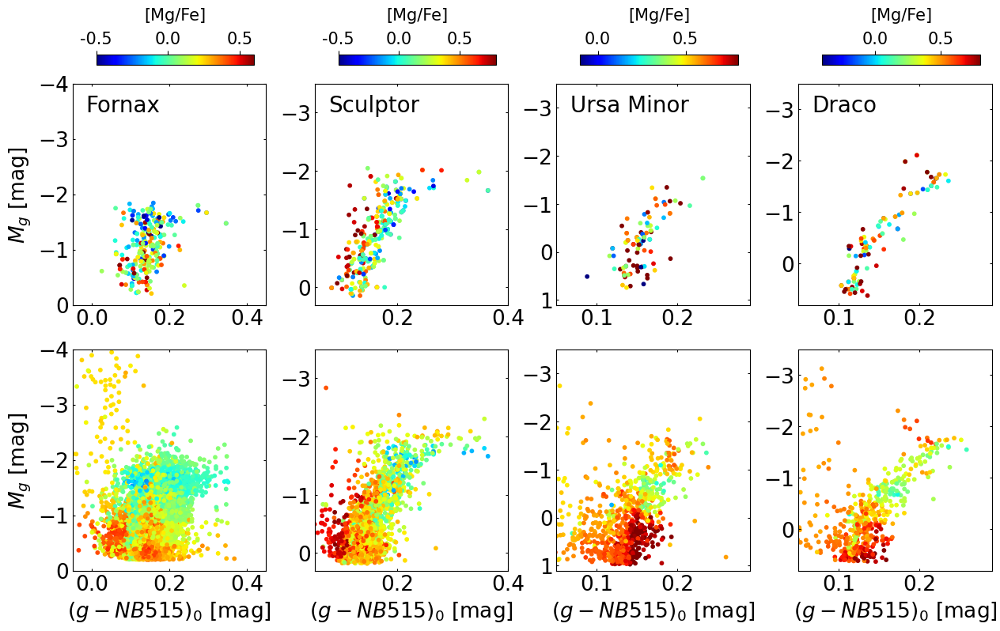

In [622]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(15,8), gridspec_kw={'wspace':0.25, 'hspace':0.2})
s = 10 ; alpha = 1

# Fornax
ymin, ymax = -4, 0
vmin, vmax = -0.5, 0.6
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['n0'], fnx_mag['Mg0'], marker='o', s=s, c=fnx_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([-0.05, 0.45])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$M_g$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.5, 0.0, 0.5])
cbar.ax.set_xticklabels(['-0.5', '0.0', '0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['n0'], hsc_fnx_mag['Mg0'], marker='o', s=s, c=hsc_fnx_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([-0.05, 0.45])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax4.set_ylabel('$M_g$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
ymin, ymax = -3.5, 0.3
vmin, vmax = -0.5, 0.8
im = ax1.scatter(scl_mag['g0'] - scl_mag['n0'], scl_mag['Mg0'], marker='o', s=s, c=scl_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([0.05, 0.4])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.5, 0.0, 0.5])
cbar.ax.set_xticklabels(['-0.5', '0.0', '0.5'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['n0'], hsc_scl_mag['Mg0'], marker='o', s=s, c=hsc_scl_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([0.05, 0.4])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
ymin, ymax = -3.5, 1.1
vmin, vmax = -0.1, 0.8
im = ax2.scatter(umi_mag['g0'] - umi_mag['n0'], umi_mag['Mg0'], marker='o', s=s, c=umi_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([0.05, 0.29])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([0.0, 0.5])
cbar.ax.set_xticklabels(['0.0', '0.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['n0'], hsc_umi_mag['Mg0'], marker='o', s=s, c=hsc_umi_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([0.05, 0.29])
ax6.set_ylim([ymax, ymin])
ax6.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
ymin, ymax = -3.5, 0.8
vmin, vmax = -0.4, 0.8
im = ax3.scatter(dra_mag['g0'] - dra_mag['n0'], dra_mag['Mg0'], marker='o', s=s, c=dra_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([0.05, 0.29])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.016])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=15)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=15, labelpad=10, loc='center')
cbar.ax.set_xticks([0.0, 0.5])
cbar.ax.set_xticklabels(['0.0', '0.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['n0'], hsc_dra_mag['Mg0'], marker='o', s=s, c=hsc_dra_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([0.05, 0.29])
ax7.set_ylim([ymax, ymin])
ax7.set_xlabel('$(g - NB515)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('cmd_gn_deimos_hsc_mgfe_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

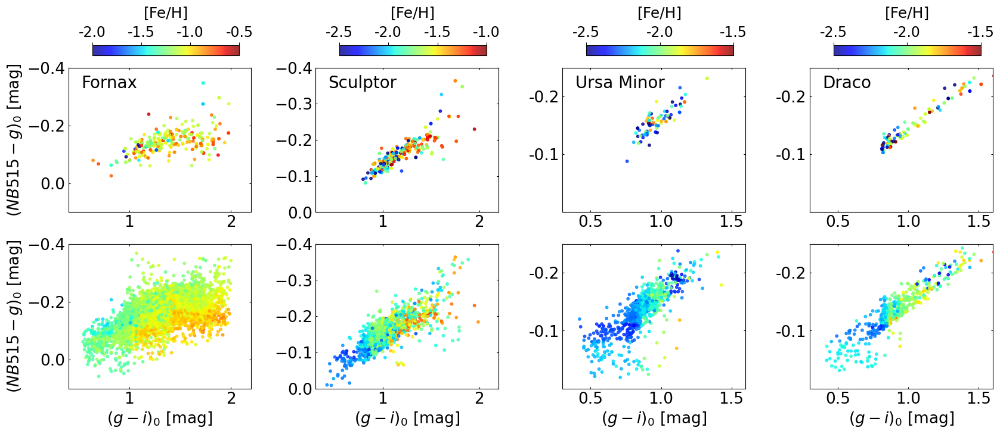

In [662]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(20, 7), gridspec_kw={'wspace':0.35, 'hspace':0.22})
s = 10 ; alpha = 0.8

# Fornax
xmin, xmax = 0.4, 2.2
ymin, ymax = -0.4, 0.1
vmin, vmax = -2, -0.5
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['i0'], fnx_mag['n0'] - fnx_mag['g0'], marker='o', s=s, c=fnx_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$(NB515 - g)_0$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.0, -1.5, -1.0, -0.5])
cbar.ax.set_xticklabels(['-2.0', '-1.5', '-1.0', '-0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['i0'], hsc_fnx_mag['n0'] - hsc_fnx_mag['g0'], marker='o', s=s, c=hsc_fnx_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([xmin, xmax])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax4.set_ylabel('$(NB515 - g)_0$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
xmin, xmax = 0.3, 2.2
ymin, ymax = -0.4, 0
vmin, vmax = -2.5, -1.0
im = ax1.scatter(scl_mag['g0'] - scl_mag['i0'], scl_mag['n0'] - scl_mag['g0'], marker='o', s=s, c=scl_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['i0'], hsc_scl_mag['n0'] - hsc_scl_mag['g0'], marker='o', s=s, c=hsc_scl_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([xmin, xmax])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
xmin, xmax = 0.3, 1.6
ymin, ymax = -0.25, 0
vmin, vmax = -2.5, -1.5
im = ax2.scatter(umi_mag['g0'] - umi_mag['i0'], umi_mag['n0'] - umi_mag['g0'], marker='o', s=s, c=umi_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.set_yticks([-0.1, -0.2])
ax2.set_yticklabels(['-0.1', '-0.2'])
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['i0'], hsc_umi_mag['n0'] - hsc_umi_mag['g0'], marker='o', s=s, c=hsc_umi_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([xmin, xmax])
ax6.set_ylim([ymax, ymin])
ax6.set_yticks([-0.1, -0.2])
ax6.set_yticklabels(['-0.1', '-0.2'])
ax6.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
xmin, xmax = 0.3, 1.6
ymin, ymax = -0.25, 0
vmin, vmax = -2.5, -1.5
im = ax3.scatter(dra_mag['g0'] - dra_mag['i0'], dra_mag['n0'] - dra_mag['g0'], marker='o', s=s, c=dra_mag['FEH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.set_yticks([-0.1, -0.2])
ax3.set_yticklabels(['-0.1', '-0.2'])
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Fe/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['i0'], hsc_dra_mag['n0'] - hsc_dra_mag['g0'], marker='o', s=s, c=hsc_dra_mag['FEH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([xmin, xmax])
ax7.set_ylim([ymax, ymin])
ax7.set_yticks([-0.1, -0.2])
ax7.set_yticklabels(['-0.1', '-0.2'])
ax7.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('ccd_deimos_hsc_feh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

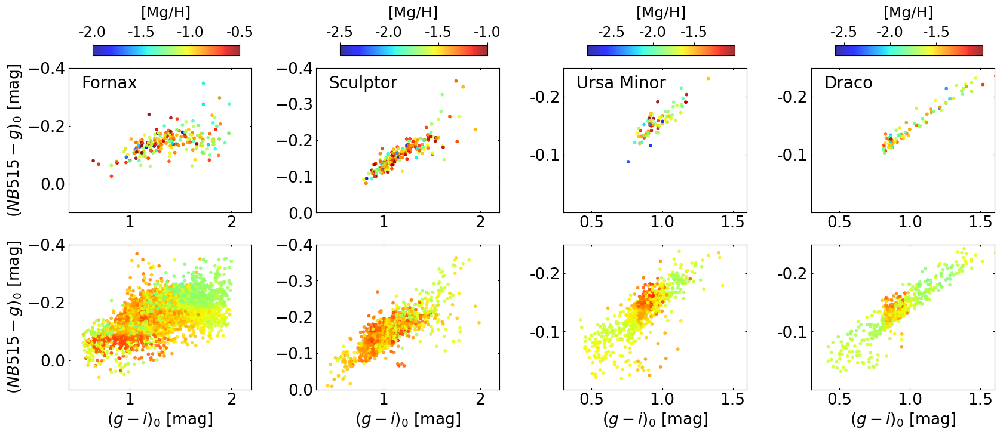

In [663]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(20, 7), gridspec_kw={'wspace':0.35, 'hspace':0.22})
s = 10 ; alpha = 0.8

# Fornax
xmin, xmax = 0.4, 2.2
ymin, ymax = -0.4, 0.1
vmin, vmax = -2.0, -0.5
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['i0'], fnx_mag['n0'] - fnx_mag['g0'], marker='o', s=s, c=fnx_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$(NB515 - g)_0$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.0, -1.5, -1.0, -0.5])
cbar.ax.set_xticklabels(['-2.0', '-1.5', '-1.0', '-0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['i0'], hsc_fnx_mag['n0'] - hsc_fnx_mag['g0'], marker='o', s=s, c=hsc_fnx_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([xmin, xmax])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax4.set_ylabel('$(NB515 - g)_0$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
xmin, xmax = 0.3, 2.2
ymin, ymax = -0.4, 0
vmin, vmax = -2.5, -1.0
im = ax1.scatter(scl_mag['g0'] - scl_mag['i0'], scl_mag['n0'] - scl_mag['g0'], marker='o', s=s, c=scl_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5, -1.0])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5', '-1.0'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['i0'], hsc_scl_mag['n0'] - hsc_scl_mag['g0'], marker='o', s=s, c=hsc_scl_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([xmin, xmax])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
xmin, xmax = 0.3, 1.6
ymin, ymax = -0.25, 0
vmin, vmax = -2.8, -1.0
im = ax2.scatter(umi_mag['g0'] - umi_mag['i0'], umi_mag['n0'] - umi_mag['g0'], marker='o', s=s, c=umi_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.set_yticks([-0.1, -0.2])
ax2.set_yticklabels(['-0.1', '-0.2'])
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['i0'], hsc_umi_mag['n0'] - hsc_umi_mag['g0'], marker='o', s=s, c=hsc_umi_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([xmin, xmax])
ax6.set_ylim([ymax, ymin])
ax6.set_yticks([-0.1, -0.2])
ax6.set_yticklabels(['-0.1', '-0.2'])
ax6.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
xmin, xmax = 0.3, 1.6
ymin, ymax = -0.25, 0
vmin, vmax = -2.6, -1.0
im = ax3.scatter(dra_mag['g0'] - dra_mag['i0'], dra_mag['n0'] - dra_mag['g0'], marker='o', s=s, c=dra_mag['MGH'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.set_yticks([-0.1, -0.2])
ax3.set_yticklabels(['-0.1', '-0.2'])
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/H]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-2.5, -2.0, -1.5])
cbar.ax.set_xticklabels(['-2.5', '-2.0', '-1.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['i0'], hsc_dra_mag['n0'] - hsc_dra_mag['g0'], marker='o', s=s, c=hsc_dra_mag['MGH_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([xmin, xmax])
ax7.set_ylim([ymax, ymin])
ax7.set_yticks([-0.1, -0.2])
ax7.set_yticklabels(['-0.1', '-0.2'])
ax7.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('ccd_deimos_hsc_mgh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

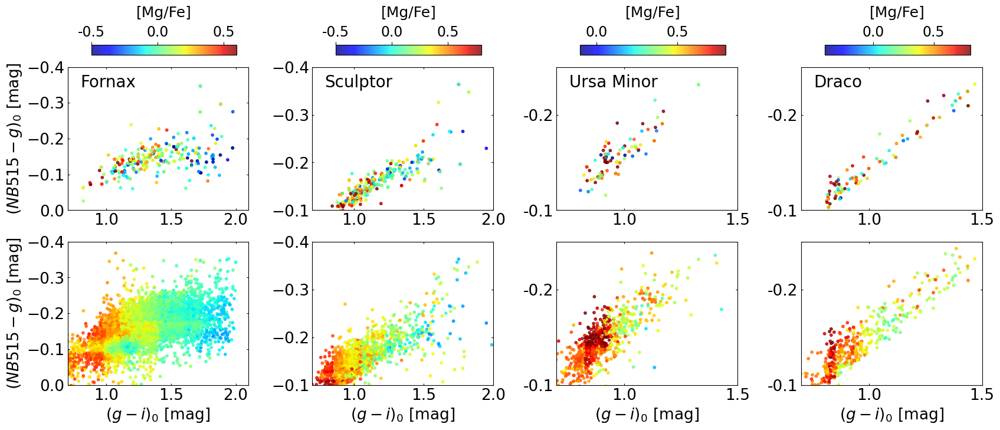

In [625]:
fig, ((ax0, ax1, ax2, ax3), (ax4, ax5, ax6, ax7)) = plt.subplots(nrows=2, ncols=4, figsize=(20, 7), gridspec_kw={'wspace':0.35, 'hspace':0.22})
s = 10 ; alpha = 0.8

# Fornax
xmin, xmax = 0.4, 2.2
ymin, ymax = -0.4, 0.1
vmin, vmax = -0.5, 0.6
im = ax0.scatter(fnx_mag['g0'] - fnx_mag['i0'], fnx_mag['n0'] - fnx_mag['g0'], marker='o', s=s, c=fnx_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([ymax, ymin])
ax0.set_xlabel('')
ax0.set_ylabel('$(NB515 - g)_0$ [mag]', size=19)
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.03, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.5, 0.0, 0.5])
cbar.ax.set_xticklabels(['-0.5', '0.0', '0.5'])
ax0.text(0.07, 0.95, 'Fornax', ha='left', va='top', transform=ax0.transAxes, size=20)

ax4.scatter(hsc_fnx_mag['g0'] - hsc_fnx_mag['i0'], hsc_fnx_mag['n0'] - hsc_fnx_mag['g0'], marker='o', s=s, c=hsc_fnx_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax4.set_xlim([xmin, xmax])
ax4.set_ylim([ymax, ymin])
ax4.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax4.set_ylabel('$(NB515 - g)_0$ [mag]', size=19)
ax4.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax4.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax4.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Sculptor
xmin, xmax = 0.3, 2.2
ymin, ymax = -0.4, 0
vmin, vmax = -0.5, 0.8
im = ax1.scatter(scl_mag['g0'] - scl_mag['i0'], scl_mag['n0'] - scl_mag['g0'], marker='o', s=s, c=scl_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([ymax, ymin])
ax1.set_xlabel('')
ax1.set_ylabel('')
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.03, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.5, 0.0, 0.5])
cbar.ax.set_xticklabels(['-0.5', '0.0', '0.5'])
ax1.text(0.07, 0.95, 'Sculptor', ha='left', va='top', transform=ax1.transAxes, size=20)

ax5.scatter(hsc_scl_mag['g0'] - hsc_scl_mag['i0'], hsc_scl_mag['n0'] - hsc_scl_mag['g0'], marker='o', s=s, c=hsc_scl_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax5.set_xlim([xmin, xmax])
ax5.set_ylim([ymax, ymin])
ax5.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax5.set_ylabel('')
ax5.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax5.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax5.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Ursa Minor
xmin, xmax = 0.3, 1.6
ymin, ymax = -0.25, 0
vmin, vmax = -0.1, 0.8
im = ax2.scatter(umi_mag['g0'] - umi_mag['i0'], umi_mag['n0'] - umi_mag['g0'], marker='o', s=s, c=umi_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([ymax, ymin])
ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax2.set_yticks([-0.1, -0.2])
ax2.set_yticklabels(['-0.1', '-0.2'])
cax = fig.add_axes([ax2.get_position().x0+0.02, ax2.get_position().y1+0.03, ax2.get_position().x1-ax2.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([0.0, 0.5])
cbar.ax.set_xticklabels(['0.0', '0.5'])
ax2.text(0.07, 0.95, 'Ursa Minor', ha='left', va='top', transform=ax2.transAxes, size=20)

ax6.scatter(hsc_umi_mag['g0'] - hsc_umi_mag['i0'], hsc_umi_mag['n0'] - hsc_umi_mag['g0'], marker='o', s=s, c=hsc_umi_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax6.set_xlim([xmin, xmax])
ax6.set_ylim([ymax, ymin])
ax6.set_yticks([-0.1, -0.2])
ax6.set_yticklabels(['-0.1', '-0.2'])
ax6.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax6.set_ylabel('')
ax6.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax6.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax6.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)


# Draco
xmin, xmax = 0.3, 1.6
ymin, ymax = -0.25, 0
vmin, vmax = -0.4, 0.8
im = ax3.scatter(dra_mag['g0'] - dra_mag['i0'], dra_mag['n0'] - dra_mag['g0'], marker='o', s=s, c=dra_mag['MGFE'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([ymax, ymin])
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax3.set_yticks([-0.1, -0.2])
ax3.set_yticklabels(['-0.1', '-0.2'])
cax = fig.add_axes([ax3.get_position().x0+0.02, ax3.get_position().y1+0.03, ax3.get_position().x1-ax3.get_position().x0-0.03, 0.023])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=17)
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('[Mg/Fe]', size=18, labelpad=10, loc='center')
cbar.ax.set_xticks([0.0, 0.5])
cbar.ax.set_xticklabels(['0.0', '0.5'])
ax3.text(0.07, 0.95, 'Draco', ha='left', va='top', transform=ax3.transAxes, size=20)

ax7.scatter(hsc_dra_mag['g0'] - hsc_dra_mag['i0'], hsc_dra_mag['n0'] - hsc_dra_mag['g0'], marker='o', s=s, c=hsc_dra_mag['MGFE_phot_rfr'], cmap='jet', vmin=vmin, vmax=vmax, alpha=alpha)
ax7.set_xlim([xmin, xmax])
ax7.set_ylim([ymax, ymin])
ax7.set_yticks([-0.1, -0.2])
ax7.set_yticklabels(['-0.1', '-0.2'])
ax7.set_xlabel('$(g - i)_0$ [mag]', size=19)
ax7.set_ylabel('')
ax7.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
ax7.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2.5, labelsize=19)
ax7.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

plt.savefig('ccd_deimos_hsc_mgfe_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

# Radia / Spatial distribution

Fornax best fit converged: True
BIC: n_components = 2
Sculptor best fit converged: True
BIC: n_components = 2
Ursa Minor best fit converged: True
BIC: n_components = 3
Draco best fit converged: True
BIC: n_components = 1


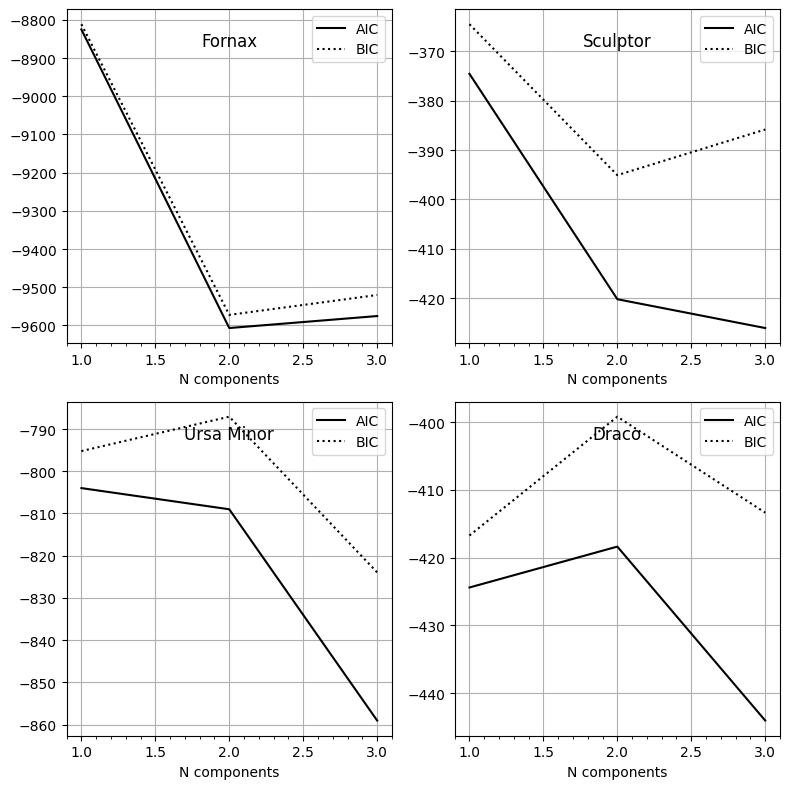

In [65]:
from sklearn.mixture import GaussianMixture

datasets = [hsc_fnx_mag, hsc_scl_mag, hsc_umi_mag, hsc_dra_mag]
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']

# n_components 후보
N = np.arange(1, 4)

def compute_GaussianMixture(X, N, covariance_type='full', max_iter=1000):
    models = []
    for n in N:
        gm = GaussianMixture(n_components=n, max_iter=max_iter, covariance_type=covariance_type)
        gm.fit(X)
        models.append(gm)
    return models

# 2x2 subplot 생성
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
axs = axs.ravel()

# 각 데이터셋에 대해 반복
for ax, ds, label in zip(axs, datasets, labels):
    # X는 (n_samples, 1) shape의 2차원 배열이어야 함
    X = np.array(ds['FEH_phot_rfr']).reshape(-1, 1)
    
    # GaussianMixture 모델 계산
    models = compute_GaussianMixture(X, N)
    AIC = [m.aic(X) for m in models]
    BIC = [m.bic(X) for m in models]
    
    # BIC 기준 최적 모델 선택
    i_best = np.argmin(BIC)
    gmm_best = models[i_best]
    print(f"{label} best fit converged: {gmm_best.converged_}")
    print(f"BIC: n_components = {N[i_best]}")
    
    # AIC/BIC 곡선 플로팅
    ax.plot(N, AIC, '-k', label='AIC')
    ax.plot(N, BIC, ':k', label='BIC')
    ax.legend(loc=1)
    ax.grid()
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.set_xlabel('N components')
    
    # 각 subplot 상단에 데이터셋 이름 텍스트 추가
    ax.text(0.5, 0.93, label, ha='center', va='top', transform=ax.transAxes, size=12)

plt.tight_layout()
plt.show()

Component 0: mean = -1.242, std = 0.094
Component 1: mean = -1.084, std = 0.075
Component 0: mean = -1.634, std = 0.180
Component 1: mean = -1.928, std = 0.157


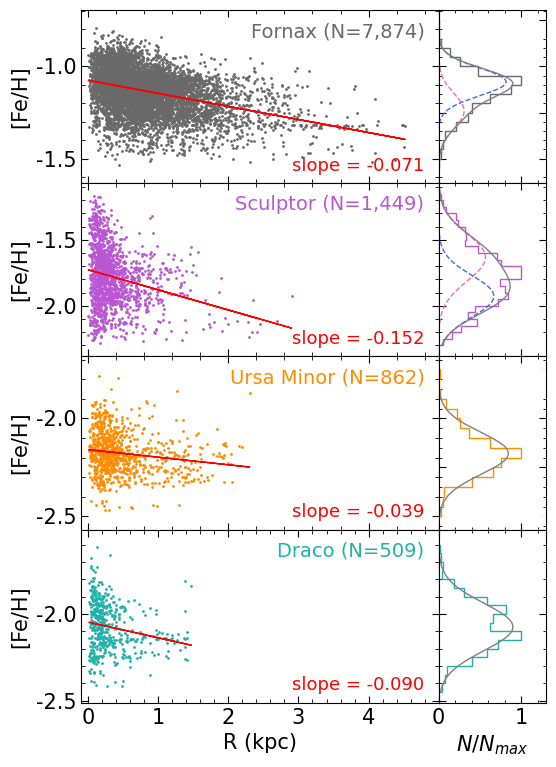

In [626]:
from scipy.stats import linregress, norm
from sklearn.mixture import GaussianMixture

fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(6, 9), gridspec_kw={'wspace': 0, 'hspace': 0, 'width_ratios': [1, 0.3]})

s, bins_width = 1, 0.05
ymin, ymax = 0, 1.3
colors = ['dimgray', 'mediumorchid', 'darkorange', 'lightseagreen']

data = [
    (hsc_fnx_mag, 147, 39.9971, -34.4492, -1.8, -0.7),
    (hsc_scl_mag, 86, 15.0392, -33.7092, -2.4, -0.95),
    (hsc_umi_mag, 76, 227.2854, 67.2225, -2, -1.2),
    (hsc_dra_mag, 76, 260.0517, 57.9153, -2, -1.2)
]

#for i, (hsc_mag, rc, ra0, dec0, _, _) in enumerate(data):
for i, (hsc_mag, D, ra0, dec0, _, _) in enumerate(data):
    y_min_dynamic = np.min(hsc_mag['FEH_phot_rfr']) - 0.1
    y_max_dynamic = np.max(hsc_mag['FEH_phot_rfr']) + 0.1

    x_scatter = np.sqrt(((hsc_mag['ra'] - ra0) * np.cos(np.radians(dec0)))**2 + (hsc_mag['dec'] - dec0)**2) * np.pi * D / 180.
    y_scatter = hsc_mag['FEH_phot_rfr']
    
    axs[i, 0].scatter(x_scatter, y_scatter, marker='o', s=s, color=colors[i])
    axs[i, 0].set_ylabel('[Fe/H]', size=15)
    axs[i, 0].set_xlim([-0.1, 5])
    axs[i, 0].set_ylim([y_min_dynamic, y_max_dynamic])
    axs[i, 0].set_xticklabels('')
    axs[i, 0].xaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 0].yaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 0].tick_params(axis='both', which='major', direction='in', 
                            right=True, top=True, length=5, labelsize=15)
    axs[i, 0].tick_params(axis='both', which='minor', direction='in', 
                            right=True, top=True, length=3, labelsize=15)
    if i == 3:
#        axs[i, 0].set_xlabel('$r/r_h$', size=15)
        axs[i, 0].set_xlabel('R (kpc)', size=15)

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x_scatter, y_scatter)
    y_fit = slope * x_scatter + intercept
    axs[i, 0].plot(x_scatter, y_fit, color='red', linewidth=1)
    axs[i, 0].text(0.96, 0.05, f'slope = {slope:.3f}', ha='right', va='bottom', transform=axs[i, 0].transAxes, size=13, color='red')

    # Histogram
    x_hist = hsc_mag['FEH_phot_rfr']
    bins = np.arange(np.floor(np.min(x_hist) / bins_width) * bins_width,
                     np.ceil(np.max(x_hist) / bins_width) * bins_width + bins_width, bins_width)
    counts, _, _ = axs[i, 1].hist(x_hist, bins=bins, orientation='horizontal', 
                                  histtype='step', color='w')
    axs[i, 1].hist(x_hist, bins=bins, weights=np.ones_like(x_hist) / max(counts), 
                   orientation='horizontal', histtype='step', color=colors[i])
    axs[i, 1].set_xlim([ymin, ymax])
    axs[i, 1].set_ylim([y_min_dynamic, y_max_dynamic])
    axs[i, 1].set_xticklabels('')
    axs[i, 1].tick_params(axis='y', labelleft=False)
    axs[i, 1].xaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 1].yaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 1].tick_params(axis='both', which='major', direction='in', 
                            right=True, top=True, length=5, labelsize=15)
    axs[i, 1].tick_params(axis='both', which='minor', direction='in', 
                            right=True, top=True, length=2, labelsize=15)
    if i == 3:
        axs[i, 1].set_xlabel('$N/N_{max}$', size=15)
    
    # GMM fitting to [Fe/H]_phot_rfr
    x_data = np.array(x_hist)
    if i in [0, 1]:
        n_components = 2
        gmm = GaussianMixture(n_components=n_components, covariance_type='full')
        gmm.fit(x_data.reshape(-1, 1))
        xgrid = np.linspace(bins[0], bins[-1], 1000)
        total_curve = np.zeros_like(xgrid)
        gmm_colors = ['hotpink', 'royalblue']
        for comp in range(n_components):
            mean = gmm.means_[comp, 0]
            var = gmm.covariances_[comp, 0, 0]
            std = np.sqrt(var)
            weight = gmm.weights_[comp]
            print(f'Component {comp}: mean = {mean:.3f}, std = {std:.3f}')
            curve = weight * norm.pdf(xgrid, mean, np.sqrt(var)) * len(x_data) * bins_width
            total_curve += curve
            curve_norm = curve / max(counts)
            axs[i, 1].plot(curve_norm, xgrid, color=gmm_colors[comp], linestyle='--', linewidth=1)
        total_curve_norm = total_curve / max(counts)
        axs[i, 1].plot(total_curve_norm, xgrid, color='gray', linestyle='-', linewidth=1)
    else:
        n_components = 1
        gmm = GaussianMixture(n_components=n_components, covariance_type='full')
        gmm.fit(x_data.reshape(-1, 1))
        xgrid = np.linspace(bins[0], bins[-1], 1000)
        mean = gmm.means_[0, 0]
        var = gmm.covariances_[0, 0, 0]
        weight = gmm.weights_[0]
        curve = weight * norm.pdf(xgrid, mean, np.sqrt(var)) * len(x_data) * bins_width
        curve_norm = curve / max(counts)
        axs[i, 1].plot(curve_norm, xgrid, color='gray', linestyle='-', linewidth=1)

axs[0, 0].set_yticks([-1.5, -1.0])
axs[0, 0].set_yticklabels(['-1.5', '-1.0'])
axs[1, 0].set_yticks([-2.0, -1.5])
axs[1, 0].set_yticklabels(['-2.0', '-1.5'])
axs[2, 0].set_yticks([-2.5, -2.0])
axs[2, 0].set_yticklabels(['-2.5', '-2.0'])
axs[3, 0].set_yticks([-2.5, -2.0])
axs[3, 0].set_yticklabels(['-2.5', '-2.0'])

axs[3, 0].set_xticks([0, 1, 2, 3, 4])
axs[3, 0].set_xticklabels(['0', '1', '2', '3', '4'])
axs[3, 1].set_xticks([0, 1])
axs[3, 1].set_xticklabels(['0', '1'])

axs[0, 0].text(0.96, 0.93, f'Fornax (N={len(hsc_fnx_mag):,.0f})', ha='right', va='top', 
               transform=axs[0, 0].transAxes, size=14, color=colors[0])
axs[1, 0].text(0.96, 0.93, f'Sculptor (N={len(hsc_scl_mag):,.0f})', ha='right', va='top', 
               transform=axs[1, 0].transAxes, size=14, color=colors[1])
axs[2, 0].text(0.96, 0.93, f'Ursa Minor (N={len(hsc_umi_mag):,.0f})', ha='right', va='top', 
               transform=axs[2, 0].transAxes, size=14, color=colors[2])
axs[3, 0].text(0.96, 0.93, f'Draco (N={len(hsc_dra_mag):,.0f})', ha='right', va='top', 
               transform=axs[3, 0].transAxes, size=14, color=colors[3])


plt.savefig('feh_spatial_distribution_w_GMM_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

Component 0: mean = -0.908, std = 0.083
Component 1: mean = -1.106, std = 0.092
Component 0: mean = -1.521, std = 0.076
Component 1: mean = -1.333, std = 0.066


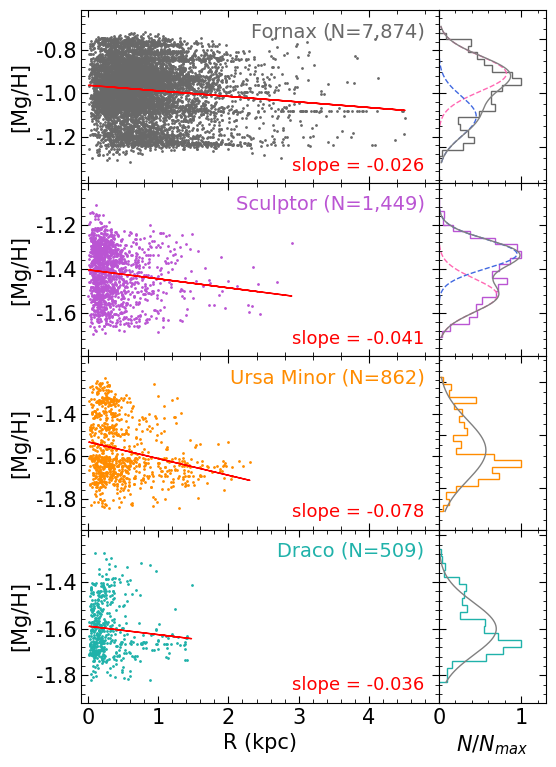

In [627]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import linregress, norm
from sklearn.mixture import GaussianMixture

fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(6, 9), gridspec_kw={'wspace': 0, 'hspace': 0, 'width_ratios': [1, 0.3]})

s, bins_width = 1, 0.03
ymin, ymax = 0, 1.3
colors = ['dimgray', 'mediumorchid', 'darkorange', 'lightseagreen']

data = [
    (hsc_fnx_mag, 147, 39.9971, -34.4492, -1.8, -0.7),
    (hsc_scl_mag, 86, 15.0392, -33.7092, -2.4, -0.95),
    (hsc_umi_mag, 76, 227.2854, 67.2225, -2, -1.2),
    (hsc_dra_mag, 76, 260.0517, 57.9153, -2, -1.2)
]

#for i, (hsc_mag, rc, ra0, dec0, _, _) in enumerate(data):
for i, (hsc_mag, D, ra0, dec0, _, _) in enumerate(data):
    y_min_dynamic = np.min(hsc_mag['MGH_phot_rfr']) - 0.1
    y_max_dynamic = np.max(hsc_mag['MGH_phot_rfr']) + 0.1

#    x_scatter = np.sqrt(((hsc_mag['ra'] - ra0) * np.cos(np.radians(dec0)))**2 + (hsc_mag['dec'] - dec0)**2) * 60 / rc
    x_scatter = np.sqrt(((hsc_mag['ra'] - ra0) * np.cos(np.radians(dec0)))**2 + (hsc_mag['dec'] - dec0)**2) * np.pi * D / 180.
    y_scatter = hsc_mag['MGH_phot_rfr']
    
    axs[i, 0].scatter(x_scatter, y_scatter, marker='o', s=s, color=colors[i])
    axs[i, 0].set_ylabel('[Mg/H]', size=15)
    axs[i, 0].set_xlim([-0.1, 5])
    axs[i, 0].set_ylim([y_min_dynamic, y_max_dynamic])
    axs[i, 0].set_xticklabels('')
    axs[i, 0].xaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 0].yaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 0].tick_params(axis='both', which='major', direction='in', 
                            right=True, top=True, length=5, labelsize=15)
    axs[i, 0].tick_params(axis='both', which='minor', direction='in', 
                            right=True, top=True, length=3, labelsize=15)
    if i == 3:
#        axs[i, 0].set_xlabel('$r/r_h$', size=15)
        axs[i, 0].set_xlabel('R (kpc)', size=15)

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x_scatter, y_scatter)
    y_fit = slope * x_scatter + intercept
    axs[i, 0].plot(x_scatter, y_fit, color='red', linewidth=1)
    axs[i, 0].text(0.96, 0.05, f'slope = {slope:.3f}', ha='right', va='bottom', transform=axs[i, 0].transAxes, size=13, color='red')

    # Histogram
    x_hist = hsc_mag['MGH_phot_rfr']
    bins = np.arange(np.floor(np.min(x_hist) / bins_width) * bins_width,
                     np.ceil(np.max(x_hist) / bins_width) * bins_width + bins_width, bins_width)
    counts, _, _ = axs[i, 1].hist(x_hist, bins=bins, orientation='horizontal', 
                                  histtype='step', color='w')
    axs[i, 1].hist(x_hist, bins=bins, weights=np.ones_like(x_hist) / max(counts), 
                   orientation='horizontal', histtype='step', color=colors[i])
    axs[i, 1].set_xlim([ymin, ymax])
    axs[i, 1].set_ylim([y_min_dynamic, y_max_dynamic])
    axs[i, 1].set_xticklabels('')
    axs[i, 1].tick_params(axis='y', labelleft=False)
    axs[i, 1].xaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 1].yaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 1].tick_params(axis='both', which='major', direction='in', 
                            right=True, top=True, length=5, labelsize=15)
    axs[i, 1].tick_params(axis='both', which='minor', direction='in', 
                            right=True, top=True, length=2, labelsize=15)
    if i == 3:
        axs[i, 1].set_xlabel('$N/N_{max}$', size=15)
    
    # GMM fitting to [Mg/H]_phot_rfr
    x_data = np.array(x_hist)
    if i in [0, 1]:
        n_components = 2
        gmm = GaussianMixture(n_components=n_components, covariance_type='full')
        gmm.fit(x_data.reshape(-1, 1))
        xgrid = np.linspace(bins[0], bins[-1], 1000)
        total_curve = np.zeros_like(xgrid)
        gmm_colors = ['hotpink', 'royalblue']
        for comp in range(n_components):
            mean = gmm.means_[comp, 0]
            var = gmm.covariances_[comp, 0, 0]
            std = np.sqrt(var)
            weight = gmm.weights_[comp]
            print(f'Component {comp}: mean = {mean:.3f}, std = {std:.3f}')
            curve = weight * norm.pdf(xgrid, mean, np.sqrt(var)) * len(x_data) * bins_width
            total_curve += curve
            curve_norm = curve / max(counts)
            axs[i, 1].plot(curve_norm, xgrid, color=gmm_colors[comp], linestyle='--', linewidth=1)
        total_curve_norm = total_curve / max(counts)
        axs[i, 1].plot(total_curve_norm, xgrid, color='gray', linestyle='-', linewidth=1)
    else:
        n_components = 1
        gmm = GaussianMixture(n_components=n_components, covariance_type='full')
        gmm.fit(x_data.reshape(-1, 1))
        xgrid = np.linspace(bins[0], bins[-1], 1000)
        mean = gmm.means_[0, 0]
        var = gmm.covariances_[0, 0, 0]
        weight = gmm.weights_[0]
        curve = weight * norm.pdf(xgrid, mean, np.sqrt(var)) * len(x_data) * bins_width
        curve_norm = curve / max(counts)
        axs[i, 1].plot(curve_norm, xgrid, color='gray', linestyle='-', linewidth=1)

axs[0, 0].set_yticks([-1.2, -1.0, -0.8])
axs[0, 0].set_yticklabels(['-1.2', '-1.0', '-0.8'])
axs[1, 0].set_yticks([-1.6, -1.4, -1.2])
axs[1, 0].set_yticklabels(['-1.6', '-1.4', '-1.2'])
axs[2, 0].set_yticks([-1.8, -1.6, -1.4])
axs[2, 0].set_yticklabels(['-1.8', '-1.6', '-1.4'])
axs[3, 0].set_yticks([-1.8, -1.6, -1.4])
axs[3, 0].set_yticklabels(['-1.8', '-1.6', '-1.4'])

axs[3, 0].set_xticks([0, 1, 2, 3, 4])
axs[3, 0].set_xticklabels(['0', '1', '2', '3', '4'])
axs[3, 1].set_xticks([0, 1])
axs[3, 1].set_xticklabels(['0', '1'])

axs[0, 0].text(0.96, 0.93, f'Fornax (N={len(hsc_fnx_mag):,.0f})', ha='right', va='top', 
               transform=axs[0, 0].transAxes, size=14, color=colors[0])
axs[1, 0].text(0.96, 0.93, f'Sculptor (N={len(hsc_scl_mag):,.0f})', ha='right', va='top', 
               transform=axs[1, 0].transAxes, size=14, color=colors[1])
axs[2, 0].text(0.96, 0.93, f'Ursa Minor (N={len(hsc_umi_mag):,.0f})', ha='right', va='top', 
               transform=axs[2, 0].transAxes, size=14, color=colors[2])
axs[3, 0].text(0.96, 0.93, f'Draco (N={len(hsc_dra_mag):,.0f})', ha='right', va='top', 
               transform=axs[3, 0].transAxes, size=14, color=colors[3])

plt.savefig('mgh_spatial_distribution_w_GMM_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

Component 0: mean = 0.252, std = 0.095
Component 1: mean = 0.051, std = 0.098
Component 0: mean = 0.251, std = 0.167
Component 1: mean = 0.447, std = 0.151


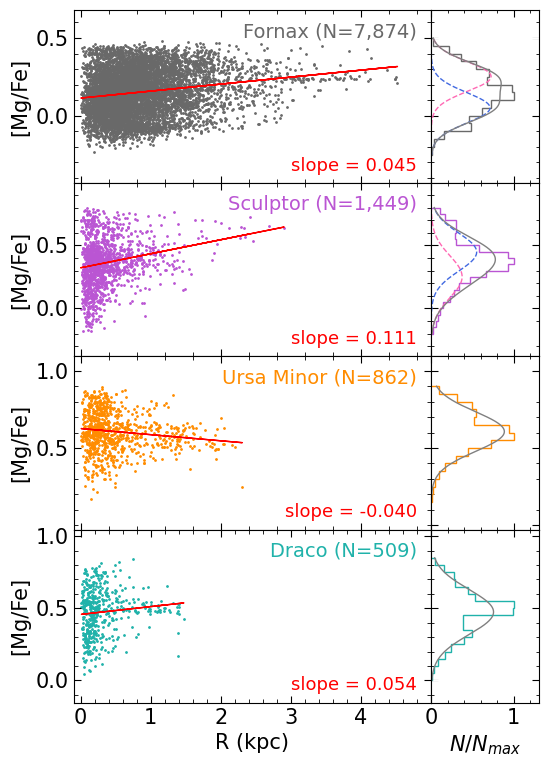

In [628]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import linregress, norm
from sklearn.mixture import GaussianMixture

fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(6, 9), gridspec_kw={'wspace': 0, 'hspace': 0, 'width_ratios': [1, 0.3]})

s, bins_width = 1, 0.05
ymin, ymax = 0, 1.3
colors = ['dimgray', 'mediumorchid', 'darkorange', 'lightseagreen']

data = [
    (hsc_fnx_mag, 147, 39.9971, -34.4492, -1.8, -0.7),
    (hsc_scl_mag, 86, 15.0392, -33.7092, -2.4, -0.95),
    (hsc_umi_mag, 76, 227.2854, 67.2225, -2, -1.2),
    (hsc_dra_mag, 76, 260.0517, 57.9153, -2, -1.2)
]

#for i, (hsc_mag, rc, ra0, dec0, _, _) in enumerate(data):
for i, (hsc_mag, D, ra0, dec0, _, _) in enumerate(data):
    y_min_dynamic = np.min(hsc_mag['MGFE_phot_rfr']) - 0.2
    y_max_dynamic = np.max(hsc_mag['MGFE_phot_rfr']) + 0.2

#    x_scatter = np.sqrt(((hsc_mag['ra'] - ra0) * np.cos(np.radians(dec0)))**2 + (hsc_mag['dec'] - dec0)**2) * 60 / rc
    x_scatter = np.sqrt(((hsc_mag['ra'] - ra0) * np.cos(np.radians(dec0)))**2 + (hsc_mag['dec'] - dec0)**2) * np.pi * D / 180.
    y_scatter = hsc_mag['MGFE_phot_rfr']
    
    axs[i, 0].scatter(x_scatter, y_scatter, marker='o', s=s, color=colors[i])
    axs[i, 0].set_ylabel('[Mg/Fe]', size=15)
    axs[i, 0].set_xlim([-0.1, 5])
    axs[i, 0].set_ylim([y_min_dynamic, y_max_dynamic])
    axs[i, 0].set_xticklabels('')
    axs[i, 0].xaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 0].yaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 0].tick_params(axis='both', which='major', direction='in', 
                            right=True, top=True, length=5, labelsize=15)
    axs[i, 0].tick_params(axis='both', which='minor', direction='in', 
                            right=True, top=True, length=3, labelsize=15)
    if i == 3:
#        axs[i, 0].set_xlabel('$r/r_h$', size=15)
        axs[i, 0].set_xlabel('R (kpc)', size=15)

    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x_scatter, y_scatter)
    y_fit = slope * x_scatter + intercept
    axs[i, 0].plot(x_scatter, y_fit, color='red', linewidth=1)
    axs[i, 0].text(0.96, 0.05, f'slope = {slope:.3f}', ha='right', va='bottom', transform=axs[i, 0].transAxes, size=13, color='red')

    # Histogram
    x_hist = hsc_mag['MGFE_phot_rfr']
    bins = np.arange(np.floor(np.min(x_hist) / bins_width) * bins_width,
                     np.ceil(np.max(x_hist) / bins_width) * bins_width + bins_width, bins_width)
    counts, _, _ = axs[i, 1].hist(x_hist, bins=bins, orientation='horizontal', 
                                  histtype='step', color='w')
    axs[i, 1].hist(x_hist, bins=bins, weights=np.ones_like(x_hist) / max(counts), 
                   orientation='horizontal', histtype='step', color=colors[i])
    axs[i, 1].set_xlim([ymin, ymax])
    axs[i, 1].set_ylim([y_min_dynamic, y_max_dynamic])
    axs[i, 1].set_xticklabels('')
    axs[i, 1].tick_params(axis='y', labelleft=False)
    axs[i, 1].xaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 1].yaxis.set_minor_locator(AutoMinorLocator(5))
    axs[i, 1].tick_params(axis='both', which='major', direction='in', 
                            right=True, top=True, length=5, labelsize=15)
    axs[i, 1].tick_params(axis='both', which='minor', direction='in', 
                            right=True, top=True, length=2, labelsize=15)
    if i == 3:
        axs[i, 1].set_xlabel('$N/N_{max}$', size=15)
    
    # GMM fitting to [Mg/Fe]_phot_rfr
    x_data = np.array(x_hist)
    if i in [0, 1]:
        n_components = 2
        gmm = GaussianMixture(n_components=n_components, covariance_type='full')
        gmm.fit(x_data.reshape(-1, 1))
        xgrid = np.linspace(bins[0], bins[-1], 1000)
        total_curve = np.zeros_like(xgrid)
        gmm_colors = ['hotpink', 'royalblue']
        for comp in range(n_components):
            mean = gmm.means_[comp, 0]
            var = gmm.covariances_[comp, 0, 0]
            std = np.sqrt(var)
            weight = gmm.weights_[comp]
            print(f'Component {comp}: mean = {mean:.3f}, std = {std:.3f}')
            curve = weight * norm.pdf(xgrid, mean, np.sqrt(var)) * len(x_data) * bins_width
            total_curve += curve
            curve_norm = curve / max(counts)
            axs[i, 1].plot(curve_norm, xgrid, color=gmm_colors[comp], linestyle='--', linewidth=1)
        total_curve_norm = total_curve / max(counts)
        axs[i, 1].plot(total_curve_norm, xgrid, color='gray', linestyle='-', linewidth=1)
    else:
        n_components = 1
        gmm = GaussianMixture(n_components=n_components, covariance_type='full')
        gmm.fit(x_data.reshape(-1, 1))
        xgrid = np.linspace(bins[0], bins[-1], 1000)
        mean = gmm.means_[0, 0]
        var = gmm.covariances_[0, 0, 0]
        weight = gmm.weights_[0]
        curve = weight * norm.pdf(xgrid, mean, np.sqrt(var)) * len(x_data) * bins_width
        curve_norm = curve / max(counts)
        axs[i, 1].plot(curve_norm, xgrid, color='gray', linestyle='-', linewidth=1)

axs[0, 0].set_yticks([0, 0.5])
axs[0, 0].set_yticklabels(['0.0', '0.5'])
axs[1, 0].set_yticks([0, 0.5])
axs[1, 0].set_yticklabels(['0.0', '0.5'])
axs[2, 0].set_yticks([0.5, 1.0])
axs[2, 0].set_yticklabels(['0.5', '1.0'])
axs[3, 0].set_yticks([0, 0.5, 1])
axs[3, 0].set_yticklabels(['0.0', '0.5', '1.0'])

axs[3, 0].set_xticks([0, 1, 2, 3, 4])
axs[3, 0].set_xticklabels(['0', '1', '2', '3', '4'])
axs[3, 1].set_xticks([0, 1])
axs[3, 1].set_xticklabels(['0', '1'])

axs[0, 0].text(0.96, 0.93, f'Fornax (N={len(hsc_fnx_mag):,.0f})', ha='right', va='top', 
               transform=axs[0, 0].transAxes, size=14, color=colors[0])
axs[1, 0].text(0.96, 0.93, f'Sculptor (N={len(hsc_scl_mag):,.0f})', ha='right', va='top', 
               transform=axs[1, 0].transAxes, size=14, color=colors[1])
axs[2, 0].text(0.96, 0.93, f'Ursa Minor (N={len(hsc_umi_mag):,.0f})', ha='right', va='top', 
               transform=axs[2, 0].transAxes, size=14, color=colors[2])
axs[3, 0].text(0.96, 0.93, f'Draco (N={len(hsc_dra_mag):,.0f})', ha='right', va='top', 
               transform=axs[3, 0].transAxes, size=14, color=colors[3])

plt.savefig('mgfe_spatial_distribution_w_GMM_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

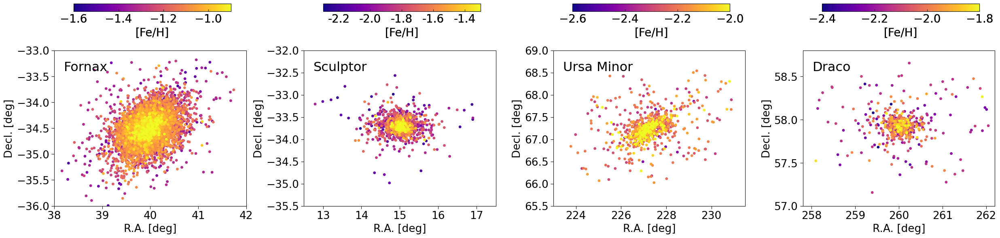

In [629]:
# Left
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(30, 5), gridspec_kw={'wspace':0.3})
s = 15
cmap = 'plasma'
sorted_indices = np.argsort(hsc_fnx_mag['FEH_phot_rfr'])
hsc_fnx_mag_sorted = hsc_fnx_mag.iloc[sorted_indices]
vmin, vmax = -1.6, -0.9
im = axs[0].scatter(hsc_fnx_mag_sorted['ra'], hsc_fnx_mag_sorted['dec'], marker='o', s=s, c=hsc_fnx_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[0].set_xlabel('R.A. [deg]', size=19)
axs[0].set_ylabel('Decl. [deg]', size=19)
axs[0].set_xlim([38, 42])
axs[0].set_ylim([-36, -33])
axs[0].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[0].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[0].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[0].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[0].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Fe/H]', size=20)
axs[0].text(0.05, 0.93, 'Fornax', ha='left', va='top', transform=axs[0].transAxes, size=23)

sorted_indices = np.argsort(hsc_scl_mag['FEH_phot_rfr'])
hsc_scl_mag_sorted = hsc_scl_mag.iloc[sorted_indices]
vmin, vmax = -2.3, -1.3
im = axs[1].scatter(hsc_scl_mag_sorted['ra'], hsc_scl_mag_sorted['dec'], marker='o', s=s, c=hsc_scl_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[1].set_xlabel('R.A. [deg]', size=19)
axs[1].set_ylabel('Decl. [deg]', size=19)
axs[1].set_xlim([12.5, 17.5])
axs[1].set_ylim([-35.5, -32])
axs[1].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[1].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[1].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[1].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[1].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Fe/H]', size=20)
cbar.set_ticks([-2.2, -2.0, -1.8, -1.6, -1.4])
cbar.set_ticklabels(['-2.2', '-2.0', '-1.8', '-1.6', '-1.4'])
axs[1].text(0.05, 0.93, 'Sculptor', ha='left', va='top', transform=axs[1].transAxes, size=23)

sorted_indices = np.argsort(hsc_umi_mag['FEH_phot_rfr'])
hsc_umi_mag_sorted = hsc_umi_mag.iloc[sorted_indices]
vmin, vmax = -2.6, -2.0
im = axs[2].scatter(hsc_umi_mag_sorted['ra'], hsc_umi_mag_sorted['dec'], marker='o', s=s, c=hsc_umi_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[2].set_xlabel('R.A. [deg]', size=19)
axs[2].set_ylabel('Decl. [deg]', size=19)
axs[2].set_xlim([223, 231.5])
axs[2].set_ylim([65.5, 69])
axs[2].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[2].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[2].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[2].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[2].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Fe/H]', size=20)
axs[2].text(0.05, 0.93, 'Ursa Minor', ha='left', va='top', transform=axs[2].transAxes, size=23)

sorted_indices = np.argsort(hsc_dra_mag['FEH_phot_rfr'])
hsc_dra_mag_sorted = hsc_dra_mag.iloc[sorted_indices]
vmin, vmax = -2.4, -1.8
im = axs[3].scatter(hsc_dra_mag_sorted['ra'], hsc_dra_mag_sorted['dec'], marker='o', s=s, c=hsc_dra_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[3].set_xlabel('R.A. [deg]', size=19)
axs[3].set_ylabel('Decl. [deg]', size=19)
axs[3].set_xlim([257.8, 262.2])
axs[3].set_ylim([57, 58.8])
axs[3].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[3].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[3].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[3].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[3].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Fe/H]', size=20)
axs[3].text(0.05, 0.93, 'Draco', ha='left', va='top', transform=axs[3].transAxes, size=23)

plt.savefig('spatial_distribution_feh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

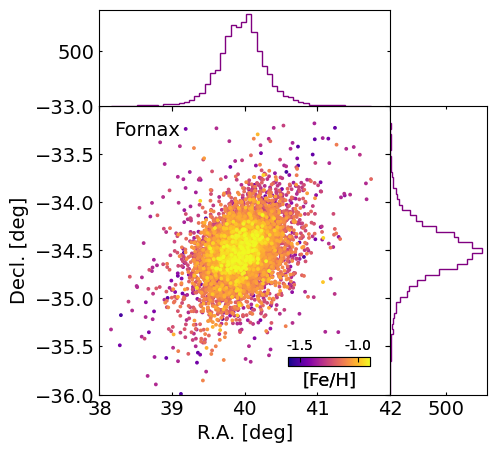

In [630]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(5, 5))
gs = GridSpec(4, 4, figure=fig)
gs.update(wspace=0, hspace=0)
scatter_ax = fig.add_subplot(gs[1:, :-1])
histx_ax = fig.add_subplot(gs[0, :-1], sharex=scatter_ax)
histy_ax = fig.add_subplot(gs[1:, -1], sharey=scatter_ax)

cmap = 'plasma'
vmin, vmax = -1.6, -0.9
xb, yb = 0.05, 0.05

vmin, vmax = -1.6, -0.9
sorted_indices = np.argsort(hsc_fnx_mag['FEH_phot_rfr'])
hsc_fnx_mag_sorted = hsc_fnx_mag.iloc[sorted_indices]
xbins = int((max(hsc_fnx_mag_sorted.ra)-min(hsc_fnx_mag_sorted.ra))/xb) ; ybins = int((max(hsc_fnx_mag_sorted.dec)-min(hsc_fnx_mag_sorted.dec))/yb)
counts, xedges, yedges = np.histogram2d(hsc_fnx_mag_sorted['ra'], hsc_fnx_mag_sorted['dec'], bins=(xbins, ybins))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
#im = scatter_ax.imshow(counts.T, extent=extent, aspect='auto', origin='lower', cmap='jet', norm=LogNorm())
im = scatter_ax.scatter(hsc_fnx_mag_sorted['ra'], hsc_fnx_mag_sorted['dec'], marker='o', s=3, c=hsc_fnx_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
scatter_ax.set_xlabel('R.A. [deg]', size=14)
scatter_ax.set_ylabel('Decl. [deg]', size=14)
scatter_ax.set_xlim([38, 42])
scatter_ax.set_ylim([-36, -33])
scatter_ax.xaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.yaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.text(0.05, 0.95, 'Fornax', ha='left', va='top', transform=scatter_ax.transAxes, size=14)
cax = scatter_ax.inset_axes([0.65, 0.1, 0.28, 0.03])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.ax.tick_params(labelsize=10, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.set_ticks([-1.5, -1.0])
cbar.set_ticklabels(['-1.5', '-1.0'])
cbar.set_label('[Fe/H]', size=13, labelpad=4, loc='center')

histx_ax.hist(hsc_fnx_mag_sorted['ra'], bins=50, histtype='step', color='purple')
#histx_ax.set_ylabel('Numbers', size=14)
histx_ax.tick_params(axis='x', labelbottom=False)
histx_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.set_yticks([500])
histx_ax.set_yticklabels(['500'])

histy_ax.hist(hsc_fnx_mag_sorted['dec'], bins=50, orientation='horizontal', histtype='step', color='purple')
#histy_ax.set_xlabel('Numbers', size=14)
histy_ax.tick_params(axis='y', labelleft=False)
histy_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.set_xticks([500])
histy_ax.set_xticklabels(['500'])

plt.savefig('spatial_distribution_feh_Fornax_w_histo.png', bbox_inches='tight')

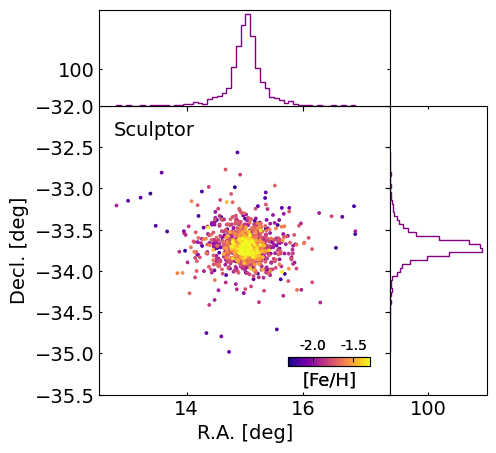

In [631]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(5, 5))
gs = GridSpec(4, 4, figure=fig)
gs.update(wspace=0, hspace=0)
scatter_ax = fig.add_subplot(gs[1:, :-1])
histx_ax = fig.add_subplot(gs[0, :-1], sharex=scatter_ax)
histy_ax = fig.add_subplot(gs[1:, -1], sharey=scatter_ax)

cmap = 'plasma'
vmin, vmax = -1.6, -0.9
xb, yb = 0.05, 0.05

vmin, vmax = -2.3, -1.3
sorted_indices = np.argsort(hsc_scl_mag['FEH_phot_rfr'])
hsc_scl_mag_sorted = hsc_scl_mag.iloc[sorted_indices]
xbins = int((max(hsc_scl_mag_sorted.ra)-min(hsc_scl_mag_sorted.ra))/xb) ; ybins = int((max(hsc_scl_mag_sorted.dec)-min(hsc_scl_mag_sorted.dec))/yb)
counts, xedges, yedges = np.histogram2d(hsc_scl_mag_sorted['ra'], hsc_scl_mag_sorted['dec'], bins=(xbins, ybins))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
#im = scatter_ax.imshow(counts.T, extent=extent, aspect='auto', origin='lower', cmap='jet', norm=LogNorm())
im = scatter_ax.scatter(hsc_scl_mag_sorted['ra'], hsc_scl_mag_sorted['dec'], marker='o', s=3, c=hsc_scl_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
scatter_ax.set_xlabel('R.A. [deg]', size=14)
scatter_ax.set_ylabel('Decl. [deg]', size=14)
scatter_ax.set_xlim([12.5, 17.5])
scatter_ax.set_ylim([-35.5, -32])
scatter_ax.xaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.yaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.text(0.05, 0.95, 'Sculptor', ha='left', va='top', transform=scatter_ax.transAxes, size=14)
cax = scatter_ax.inset_axes([0.65, 0.1, 0.28, 0.03])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.ax.tick_params(labelsize=10, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.set_ticks([-2.0, -1.5])
cbar.set_ticklabels(['-2.0', '-1.5'])
cbar.set_label('[Fe/H]', size=13, labelpad=4, loc='center')

histx_ax.hist(hsc_scl_mag_sorted['ra'], bins=50, histtype='step', color='purple')
#histx_ax.set_ylabel('Numbers', size=14)
histx_ax.tick_params(axis='x', labelbottom=False)
histx_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.set_yticks([100])
histx_ax.set_yticklabels(['100'])

histy_ax.hist(hsc_scl_mag_sorted['dec'], bins=50, orientation='horizontal', histtype='step', color='purple')
#histy_ax.set_xlabel('Numbers', size=14)
histy_ax.tick_params(axis='y', labelleft=False)
histy_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.set_xticks([100])
histy_ax.set_xticklabels(['100'])

plt.savefig('spatial_distribution_feh_Sculptor_w_histo.png', bbox_inches='tight')

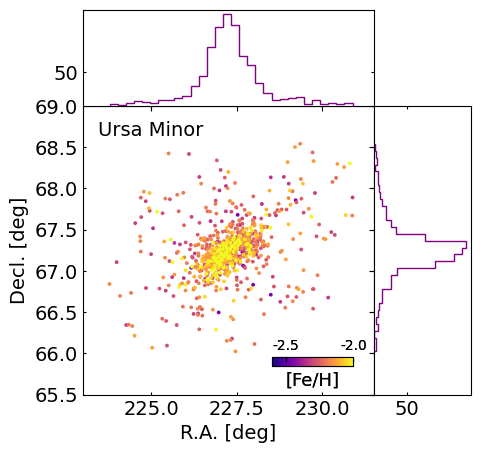

In [632]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(5, 5))
gs = GridSpec(4, 4, figure=fig)
gs.update(wspace=0, hspace=0)
scatter_ax = fig.add_subplot(gs[1:, :-1])
histx_ax = fig.add_subplot(gs[0, :-1], sharex=scatter_ax)
histy_ax = fig.add_subplot(gs[1:, -1], sharey=scatter_ax)

cmap = 'plasma'
vmin, vmax = -1.6, -0.9
xb, yb = 0.05, 0.05

vmin, vmax = -2.6, -2.0
sorted_indices = np.argsort(hsc_umi_mag['FEH_phot_rfr'])
hsc_umi_mag_sorted = hsc_umi_mag.iloc[sorted_indices]
xbins = int((max(hsc_umi_mag_sorted.ra)-min(hsc_umi_mag_sorted.ra))/xb) ; ybins = int((max(hsc_umi_mag_sorted.dec)-min(hsc_umi_mag_sorted.dec))/yb)
counts, xedges, yedges = np.histogram2d(hsc_umi_mag_sorted['ra'], hsc_umi_mag_sorted['dec'], bins=(xbins, ybins))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
#im = scatter_ax.imshow(counts.T, extent=extent, aspect='auto', origin='lower', cmap='jet', norm=LogNorm())
im = scatter_ax.scatter(hsc_umi_mag_sorted['ra'], hsc_umi_mag_sorted['dec'], marker='o', s=3, c=hsc_umi_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
scatter_ax.set_xlabel('R.A. [deg]', size=14)
scatter_ax.set_ylabel('Decl. [deg]', size=14)
scatter_ax.set_xlim([223, 231.5])
scatter_ax.set_ylim([65.5, 69])
scatter_ax.xaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.yaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.text(0.05, 0.95, 'Ursa Minor', ha='left', va='top', transform=scatter_ax.transAxes, size=14)
cax = scatter_ax.inset_axes([0.65, 0.1, 0.28, 0.03])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.ax.tick_params(labelsize=10, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.set_ticks([-2.5, -2.0])
cbar.set_ticklabels(['-2.5', '-2.0'])
cbar.set_label('[Fe/H]', size=13, labelpad=4, loc='center')

histx_ax.hist(hsc_umi_mag_sorted['ra'], bins=30, histtype='step', color='purple')
#histx_ax.set_ylabel('Numbers', size=14)
histx_ax.tick_params(axis='x', labelbottom=False)
histx_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.set_yticks([50])
histx_ax.set_yticklabels(['50'])

histy_ax.hist(hsc_umi_mag_sorted['dec'], bins=30, orientation='horizontal', histtype='step', color='purple')
#histy_ax.set_xlabel('Numbers', size=14)
histy_ax.tick_params(axis='y', labelleft=False)
histy_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.set_xticks([50])
histy_ax.set_xticklabels(['50'])

plt.savefig('spatial_distribution_feh_Ursaminor_w_histo.png', bbox_inches='tight')

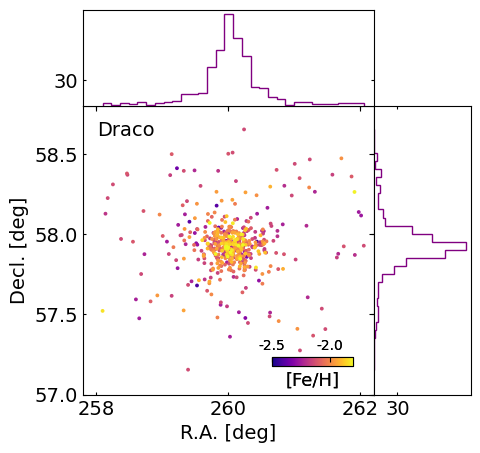

In [633]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(5, 5))
gs = GridSpec(4, 4, figure=fig)
gs.update(wspace=0, hspace=0)
scatter_ax = fig.add_subplot(gs[1:, :-1])
histx_ax = fig.add_subplot(gs[0, :-1], sharex=scatter_ax)
histy_ax = fig.add_subplot(gs[1:, -1], sharey=scatter_ax)

cmap = 'plasma'
vmin, vmax = -1.6, -0.9
xb, yb = 0.05, 0.05

vmin, vmax = -2.5, -1.8
sorted_indices = np.argsort(hsc_dra_mag['FEH_phot_rfr'])
hsc_dra_mag_sorted = hsc_dra_mag.iloc[sorted_indices]
xbins = int((max(hsc_dra_mag_sorted.ra)-min(hsc_dra_mag_sorted.ra))/xb) ; ybins = int((max(hsc_dra_mag_sorted.dec)-min(hsc_dra_mag_sorted.dec))/yb)
counts, xedges, yedges = np.histogram2d(hsc_dra_mag_sorted['ra'], hsc_dra_mag_sorted['dec'], bins=(xbins, ybins))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
#im = scatter_ax.imshow(counts.T, extent=extent, aspect='auto', origin='lower', cmap='jet', norm=LogNorm())
im = scatter_ax.scatter(hsc_dra_mag_sorted['ra'], hsc_dra_mag_sorted['dec'], marker='o', s=3, c=hsc_dra_mag_sorted['FEH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
scatter_ax.set_xlabel('R.A. [deg]', size=14)
scatter_ax.set_ylabel('Decl. [deg]', size=14)
scatter_ax.set_xlim([257.8, 262.2])
scatter_ax.set_ylim([57, 58.8])
scatter_ax.xaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.yaxis.set_minor_locator(AutoMinorLocator(1))
scatter_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
scatter_ax.text(0.05, 0.95, 'Draco', ha='left', va='top', transform=scatter_ax.transAxes, size=14)
cax = scatter_ax.inset_axes([0.65, 0.1, 0.28, 0.03])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.ax.tick_params(labelsize=10, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.set_ticks([-2.5, -2.0])
cbar.set_ticklabels(['-2.5', '-2.0'])
cbar.set_label('[Fe/H]', size=13, labelpad=4, loc='center')

histx_ax.hist(hsc_dra_mag_sorted['ra'], bins=30, histtype='step', color='purple')
#histx_ax.set_ylabel('Numbers', size=14)
histx_ax.tick_params(axis='x', labelbottom=False)
histx_ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histx_ax.set_yticks([30])
histx_ax.set_yticklabels(['30'])

histy_ax.hist(hsc_dra_mag_sorted['dec'], bins=30, orientation='horizontal', histtype='step', color='purple')
#histy_ax.set_xlabel('Numbers', size=14)
histy_ax.tick_params(axis='y', labelleft=False)
histy_ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
histy_ax.set_xticks([30])
histy_ax.set_xticklabels(['30'])

plt.savefig('spatial_distribution_feh_Draco_w_histo.png', bbox_inches='tight')

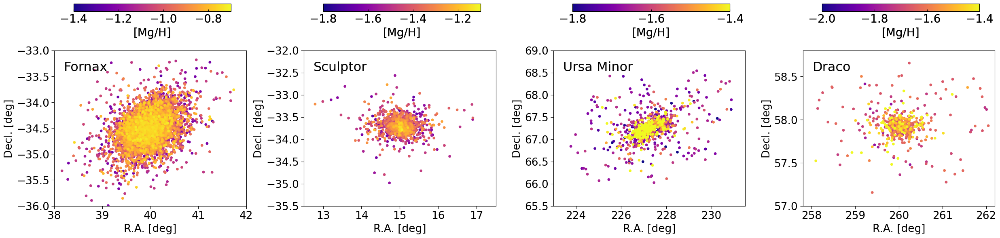

In [634]:
# Left
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(30, 5), gridspec_kw={'wspace':0.3})
s = 15
cmap = 'plasma'
sorted_indices = np.argsort(hsc_fnx_mag['MGH_phot_rfr'])
hsc_fnx_mag_sorted = hsc_fnx_mag.iloc[sorted_indices]
vmin, vmax = -1.4, -0.7
im = axs[0].scatter(hsc_fnx_mag_sorted['ra'], hsc_fnx_mag_sorted['dec'], marker='o', s=s, c=hsc_fnx_mag_sorted['MGH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[0].set_xlabel('R.A. [deg]', size=19)
axs[0].set_ylabel('Decl. [deg]', size=19)
axs[0].set_xlim([38, 42])
axs[0].set_ylim([-36, -33])
axs[0].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[0].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[0].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[0].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[0].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/H]', size=20)
axs[0].text(0.05, 0.93, 'Fornax', ha='left', va='top', transform=axs[0].transAxes, size=23)

sorted_indices = np.argsort(hsc_scl_mag['MGH_phot_rfr'])
hsc_scl_mag_sorted = hsc_scl_mag.iloc[sorted_indices]
vmin, vmax = -1.8, -1.1
im = axs[1].scatter(hsc_scl_mag_sorted['ra'], hsc_scl_mag_sorted['dec'], marker='o', s=s, c=hsc_scl_mag_sorted['MGH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[1].set_xlabel('R.A. [deg]', size=19)
axs[1].set_ylabel('Decl. [deg]', size=19)
axs[1].set_xlim([12.5, 17.5])
axs[1].set_ylim([-35.5, -32])
axs[1].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[1].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[1].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[1].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[1].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/H]', size=20)
#cbar.set_ticks([-2.2, -2.0, -1.8, -1.6, -1.4])
#cbar.set_ticklabels(['-2.2', '-2.0', '-1.8', '-1.6', '-1.4'])
axs[1].text(0.05, 0.93, 'Sculptor', ha='left', va='top', transform=axs[1].transAxes, size=23)

sorted_indices = np.argsort(hsc_umi_mag['MGH_phot_rfr'])
hsc_umi_mag_sorted = hsc_umi_mag.iloc[sorted_indices]
vmin, vmax = -1.8, -1.4
im = axs[2].scatter(hsc_umi_mag_sorted['ra'], hsc_umi_mag_sorted['dec'], marker='o', s=s, c=hsc_umi_mag_sorted['MGH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[2].set_xlabel('R.A. [deg]', size=19)
axs[2].set_ylabel('Decl. [deg]', size=19)
axs[2].set_xlim([223, 231.5])
axs[2].set_ylim([65.5, 69])
axs[2].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[2].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[2].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[2].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[2].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/H]', size=20)
axs[2].text(0.05, 0.93, 'Ursa Minor', ha='left', va='top', transform=axs[2].transAxes, size=23)

sorted_indices = np.argsort(hsc_dra_mag['MGH_phot_rfr'])
hsc_dra_mag_sorted = hsc_dra_mag.iloc[sorted_indices]
vmin, vmax = -2.0, -1.4
im = axs[3].scatter(hsc_dra_mag_sorted['ra'], hsc_dra_mag_sorted['dec'], marker='o', s=s, c=hsc_dra_mag_sorted['MGH_phot_rfr'], cmap=cmap, vmin=vmin, vmax=vmax)
axs[3].set_xlabel('R.A. [deg]', size=19)
axs[3].set_ylabel('Decl. [deg]', size=19)
axs[3].set_xlim([257.8, 262.2])
axs[3].set_ylim([57, 58.8])
axs[3].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[3].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[3].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[3].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[3].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/H]', size=20)
axs[3].text(0.05, 0.93, 'Draco', ha='left', va='top', transform=axs[3].transAxes, size=23)

plt.savefig('spatial_distribution_mgh_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')

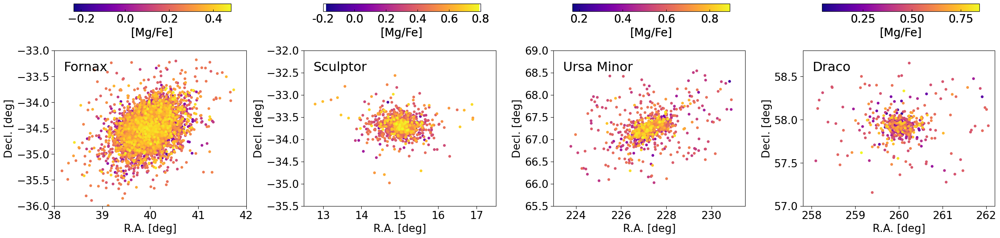

In [635]:
# Left
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(30, 5), gridspec_kw={'wspace':0.3})
s = 15
cmap = 'plasma'
sorted_indices = np.argsort(hsc_fnx_mag['MGFE_phot_rfr'])
hsc_fnx_mag_sorted = hsc_fnx_mag.iloc[sorted_indices]
vmin, vmax = -0.4, 0.4
im = axs[0].scatter(hsc_fnx_mag_sorted['ra'], hsc_fnx_mag_sorted['dec'], marker='o', s=s, c=hsc_fnx_mag_sorted['MGFE_phot_rfr'], cmap=cmap)#, vmin=vmin, vmax=vmax)
axs[0].set_xlabel('R.A. [deg]', size=19)
axs[0].set_ylabel('Decl. [deg]', size=19)
axs[0].set_xlim([38, 42])
axs[0].set_ylim([-36, -33])
axs[0].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[0].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[0].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[0].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[0].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/Fe]', size=20)
axs[0].text(0.05, 0.93, 'Fornax', ha='left', va='top', transform=axs[0].transAxes, size=23)

sorted_indices = np.argsort(hsc_scl_mag['MGFE_phot_rfr'])
hsc_scl_mag_sorted = hsc_scl_mag.iloc[sorted_indices]
vmin, vmax = -0.3, 0.8
im = axs[1].scatter(hsc_scl_mag_sorted['ra'], hsc_scl_mag_sorted['dec'], marker='o', s=s, c=hsc_scl_mag_sorted['MGFE_phot_rfr'], cmap=cmap)#, vmin=vmin, vmax=vmax)
axs[1].set_xlabel('R.A. [deg]', size=19)
axs[1].set_ylabel('Decl. [deg]', size=19)
axs[1].set_xlim([12.5, 17.5])
axs[1].set_ylim([-35.5, -32])
axs[1].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[1].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[1].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[1].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[1].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/Fe]', size=20)
cbar.set_ticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8])
cbar.set_ticklabels(['-0.2', '0.0', '0.2', '0.4', '0.6', '0.8'])
axs[1].text(0.05, 0.93, 'Sculptor', ha='left', va='top', transform=axs[1].transAxes, size=23)

sorted_indices = np.argsort(hsc_umi_mag['MGFE_phot_rfr'])
hsc_umi_mag_sorted = hsc_umi_mag.iloc[sorted_indices]
vmin, vmax = 0.2, 1.0
im = axs[2].scatter(hsc_umi_mag_sorted['ra'], hsc_umi_mag_sorted['dec'], marker='o', s=s, c=hsc_umi_mag_sorted['MGFE_phot_rfr'], cmap=cmap)#, vmin=vmin, vmax=vmax)
axs[2].set_xlabel('R.A. [deg]', size=19)
axs[2].set_ylabel('Decl. [deg]', size=19)
axs[2].set_xlim([223, 231.5])
axs[2].set_ylim([65.5, 69])
axs[2].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[2].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[2].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[2].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[2].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/Fe]', size=20)
axs[2].text(0.05, 0.93, 'Ursa Minor', ha='left', va='top', transform=axs[2].transAxes, size=23)

sorted_indices = np.argsort(hsc_dra_mag['MGFE_phot_rfr'])
hsc_dra_mag_sorted = hsc_dra_mag.iloc[sorted_indices]
vmin, vmax = 0.1, 0.7
im = axs[3].scatter(hsc_dra_mag_sorted['ra'], hsc_dra_mag_sorted['dec'], marker='o', s=s, c=hsc_dra_mag_sorted['MGFE_phot_rfr'], cmap=cmap)#, vmin=vmin, vmax=vmax)
axs[3].set_xlabel('R.A. [deg]', size=19)
axs[3].set_ylabel('Decl. [deg]', size=19)
axs[3].set_xlim([257.8, 262.2])
axs[3].set_ylim([57, 58.8])
axs[3].tick_params(axis='x', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[3].tick_params(axis='x', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
axs[3].tick_params(axis='y', which='major', direction='out', right=False, top=False, length=5, labelsize=19)
axs[3].tick_params(axis='y', which='minor', direction='out', right=False, top=False, length=3, labelsize=19)
cax = axs[3].inset_axes([0.1, 1.25, 0.82, 0.05])
fig.add_axes(cax)
cbar = fig.colorbar(im, cax=cax, orientation = 'horizontal')
cbar.ax.tick_params(labelsize=20, direction='in')
cbar.set_label('[Mg/Fe]', size=20)
axs[3].text(0.05, 0.93, 'Draco', ha='left', va='top', transform=axs[3].transAxes, size=23)

plt.savefig('spatial_distribution_mgfe_Fornax_Sculptor_Ursaminor_Draco.png', bbox_inches='tight')